In [1]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LIGHTGBM ENSEMBLE + SHARPE RATIO
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import warnings

warnings.filterwarnings('ignore')

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0

# --- Variables globales ---
models = []       # Ensemble LightGBM
feature_cols = [] # Features utilisées
TARGET = 'market_forward_excess_returns'

# ============================================================
# 1️⃣ Chargement et nettoyage des données
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)
train_cleaned = train_cleaned.fillna(0)
test = test.fillna(0)

print(f"Training rows after cleaning: {len(train_cleaned)}")

# ============================================================
# 2️⃣ Sélection des features
# ============================================================
feature_cols = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
print(f"Number of features: {len(feature_cols)}")

X_train = train_cleaned[feature_cols]
y_train = train_cleaned[TARGET]

# ============================================================
# 3️⃣ Entraînement ensemble LightGBM
# ============================================================
grid_params = [
    {'n_estimators': 500, 'learning_rate': 0.05, 'num_leaves': 31},
    {'n_estimators': 500, 'learning_rate': 0.05, 'num_leaves': 63},
    {'n_estimators': 500, 'learning_rate': 0.08, 'num_leaves': 31},
    {'n_estimators': 500, 'learning_rate': 0.08, 'num_leaves': 63},
    {'n_estimators': 800, 'learning_rate': 0.05, 'num_leaves': 31},
    {'n_estimators': 800, 'learning_rate': 0.05, 'num_leaves': 63},
    {'n_estimators': 800, 'learning_rate': 0.08, 'num_leaves': 31},
    {'n_estimators': 800, 'learning_rate': 0.08, 'num_leaves': 63},
]

print(f"Training ensemble of {len(grid_params)} LightGBM models...")
for i, p in enumerate(grid_params, start=1):
    print(f"Training model {i}/{len(grid_params)}: {p}")
    m = lgb.LGBMRegressor(
        objective='regression_l1',
        n_estimators=p['n_estimators'],
        learning_rate=p['learning_rate'],
        num_leaves=p['num_leaves'],
        random_state=42,
        n_jobs=-1
    )
    m.fit(X_train, y_train)
    models.append(m)
print("✅ Ensemble training complete!")

# ============================================================
# 4️⃣ Simulation locale de la prédiction Kaggle
# ============================================================
def predict_local(test_df):
    results = []
    for i in range(len(test_df)):
        current_row = test_df.iloc[[i]].fillna(0)
        preds = [m.predict(current_row[feature_cols])[0] for m in models]
        predicted_return = np.mean(preds)
        # position = MAX_POSITION if predicted_return > 0 else MIN_POSITION
        position = np.clip(predicted_return * 400 + 1, 0.0, 2.0)

        results.append(position)
    return np.array(results)

preds = predict_local(test)
print("✅ Prédictions locales générées.")

# ============================================================
# 5️⃣ Calcul du Sharpe ratio ajusté (identique à ton ancienne formule)
# ============================================================
def adjusted_sharpe_from_test(predictions, df_test):
    df = df_test.copy()
    if 'lagged_risk_free_rate' not in df.columns or 'lagged_forward_returns' not in df.columns:
        print("⚠️ Colonnes lagged_* manquantes dans test.csv, Sharpe non calculé.")
        return np.nan
    
    df['position'] = predictions
    df['strategy_returns'] = df['lagged_risk_free_rate'] * (1 - df['position']) + df['position'] * df['lagged_forward_returns']
    excess = df['strategy_returns'] - df['lagged_risk_free_rate']
    if excess.std() == 0:
        return 0
    sharpe = np.sqrt(252) * excess.mean() / excess.std()
    return sharpe

sharpe_local = adjusted_sharpe_from_test(preds, test)
print(f"📈 Sharpe ratio ajusté local : {sharpe_local:.6f}")

# ============================================================
# 6️⃣ Sauvegarde des résultats
# ============================================================
submission = pd.DataFrame({
    "row_id": np.arange(len(preds)),
    "position": preds
})
submission.to_csv("submission_local.csv", index=False)
print("✅ Fichier de prédiction local sauvegardé sous 'submission_local.csv'")
print(submission.head())


--- Phase 1: Chargement et Nettoyage ---
Training rows after cleaning: 8015
Number of features: 94
Training ensemble of 8 LightGBM models...
Training model 1/8: {'n_estimators': 500, 'learning_rate': 0.05, 'num_leaves': 31}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21576
[LightGBM] [Info] Number of data points in the train set: 8015, number of used features: 94
[LightGBM] [Info] Start training from score 0.000327
Training model 2/8: {'n_estimators': 500, 'learning_rate': 0.05, 'num_leaves': 63}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21576
[LightGBM] [Info] Number of data points in the train set: 8015, number of used features: 94
[LightGBM] [Info] Start training from score 0.000327
Training 

In [2]:
import polars as pl
import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import warnings

warnings.filterwarnings('ignore')

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0

# --- Variables globales ---
models = []       # Ensemble LightGBM
feature_cols = [] # Features utilisées
TARGET = 'market_forward_excess_returns'

# ============================================================
# 1️⃣ Chargement et nettoyage des données
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)
train_cleaned = train_cleaned.fillna(0)
test = test.fillna(0)

print(f"Training rows after cleaning: {len(train_cleaned)}")

print(train_cleaned)

--- Phase 1: Chargement et Nettoyage ---
Training rows after cleaning: 8015
      date_id  D1  D2  D3  D4  D5  D6  D7  D8  D9  ...        V3        V4  \
0        1006   0   0   0   1   0  -1   0   0   0  ...  0.970899  0.986111   
1        1007   0   0   0   1   0  -1   0   0   0  ...  0.972884  0.984788   
2        1008   0   0   0   1   0  -1   0   0   0  ...  0.834656  0.983466   
3        1009   0   0   0   1   0  -1   0   0   0  ...  0.928571  0.979497   
4        1010   0   0   0   1   0   0   0   1   0  ...  0.997354  1.000000   
...       ...  ..  ..  ..  ..  ..  ..  ..  ..  ..  ...       ...       ...   
8010     9016   0   0   0   1   0   0   0   0   0  ...  0.208995  0.484788   
8011     9017   0   0   0   1   0   0   0   0   0  ...  0.082011  0.482804   
8012     9018   0   0   0   1   0  -1   0   0   0  ...  0.334656  0.486772   
8013     9019   0   0   0   1   0  -1   0   0   0  ...  0.163360  0.492725   
8014     9020   0   0   0   1   0  -1   0   0   0  ...  0.177910  

In [3]:
train_cleaned.head()

,date_id,D1,D2,D3,D4,D5,D6,D7,D8,D9,...,V3,V4,V5,V6,V7,V8,V9,forward_returns,risk_free_rate,market_forward_excess_returns
0,1006,0,0,0,1,0,-1,0,0,0,...,0.970899,0.986111,0.0,0.000661,0.0,0.000661,0.0,-0.000669,0.000121,-0.001100
1,1007,0,0,0,1,0,-1,0,0,0,...,0.972884,0.984788,0.0,0.000661,0.0,0.000661,0.0,0.005348,0.000121,0.004917
2,1008,0,0,0,1,0,-1,0,0,0,...,0.834656,0.983466,0.0,0.000661,0.0,0.000661,0.0,0.001996,0.000121,0.001565
3,1009,0,0,0,1,0,-1,0,0,0,...,0.928571,0.979497,0.0,0.000661,0.0,0.000661,0.0,-0.001327,0.000121,-0.001758
4,1010,0,0,0,1,0,0,0,1,0,...,0.997354,1.000000,0.0,0.000661,0.0,0.000661,0.0,-0.003987,0.000119,-0.004415


In [ ]:
# ============================================================
# ⚡ OPTIMISATION LIGHTGBM SUR SHARPE RATIO LOCAL
# ============================================================

import pandas as pd
import numpy as np
import lightgbm as lgb
import warnings
from sklearn.model_selection import train_test_split
from itertools import product

warnings.filterwarnings('ignore')

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'

# ============================================================
# 1️⃣ Chargement et préparation
# ============================================================
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)
train_cleaned = train_cleaned.fillna(0)
test = test.fillna(0)

feature_cols = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]

X = train_cleaned[feature_cols]
y = train_cleaned[TARGET]

# Split 80/20 (stratifié sur temps si besoin)
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, shuffle=False)
print(f"Train: {len(X_train)} | Val: {len(X_val)}")

# ============================================================
# 2️⃣ Fonction d’évaluation Sharpe ratio
# ============================================================
def compute_sharpe(y_true, y_pred):
    """Calcule le Sharpe ratio annualisé simulé."""
    df = pd.DataFrame({
        'pred': y_pred,
        'true': y_true
    })
    df['position'] = np.clip(df['pred'] * 400 + 1, 0.0, 2.0)
    df['strategy_returns'] = df['true'] * (df['position'] - 1)
    excess = df['strategy_returns']
    if excess.std() == 0:
        return 0
    sharpe = np.sqrt(252) * excess.mean() / excess.std()
    return sharpe

# ============================================================
# 3️⃣ Grille d’hyperparamètres à tester
# ============================================================
param_grid = {
    'learning_rate': [0.03, 0.05, 0.08, 0.1],
    'num_leaves': [31, 63, 127],
    'feature_fraction': [0.7, 0.85, 1.0],
    'bagging_fraction': [0.7, 0.9, 1.0],
    'min_child_samples': [20, 40, 80],
    'n_estimators': [400, 600, 800],
}

param_combinations = list(product(
    param_grid['learning_rate'],
    param_grid['num_leaves'],
    param_grid['feature_fraction'],
    param_grid['bagging_fraction'],
    param_grid['min_child_samples'],
    param_grid['n_estimators']
))

print(f"🔍 Total combinaisons à tester : {len(param_combinations)}")

# ============================================================
# 4️⃣ Boucle d’optimisation
# ============================================================
best_sharpe = -999
best_params = None

for i, (lr, nl, ff, bf, mcs, ne) in enumerate(param_combinations, start=1):
    params = {
        'objective': 'regression_l1',
        'learning_rate': lr,
        'num_leaves': nl,
        'feature_fraction': ff,
        'bagging_fraction': bf,
        'min_child_samples': mcs,
        'n_estimators': ne,
        'random_state': 42,
        'n_jobs': -1
    }

    model = lgb.LGBMRegressor(**params)
    model.fit(X_train, y_train)

    y_pred = model.predict(X_val)
    sharpe = compute_sharpe(y_val, y_pred)

    print(f"[{i}/{len(param_combinations)}] Sharpe={sharpe:.4f} | Params={params}")

    if sharpe > best_sharpe:
        best_sharpe = sharpe
        best_params = params

print("\n✅ OPTIMISATION TERMINÉE")
print(f"🥇 Best Sharpe: {best_sharpe:.4f}")
print("Best params:", best_params)


Train: 6412 | Val: 1603
🔍 Total combinaisons à tester : 972
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21458
[LightGBM] [Info] Number of data points in the train set: 6412, number of used features: 94
[LightGBM] [Info] Start training from score 0.000293
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fract

In [1]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LIGHTGBM ENSEMBLE + SHARPE RATIO
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import warnings

warnings.filterwarnings('ignore')

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0

# --- Variables globales ---
models = []     # Ensemble LightGBM FINAL (entraîné sur 100% des données)
feature_cols = [] # Features utilisées
TARGET = 'market_forward_excess_returns'

# ============================================================
# 1️⃣ Chargement et nettoyage des données
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)
train_cleaned = train_cleaned.fillna(0)
test = test.fillna(0)

print(f"Training rows after cleaning: {len(train_cleaned)}")

# ============================================================
# 2️⃣ Sélection des features
# ============================================================
feature_cols = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
print(f"Number of features: {len(feature_cols)}")

# Définition X/y pour l'entraînement final (sur 100% des données)
X_train_full = train_cleaned[feature_cols]
y_train_full = train_cleaned[TARGET]

# ============================================================
# 3️⃣ NOUVEAU: Division chronologique 90/10
# ============================================================
print("\n--- Phase 3: Division Chronologique 90/10 ---")

# Calcul du point de division (90% des données)
split_index = int(len(train_cleaned) * 0.9)

# Création des ensembles train/validation
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True) # Reset index pour val_set

# Création des X/y pour l'entraînement de validation
X_train_split = train_set[feature_cols]
y_train_split = train_set[TARGET]
X_val = val_set[feature_cols]

print(f"Taille du set d'entraînement (90%): {len(train_set)}")
print(f"Taille du set de validation (10%):   {len(val_set)}")

# ============================================================
# 4️⃣ NOUVEAU: Entraînement et Évaluation sur le split 90/10
# ============================================================
print("\n--- Phase 4: Entraînement pour Validation (sur 90%) ---")

grid_params = [
    {'n_estimators': 500, 'learning_rate': 0.05, 'num_leaves': 31},
    {'n_estimators': 500, 'learning_rate': 0.05, 'num_leaves': 63},
    {'n_estimators': 500, 'learning_rate': 0.08, 'num_leaves': 31},
    {'n_estimators': 500, 'learning_rate': 0.08, 'num_leaves': 63},
    {'n_estimators': 800, 'learning_rate': 0.05, 'num_leaves': 31},
    {'n_estimators': 800, 'learning_rate': 0.05, 'num_leaves': 63},
    {'n_estimators': 800, 'learning_rate': 0.08, 'num_leaves': 31},
    {'n_estimators': 800, 'learning_rate': 0.08, 'num_leaves': 63},
]

val_models = [] # Liste pour les modèles de validation
for i, p in enumerate(grid_params, start=1):
    print(f"Training validation model {i}/{len(grid_params)}: {p}")
    m = lgb.LGBMRegressor(
        objective='regression_l1',
        n_estimators=p['n_estimators'],
        learning_rate=p['learning_rate'],
        num_leaves=p['num_leaves'],
        random_state=42,
        n_jobs=-1
    )
    # Entraînement sur le split de 90%
    m.fit(X_train_split, y_train_split)
    val_models.append(m)
print("✅ Validation ensemble training complete!")

# ============================================================
# 5️⃣ NOUVEAU: Calcul du Sharpe Ratio sur Validation (10%)
# ============================================================
print("\n--- Phase 5: Calcul du Sharpe Ratio de Validation ---")

def calculate_val_sharpe(predictions, df_val):
    """
    Calcule le Sharpe Ratio annualisé pour le set de validation.
    """
    if 'forward_returns' not in df_val.columns or 'risk_free_rate' not in df_val.columns:
        print("⚠️ Colonnes 'forward_returns' ou 'risk_free_rate' manquantes.")
        return np.nan
    
    val_data = df_val.copy()
    val_data['position'] = predictions
    
    # Calculer le 'vrai' excess return du marché (S&P - T-bill)
    # C'est ce que notre position va multiplier
    val_data['market_actual_excess_returns'] = val_data['forward_returns'] - val_data['risk_free_rate']
    
    # Calculer le retour de *notre* stratégie (position * excess return du marché)
    val_data['strategy_excess_returns'] = val_data['position'] * val_data['market_actual_excess_returns']
    
    # Calculer le Sharpe Ratio de notre stratégie
    mean_return = val_data['strategy_excess_returns'].mean()
    std_return = val_data['strategy_excess_returns'].std()
    
    if std_return == 0 or np.isnan(std_return):
        print("⚠️ Écart-type des retours de stratégie est nul ou NaN.")
        return 0.0
        
    # Annualiser (en supposant des données quotidiennes)
    sharpe_ratio = np.sqrt(252) * mean_return / std_return
    
    return sharpe_ratio

# 1. Prédire les retours sur le set de validation
all_preds_val = [m.predict(X_val) for m in val_models]
avg_preds_val = np.mean(all_preds_val, axis=0)

# 2. Convertir les retours prédits en positions (0 à 2)
# C'est la même logique que votre fonction predict_local
val_positions = np.clip(avg_preds_val * 400 + 1, 0.0, 2.0)

# 3. Calculer le Sharpe Ratio
val_sharpe = calculate_val_sharpe(val_positions, val_set)

print(f"📈 Sharpe Ratio sur Validation (10% chrono): {val_sharpe:.6f}")

# ============================================================
# 6️⃣ Entraînement ensemble LightGBM (SUR 100% DES DONNÉES)
# ============================================================
print("\n--- Phase 6: Ré-entraînement sur 100% des données pour la soumission finale ---")

# Note: 'models' est la variable globale vide définie au début
for i, p in enumerate(grid_params, start=1):
    print(f"Training final model {i}/{len(grid_params)}: {p}")
    m = lgb.LGBMRegressor(
        objective='regression_l1',
        n_estimators=p['n_estimators'],
        learning_rate=p['learning_rate'],
        num_leaves=p['num_leaves'],
        random_state=42,
        n_jobs=-1
    )
    # Entraînement sur 100% des données
    m.fit(X_train_full, y_train_full)
    models.append(m)
print("✅ Final ensemble training complete!")

# ============================================================
# 7️⃣ Simulation locale de la prédiction Kaggle (inchangée)
# ============================================================
print("\n--- Phase 7: Génération des prédictions sur test.csv ---")

def predict_local(test_df):
    results = []
    for i in range(len(test_df)):
        current_row = test_df.iloc[[i]].fillna(0)
        # Utilise les modèles finaux (entraînés sur 100%)
        preds = [m.predict(current_row[feature_cols])[0] for m in models]
        predicted_return = np.mean(preds)
        position = np.clip(predicted_return * 400 + 1, 0.0, 2.0)
        results.append(position)
    return np.array(results)

preds = predict_local(test)
print("✅ Prédictions locales générées.")

# ============================================================
# 8️⃣ Calcul du Sharpe ratio ajusté (inchangée)
# ============================================================
# Cette fonction reste pour info, mais elle dépend des colonnes
# 'lagged_*' qui ne sont pas dans train.csv. Le Sharpe
# calculé à la phase 5 est celui que vous avez demandé.
print("\n--- Phase 8: Calcul Sharpe (si test.csv le permet) ---")

def adjusted_sharpe_from_test(predictions, df_test):
    df = df_test.copy()
    if 'lagged_risk_free_rate' not in df.columns or 'lagged_forward_returns' not in df.columns:
        print("⚠️ Colonnes lagged_* manquantes dans test.csv, Sharpe non calculé pour le test set.")
        return np.nan
    
    df['position'] = predictions
    df['strategy_returns'] = df['lagged_risk_free_rate'] * (1 - df['position']) + df['position'] * df['lagged_forward_returns']
    excess = df['strategy_returns'] - df['lagged_risk_free_rate']
    if excess.std() == 0:
        return 0
    sharpe = np.sqrt(252) * excess.mean() / excess.std()
    return sharpe

sharpe_local = adjusted_sharpe_from_test(preds, test)
if not np.isnan(sharpe_local):
    print(f"📈 Sharpe ratio ajusté local (sur test.csv) : {sharpe_local:.6f}")

# ============================================================
# 9️⃣ Sauvegarde des résultats (inchangée)
# ============================================================
print("\n--- Phase 9: Sauvegarde de la soumission ---")

submission = pd.DataFrame({
    "row_id": np.arange(len(preds)),
    "position": preds
})
submission.to_csv("submission_local.csv", index=False)
print("✅ Fichier de prédiction local sauvegardé sous 'submission_local.csv'")
print(submission.head())

--- Phase 1: Chargement et Nettoyage ---
Training rows after cleaning: 8015
Number of features: 94

--- Phase 3: Division Chronologique 90/10 ---
Taille du set d'entraînement (90%): 7213
Taille du set de validation (10%):   802

--- Phase 4: Entraînement pour Validation (sur 90%) ---
Training validation model 1/8: {'n_estimators': 500, 'learning_rate': 0.05, 'num_leaves': 31}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21570
[LightGBM] [Info] Number of data points in the train set: 7213, number of used features: 94
[LightGBM] [Info] Start training from score 0.000341
Training validation model 2/8: {'n_estimators': 500, 'learning_rate': 0.05, 'num_leaves': 63}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total

In [12]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER 1 (Policy Tuning)
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import warnings

warnings.filterwarnings('ignore')

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0

# --- Variables globales ---
models = []     # Ensemble LightGBM FINAL (entraîné sur 100% des données)
feature_cols = [] # Features utilisées
TARGET = 'market_forward_excess_returns'

# --- NOUVEAU: Paramètres de politique optimisés ---
# On les initialise aux valeurs par défaut
BEST_SCALER = 400.0
BEST_OFFSET = 1.0

# ============================================================
# 1️⃣ Chargement et nettoyage des données
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)
train_cleaned = train_cleaned.fillna(0)
test = test.fillna(0)

print(f"Training rows after cleaning: {len(train_cleaned)}")

# ============================================================
# 2️⃣ Sélection des features
# ============================================================
feature_cols = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
print(f"Number of features: {len(feature_cols)}")

X_train_full = train_cleaned[feature_cols]
y_train_full = train_cleaned[TARGET]

# ============================================================
# 3️⃣ Division chronologique 90/10
# ============================================================
print("\n--- Phase 3: Division Chronologique 90/10 ---")

split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

X_train_split = train_set[feature_cols]
y_train_split = train_set[TARGET]
X_val = val_set[feature_cols]

print(f"Taille du set d'entraînement (90%): {len(train_set)}")
print(f"Taille du set de validation (10%):   {len(val_set)}")

# ============================================================
# 4️⃣ Entraînement et Évaluation sur le split 90/10
# ============================================================
print("\n--- Phase 4: Entraînement pour Validation (sur 90%) ---")

grid_params = [
    {'n_estimators': 500, 'learning_rate': 0.05, 'num_leaves': 31},
    {'n_estimators': 500, 'learning_rate': 0.05, 'num_leaves': 63},
    {'n_estimators': 500, 'learning_rate': 0.08, 'num_leaves': 31},
    {'n_estimators': 500, 'learning_rate': 0.08, 'num_leaves': 63},
    {'n_estimators': 800, 'learning_rate': 0.05, 'num_leaves': 31},
    {'n_estimators': 800, 'learning_rate': 0.05, 'num_leaves': 63},
    {'n_estimators': 800, 'learning_rate': 0.08, 'num_leaves': 31},
    {'n_estimators': 800, 'learning_rate': 0.08, 'num_leaves': 63},
]

val_models = []
for i, p in enumerate(grid_params, start=1):
    print(f"Training validation model {i}/{len(grid_params)}: {p}")
    m = lgb.LGBMRegressor(
        objective='regression_l1',
        n_estimators=p['n_estimators'],
        learning_rate=p['learning_rate'],
        num_leaves=p['num_leaves'],
        random_state=42,
        n_jobs=-1
    )
    m.fit(X_train_split, y_train_split)
    val_models.append(m)
print("✅ Validation ensemble training complete!")

# ============================================================
# 5️⃣ NOUVEAU: Optimisation de la politique de position
# ============================================================
print("\n--- Phase 5: Optimisation des paramètres de position ---")

def calculate_val_sharpe(predictions, df_val):
    val_data = df_val.copy()
    val_data['position'] = predictions
    val_data['market_actual_excess_returns'] = val_data['forward_returns'] - val_data['risk_free_rate']
    val_data['strategy_excess_returns'] = val_data['position'] * val_data['market_actual_excess_returns']
    
    mean_return = val_data['strategy_excess_returns'].mean()
    std_return = val_data['strategy_excess_returns'].std()
    
    if std_return == 0 or np.isnan(std_return):
        return 0.0
        
    sharpe_ratio = np.sqrt(252) * mean_return / std_return
    return sharpe_ratio

# 1. Obtenir les prédictions BRUTES (une seule fois)
all_preds_val = [m.predict(X_val) for m in val_models]
avg_preds_val = np.mean(all_preds_val, axis=0)
print("Prédictions brutes de validation générées.")

# 2. Définir les grilles de recherche pour le scaler et l'offset
#    (Vous pouvez ajuster ces listes)
scalers_to_test = [730]
offsets_to_test = [2.17]

best_sharpe = -np.inf # Initialiser au plus bas possible

# 3. Boucler pour trouver la meilleure combinaison
print(f"Test de {len(scalers_to_test) * len(offsets_to_test)} combinaisons de politique...")
for scaler in scalers_to_test:
    for offset in offsets_to_test:
        # Convertir les retours prédits en positions (0 à 2)
        val_positions = np.clip(avg_preds_val * scaler + offset, 0.0, 2.0)
        
        # Calculer le Sharpe Ratio
        current_sharpe = calculate_val_sharpe(val_positions, val_set)
        
        # Mettre à jour si c'est le meilleur
        if current_sharpe > best_sharpe:
            best_sharpe = current_sharpe
            BEST_SCALER = scaler
            BEST_OFFSET = offset

print("---")
print(f"✅ Optimisation terminée!")
print(f"📈 Meilleur Sharpe de validation : {best_sharpe:.6f}")
print(f"🔧 Meilleur Scaler : {BEST_SCALER}")
print(f"🔧 Meilleur Offset : {BEST_OFFSET}")
print("---")

# ============================================================
# 6️⃣ Entraînement ensemble LightGBM (SUR 100% DES DONNÉES)
# ============================================================
print("\n--- Phase 6: Ré-entraînement sur 100% des données pour la soumission finale ---")

for i, p in enumerate(grid_params, start=1):
    print(f"Training final model {i}/{len(grid_params)}: {p}")
    m = lgb.LGBMRegressor(
        objective='regression_l1',
        n_estimators=p['n_estimators'],
        learning_rate=p['learning_rate'],
        num_leaves=p['num_leaves'],
        random_state=42,
        n_jobs=-1
    )
    m.fit(X_train_full, y_train_full)
    models.append(m)
print("✅ Final ensemble training complete!")

# ============================================================
# 7️⃣ MODIFIÉ: Simulation locale avec les MEILLEURS paramètres
# ============================================================
print("\n--- Phase 7: Génération des prédictions sur test.csv ---")
print(f"Utilisation de Scaler={BEST_SCALER} et Offset={BEST_OFFSET} pour la soumission.")

def predict_local(test_df):
    results = []
    for i in range(len(test_df)):
        current_row = test_df.iloc[[i]].fillna(0)
        preds = [m.predict(current_row[feature_cols])[0] for m in models]
        predicted_return = np.mean(preds)
        
        # *** Utilise les meilleurs paramètres trouvés à la phase 5 ***
        position = np.clip(predicted_return * BEST_SCALER + BEST_OFFSET, 0.0, 2.0)
        
        results.append(position)
    return np.array(results)

preds = predict_local(test)
print("✅ Prédictions locales générées.")

# ============================================================
# 8️⃣ Calcul du Sharpe ratio ajusté (inchangée)
# ============================================================
print("\n--- Phase 8: Calcul Sharpe (si test.csv le permet) ---")

def adjusted_sharpe_from_test(predictions, df_test):
    df = df_test.copy()
    if 'lagged_risk_free_rate' not in df.columns or 'lagged_forward_returns' not in df.columns:
        print("⚠️ Colonnes lagged_* manquantes dans test.csv, Sharpe non calculé pour le test set.")
        return np.nan
    
    df['position'] = predictions
    df['strategy_returns'] = df['lagged_risk_free_rate'] * (1 - df['position']) + df['position'] * df['lagged_forward_returns']
    excess = df['strategy_returns'] - df['lagged_risk_free_rate']
    if excess.std() == 0:
        return 0
    sharpe = np.sqrt(252) * excess.mean() / excess.std()
    return sharpe

sharpe_local = adjusted_sharpe_from_test(preds, test)
if not np.isnan(sharpe_local):
    print(f"📈 Sharpe ratio ajusté local (sur test.csv) : {sharpe_local:.6f}")

# ============================================================
# 9️⃣ Sauvegarde des résultats (inchangée)
# ============================================================
print("\n--- Phase 9: Sauvegarde de la soumission ---")

submission = pd.DataFrame({
    "row_id": np.arange(len(preds)),
    "position": preds
})
submission.to_csv("submission_local.csv", index=False)
print("✅ Fichier de prédiction local sauvegardé sous 'submission_local.csv'")
print(submission.head())

--- Phase 1: Chargement et Nettoyage ---
Training rows after cleaning: 8015
Number of features: 94

--- Phase 3: Division Chronologique 90/10 ---
Taille du set d'entraînement (90%): 7213
Taille du set de validation (10%):   802

--- Phase 4: Entraînement pour Validation (sur 90%) ---
Training validation model 1/8: {'n_estimators': 500, 'learning_rate': 0.05, 'num_leaves': 31}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21570
[LightGBM] [Info] Number of data points in the train set: 7213, number of used features: 94
[LightGBM] [Info] Start training from score 0.000341
Training validation model 2/8: {'n_estimators': 500, 'learning_rate': 0.05, 'num_leaves': 63}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total

In [13]:
pip install optuna


  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.11.0
    Uninstalling typing_extensions-4.11.0:
      Successfully uninstalled typing_extensions-4.11.0


In [14]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER 2 (Optuna)
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
# Réduit le "bruit" de LightGBM et Optuna
optuna.logging.set_verbosity(optuna.logging.WARNING)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
N_TRIALS_OPTUNA = 100 # 👈 C'EST LE PARAMÈTRE À AUGMENTER

# --- Variables globales ---
feature_cols = []
X_train_split, y_train_split = pd.DataFrame(), pd.Series()
X_val, val_set = pd.DataFrame(), pd.DataFrame()
X_train_full, y_train_full = pd.DataFrame(), pd.Series()

# ============================================================
# 1️⃣ Chargement et nettoyage des données
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)
train_cleaned = train_cleaned.fillna(0)
test = test.fillna(0)

print(f"Training rows after cleaning: {len(train_cleaned)}")

# ============================================================
# 2️⃣ Sélection des features
# ============================================================
feature_cols = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
print(f"Number of features: {len(feature_cols)}")

X_train_full = train_cleaned[feature_cols]
y_train_full = train_cleaned[TARGET]

# ============================================================
# 3️⃣ Division chronologique 90/10
# ============================================================
print("\n--- Phase 3: Division Chronologique 90/10 ---")

split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

X_train_split = train_set[feature_cols]
y_train_split = train_set[TARGET]
X_val = val_set[feature_cols]

print(f"Taille du set d'entraînement (90%): {len(train_set)}")
print(f"Taille du set de validation (10%):   {len(val_set)}")

# ============================================================
# 4️⃣ NOUVEAU: Fonction "Objective" et Calcul du Sharpe
# ============================================================
print(f"\n--- Phase 4: Définition de l'objectif Optuna ---")

def calculate_val_sharpe(predictions, df_val):
    val_data = df_val.copy()
    val_data['position'] = predictions
    val_data['market_actual_excess_returns'] = val_data['forward_returns'] - val_data['risk_free_rate']
    val_data['strategy_excess_returns'] = val_data['position'] * val_data['market_actual_excess_returns']
    
    mean_return = val_data['strategy_excess_returns'].mean()
    std_return = val_data['strategy_excess_returns'].std()
    
    if std_return == 0 or np.isnan(std_return):
        return 0.0
        
    sharpe_ratio = np.sqrt(252) * mean_return / std_return
    return sharpe_ratio

def objective(trial):
    """
    La fonction qu'Optuna va essayer de maximiser.
    """
    
    # --- 1. Suggestion des hyperparamètres du MODÈLE ---
    model_params = {
        'objective': 'regression_l1',
        'n_estimators': trial.suggest_int('n_estimators', 400, 1200),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 20, 100),
        'max_depth': trial.suggest_int('max_depth', 5, 20),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0, log=True),
        'random_state': 42,
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 2. Suggestion des hyperparamètres de la POLITIQUE ---
    # On centre la recherche autour de tes meilleurs scores (730, 2.17)
    scaler = trial.suggest_int('scaler', 600, 900)
    offset = trial.suggest_float('offset', 1.8, 2.5)
    
    # --- 3. Entraînement du modèle ---
    model = lgb.LGBMRegressor(**model_params)
    model.fit(X_train_split, y_train_split)
    
    # --- 4. Calcul du Sharpe Ratio de validation ---
    val_preds_raw = model.predict(X_val)
    val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
    sharpe = calculate_val_sharpe(val_positions, val_set)
    
    return sharpe

# ============================================================
# 5️⃣ NOUVEAU: Lancement de l'étude Optuna
# ============================================================
print(f"\n--- Phase 5: Lancement de l'étude Optuna ({N_TRIALS_OPTUNA} essais) ---")
print("Cela peut prendre du temps...")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA)

print("✅ Étude Optuna terminée!")
print(f"📈 Meilleur Sharpe de validation (Optuna) : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres trouvés :")
print(study.best_params)

# Stocker les meilleurs paramètres
BEST_PARAMS = study.best_params
BEST_SCALER = BEST_PARAMS.pop('scaler')
BEST_OFFSET = BEST_PARAMS.pop('offset')
# Le reste de BEST_PARAMS ne contient que les paramètres du modèle
BEST_MODEL_PARAMS = BEST_PARAMS 

# ============================================================
# 6️⃣ MODIFIÉ: Entraînement du modèle final (sur 100% des données)
# ============================================================
print(f"\n--- Phase 6: Ré-entraînement sur 100% des données avec les meilleurs paramètres ---")

# On ajoute l'objectif et les params fixes
BEST_MODEL_PARAMS['objective'] = 'regression_l1'
BEST_MODEL_PARAMS['random_state'] = 42
BEST_MODEL_PARAMS['n_jobs'] = -1

final_model = lgb.LGBMRegressor(**BEST_MODEL_PARAMS)
final_model.fit(X_train_full, y_train_full)

print("✅ Entraînement final terminé!")

# ============================================================
# 7️⃣ MODIFIÉ: Simulation locale avec le MEILLEUR modèle
# ============================================================
print("\n--- Phase 7: Génération des prédictions sur test.csv ---")
print(f"Utilisation de Scaler={BEST_SCALER:.0f} et Offset={BEST_OFFSET:.4f}")

def predict_local(test_df, model, scaler, offset):
    """
    Modifié pour utiliser un seul modèle.
    La boucle row-by-row est CONSERVÉE pour simuler Kaggle.
    """
    results = []
    for i in range(len(test_df)):
        current_row = test_df.iloc[[i]].fillna(0)
        
        # Appel au modèle unique
        predicted_return = model.predict(current_row[feature_cols])[0]
        
        # Utilise les meilleurs paramètres de politique
        position = np.clip(predicted_return * scaler + offset, 0.0, 2.0)
        
        results.append(position)
    return np.array(results)

preds = predict_local(test, final_model, BEST_SCALER, BEST_OFFSET)
print("✅ Prédictions locales générées.")

# ============================================================
# 8️⃣ Calcul du Sharpe ratio ajusté (inchangée)
# ============================================================
print("\n--- Phase 8: Calcul Sharpe (si test.csv le permet) ---")

def adjusted_sharpe_from_test(predictions, df_test):
    df = df_test.copy()
    if 'lagged_risk_free_rate' not in df.columns or 'lagged_forward_returns' not in df.columns:
        print("⚠️ Colonnes lagged_* manquantes dans test.csv, Sharpe non calculé pour le test set.")
        return np.nan
    
    df['position'] = predictions
    df['strategy_returns'] = df['lagged_risk_free_rate'] * (1 - df['position']) + df['position'] * df['lagged_forward_returns']
    excess = df['strategy_returns'] - df['lagged_risk_free_rate']
    if excess.std() == 0:
        return 0
    sharpe = np.sqrt(252) * excess.mean() / excess.std()
    return sharpe

sharpe_local = adjusted_sharpe_from_test(preds, test)
if not np.isnan(sharpe_local):
    print(f"📈 Sharpe ratio ajusté local (sur test.csv) : {sharpe_local:.6f}")

# ============================================================
# 9️⃣ Sauvegarde des résultats (inchangée)
# ============================================================
print("\n--- Phase 9: Sauvegarde de la soumission ---")

submission = pd.DataFrame({
    "row_id": np.arange(len(preds)),
    "position": preds
})
submission.to_csv("submission_local.csv", index=False)
print("✅ Fichier de prédiction local sauvegardé sous 'submission_local.csv'")
print(submission.head())

--- Phase 1: Chargement et Nettoyage ---
Training rows after cleaning: 8015
Number of features: 94

--- Phase 3: Division Chronologique 90/10 ---
Taille du set d'entraînement (90%): 7213
Taille du set de validation (10%):   802

--- Phase 4: Définition de l'objectif Optuna ---

--- Phase 5: Lancement de l'étude Optuna (100 essais) ---
Cela peut prendre du temps...
✅ Étude Optuna terminée!
📈 Meilleur Sharpe de validation (Optuna) : 0.908304
🔧 Meilleurs paramètres trouvés :
{'n_estimators': 940, 'learning_rate': 0.039725839628124954, 'num_leaves': 33, 'max_depth': 10, 'subsample': 0.6508547468289453, 'colsample_bytree': 0.6117143019238785, 'reg_alpha': 0.00433310881408089, 'reg_lambda': 0.0011617535546216296, 'scaler': 895, 'offset': 2.4788055331040066}

--- Phase 6: Ré-entraînement sur 100% des données avec les meilleurs paramètres ---
✅ Entraînement final terminé!

--- Phase 7: Génération des prédictions sur test.csv ---
Utilisation de Scaler=895 et Offset=2.4788
✅ Prédictions locales 

In [15]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER 2 (Optuna) - RUN 2 (Overnight)
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.WARNING)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
# 👈 MODIFIÉ: On passe à 1000 essais pour la nuit
N_TRIALS_OPTUNA = 1000 

# --- Variables globales ---
feature_cols = []
X_train_split, y_train_split = pd.DataFrame(), pd.Series()
X_val, val_set = pd.DataFrame(), pd.DataFrame()
X_train_full, y_train_full = pd.DataFrame(), pd.Series()

# ============================================================
# 1️⃣ Chargement et nettoyage des données
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)
train_cleaned = train_cleaned.fillna(0)
test = test.fillna(0)

print(f"Training rows after cleaning: {len(train_cleaned)}")

# ============================================================
# 2️⃣ Sélection des features
# ============================================================
feature_cols = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
print(f"Number of features: {len(feature_cols)}")

X_train_full = train_cleaned[feature_cols]
y_train_full = train_cleaned[TARGET]

# ============================================================
# 3️⃣ Division chronologique 90/10
# ============================================================
print("\n--- Phase 3: Division Chronologique 90/10 ---")

split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

X_train_split = train_set[feature_cols]
y_train_split = train_set[TARGET]
X_val = val_set[feature_cols]

print(f"Taille du set d'entraînement (90%): {len(train_set)}")
print(f"Taille du set de validation (10%):   {len(val_set)}")

# ============================================================
# 4️⃣ NOUVEAU: Fonction "Objective" et Calcul du Sharpe
# ============================================================
print(f"\n--- Phase 4: Définition de l'objectif Optuna ---")

def calculate_val_sharpe(predictions, df_val):
    val_data = df_val.copy()
    val_data['position'] = predictions
    val_data['market_actual_excess_returns'] = val_data['forward_returns'] - val_data['risk_free_rate']
    val_data['strategy_excess_returns'] = val_data['position'] * val_data['market_actual_excess_returns']
    
    mean_return = val_data['strategy_excess_returns'].mean()
    std_return = val_data['strategy_excess_returns'].std()
    
    if std_return == 0 or np.isnan(std_return):
        return 0.0
        
    sharpe_ratio = np.sqrt(252) * mean_return / std_return
    return sharpe_ratio

def objective(trial):
    """
    La fonction qu'Optuna va essayer de maximiser.
    """
    
    # --- 1. Suggestion des hyperparamètres du MODÈLE ---
    model_params = {
        'objective': 'regression_l1',
        'n_estimators': trial.suggest_int('n_estimators', 400, 1500), # Plage un peu élargie
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 20, 100),
        'max_depth': trial.suggest_int('max_depth', 5, 20),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0, log=True),
        'random_state': 42,
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 2. Suggestion des hyperparamètres de la POLITIQUE ---
    # 👈 MODIFIÉ: Plages de recherche massivement élargies
    # Ancien scaler: [600, 900] -> Meilleur: 895
    # Ancien offset: [1.8, 2.5] -> Meilleur: 2.47
    scaler = trial.suggest_int('scaler', 850, 1500)
    offset = trial.suggest_float('offset', 2.4, 3.5)
    
    # --- 3. Entraînement du modèle ---
    model = lgb.LGBMRegressor(**model_params)
    model.fit(X_train_split, y_train_split)
    
    # --- 4. Calcul du Sharpe Ratio de validation ---
    val_preds_raw = model.predict(X_val)
    val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
    sharpe = calculate_val_sharpe(val_positions, val_set)
    
    return sharpe

# ============================================================
# 5️⃣ NOUVEAU: Lancement de l'étude Optuna
# ============================================================
print(f"\n--- Phase 5: Lancement de l'étude Optuna ({N_TRIALS_OPTUNA} essais) ---")
print("C'est parti pour la nuit... 🌙")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True) # Ajout d'une barre de progression

print("✅ Étude Optuna terminée!")
print(f"📈 Meilleur Sharpe de validation (Optuna) : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres trouvés :")
print(study.best_params)

# Stocker les meilleurs paramètres
BEST_PARAMS = study.best_params
BEST_SCALER = BEST_PARAMS.pop('scaler')
BEST_OFFSET = BEST_PARAMS.pop('offset')
# Le reste de BEST_PARAMS ne contient que les paramètres du modèle
BEST_MODEL_PARAMS = BEST_PARAMS 

# ============================================================
# 6️⃣ MODIFIÉ: Entraînement du modèle final (sur 100% des données)
# ============================================================
print(f"\n--- Phase 6: Ré-entraînement sur 100% des données avec les meilleurs paramètres ---")

# On ajoute l'objectif et les params fixes
BEST_MODEL_PARAMS['objective'] = 'regression_l1'
BEST_MODEL_PARAMS['random_state'] = 42
BEST_MODEL_PARAMS['n_jobs'] = -1

final_model = lgb.LGBMRegressor(**BEST_MODEL_PARAMS)
final_model.fit(X_train_full, y_train_full)

print("✅ Entraînement final terminé!")

# ============================================================
# 7️⃣ MODIFIÉ: Simulation locale avec le MEILLEUR modèle
# ============================================================
print("\n--- Phase 7: Génération des prédictions sur test.csv ---")
print(f"Utilisation de Scaler={BEST_SCALER:.0f} et Offset={BEST_OFFSET:.4f}")

def predict_local(test_df, model, scaler, offset):
    """
    Modifié pour utiliser un seul modèle.
    La boucle row-by-row est CONSERVÉE pour simuler Kaggle.
    """
    results = []
    for i in range(len(test_df)):
        current_row = test_df.iloc[[i]].fillna(0)
        
        # Appel au modèle unique
        predicted_return = model.predict(current_row[feature_cols])[0]
        
        # Utilise les meilleurs paramètres de politique
        position = np.clip(predicted_return * scaler + offset, 0.0, 2.0)
        
        results.append(position)
    return np.array(results)

preds = predict_local(test, final_model, BEST_SCALER, BEST_OFFSET)
print("✅ Prédictions locales générées.")

# ============================================================
# 8️⃣ Calcul du Sharpe ratio ajusté (inchangée)
# ============================================================
print("\n--- Phase 8: Calcul Sharpe (si test.csv le permet) ---")

def adjusted_sharpe_from_test(predictions, df_test):
    df = df_test.copy()
    if 'lagged_risk_free_rate' not in df.columns or 'lagged_forward_returns' not in df.columns:
        print("⚠️ Colonnes lagged_* manquantes dans test.csv, Sharpe non calculé pour le test set.")
        return np.nan
    
    df['position'] = predictions
    df['strategy_returns'] = df['lagged_risk_free_rate'] * (1 - df['position']) + df['position'] * df['lagged_forward_returns']
    excess = df['strategy_returns'] - df['lagged_risk_free_rate']
    if excess.std() == 0:
        return 0
    sharpe = np.sqrt(252) * excess.mean() / excess.std()
    return sharpe

sharpe_local = adjusted_sharpe_from_test(preds, test)
if not np.isnan(sharpe_local):
    print(f"📈 Sharpe ratio ajusté local (sur test.csv) : {sharpe_local:.6f}")

# ============================================================
# 9️⃣ Sauvegarde des résultats (inchangée)
# ============================================================
print("\n--- Phase 9: Sauvegarde de la soumission ---")

submission = pd.DataFrame({
    "row_id": np.arange(len(preds)),
    "position": preds
})
submission.to_csv("submission_local.csv", index=False)
print("✅ Fichier de prédiction local sauvegardé sous 'submission_local.csv'")
print(submission.head())

--- Phase 1: Chargement et Nettoyage ---
Training rows after cleaning: 8015
Number of features: 94

--- Phase 3: Division Chronologique 90/10 ---
Taille du set d'entraînement (90%): 7213
Taille du set de validation (10%):   802

--- Phase 4: Définition de l'objectif Optuna ---

--- Phase 5: Lancement de l'étude Optuna (1000 essais) ---
C'est parti pour la nuit... 🌙


  0%|          | 0/1000 [00:00<?, ?it/s]

✅ Étude Optuna terminée!
📈 Meilleur Sharpe de validation (Optuna) : 1.158258
🔧 Meilleurs paramètres trouvés :
{'n_estimators': 513, 'learning_rate': 0.06271375374209137, 'num_leaves': 21, 'max_depth': 6, 'subsample': 0.8782611804205968, 'colsample_bytree': 0.9125616869978949, 'reg_alpha': 1.4185933250323313, 'reg_lambda': 0.0025278932682660563, 'scaler': 1429, 'offset': 3.2061987697444843}

--- Phase 6: Ré-entraînement sur 100% des données avec les meilleurs paramètres ---
✅ Entraînement final terminé!

--- Phase 7: Génération des prédictions sur test.csv ---
Utilisation de Scaler=1429 et Offset=3.2062
✅ Prédictions locales générées.

--- Phase 8: Calcul Sharpe (si test.csv le permet) ---
📈 Sharpe ratio ajusté local (sur test.csv) : 6.656757

--- Phase 9: Sauvegarde de la soumission ---
✅ Fichier de prédiction local sauvegardé sous 'submission_local.csv'
   row_id  position
0       0  2.000000
1       1  0.335221
2       2  2.000000
3       3  2.000000
4       4  2.000000


In [4]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER 3 (Feature Engineering) - FIX
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.WARNING)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
# On repart sur 300 essais pour valider le FE
N_TRIALS_OPTUNA = 300 

# --- Variables globales ---
# On les initialise, elles seront REMPLIES par les phases ci-dessous
feature_cols = []
X_train_split, y_train_split = pd.DataFrame(), pd.Series()
X_val, val_set = pd.DataFrame(), pd.DataFrame()
X_train_full, y_train_full = pd.DataFrame(), pd.Series()

# ============================================================
# 1️⃣ Chargement et nettoyage des données
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

# On utilise ton info : 'V1' existe bien
first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)

print(f"Training rows before FE: {len(train_cleaned)}")
print(f"Test rows before FE: {len(test)}")


# ============================================================
# 2️⃣ Feature Engineering (Code robuste)
# ============================================================
print("\n--- Phase 2: Feature Engineering ---")

def create_features(df):
    """Crée les features de lag, rolling, et ratio."""
    df_new = df.copy()
    all_cols = df_new.columns
    
    # --- Détection dynamique des features ---
    # Se base sur les infos que tu m'as données (M, P, V)
    m_cols = [c for c in all_cols if c.startswith('M') and not c.startswith('MOM')]
    p_cols = [c for c in all_cols if c.startswith('P')]
    v_cols = [c for c in all_cols if c.startswith('V')]
    
    features_for_fe = []
    if m_cols: features_for_fe.append(m_cols[0]) # Prend M1
    if p_cols: features_for_fe.append(p_cols[0]) # Prend P1
    if v_cols: features_for_fe.append(v_cols[0]) # Prend V1
    
    if not features_for_fe:
        print("⚠️ Aucune feature (M, P, V) trouvée pour le FE.")
        return df
        
    print(f"Colonnes dynamiquement sélectionnées pour le FE : {features_for_fe}")

    lags = [1, 3, 5]
    windows = [5, 10]
    
    for col in features_for_fe:
        for l in lags:
            df_new[f'{col}_lag_{l}'] = df_new[col].shift(l)
        for w in windows:
            df_new[f'{col}_mean_{w}'] = df_new[col].rolling(window=w).mean()
        for w in windows:
            df_new[f'{col}_std_{w}'] = df_new[col].rolling(window=w).std()

    # --- Interactions (Ratios) ---
    first_m = m_cols[0] if m_cols else None
    first_v = v_cols[0] if v_cols else None
    
    if first_m and first_v:
        print(f"Création du ratio : {first_m} / {first_v}")
        df_new[f'{first_m}_div_{first_v}'] = df_new[first_m] / (df_new[first_v] + 1e-6)
    
    return df_new

# Appliquer la création de features
train_cleaned = create_features(train_cleaned)
test = create_features(test)

print("✅ Feature Engineering terminé.")

# ============================================================
# 2.5 Remplissage des NaNs (Post-FE)
# ============================================================
print("\n--- Phase 2.5: Remplissage des NaNs (Post-FE) ---")
# Les lags et rolling ont créé des NaNs au début, on les remplace par 0
train_cleaned = train_cleaned.fillna(0)
test = test.fillna(0)
print("✅ NaNs remplis.")

# ============================================================
# 2.8 !! CORRIGÉ !! Sélection des features (Crucial)
# ============================================================
print("\n--- Phase 2.8: Sélection des Features ---")
# C'EST LA LIGNE QUI MANQUAIT A L'EXECUTION
feature_cols = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]

print(f"Nouveau nombre de features (après FE): {len(feature_cols)}")
if len(feature_cols) == 0:
    print("ERREUR CRITIQUE : Toujours 0 features. Vérifiez les noms de colonnes.")
else:
    print("✅ Liste de features créée.")

# Définition des dataframes complets pour la Phase 6 (ré-entraînement)
X_train_full = train_cleaned[feature_cols]
y_train_full = train_cleaned[TARGET]

# ============================================================
# 3️⃣ Division chronologique 90/10
# ============================================================
print("\n--- Phase 3: Division Chronologique 90/10 ---")

split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

# Définition des dataframes de split pour la Phase 4 (Optuna)
X_train_split = train_set[feature_cols]
y_train_split = train_set[TARGET]
X_val = val_set[feature_cols]

print(f"Taille du set d'entraînement (90%): {len(train_set)}")
print(f"Taille du set de validation (10%):   {len(val_set)}")
print("✅ Données prêtes pour l'optimisation.")

# ============================================================
# 4️⃣ Fonction "Objective" et Calcul du Sharpe
# ============================================================
print(f"\n--- Phase 4: Définition de l'objectif Optuna ---")
# (Ici commence ton code existant pour les Phases 4, 5, 6, 7, 8, 9)
# (Ne modifie rien à partir d'ici)
# ============================================================
# 4️⃣ Fonction "Objective" et Calcul du Sharpe (inchangée)
# ============================================================
print(f"\n--- Phase 4: Définition de l'objectif Optuna ---")
# (Cette partie est identique à avant, mais Optuna va maintenant
# utiliser les nouvelles plages de recherche ci-dessous)

def calculate_val_sharpe(predictions, df_val):
    val_data = df_val.copy()
    val_data['position'] = predictions
    val_data['market_actual_excess_returns'] = val_data['forward_returns'] - val_data['risk_free_rate']
    val_data['strategy_excess_returns'] = val_data['position'] * val_data['market_actual_excess_returns']
    
    mean_return = val_data['strategy_excess_returns'].mean()
    std_return = val_data['strategy_excess_returns'].std()
    
    if std_return == 0 or np.isnan(std_return):
        return 0.0
        
    sharpe_ratio = np.sqrt(252) * mean_return / std_return
    return sharpe_ratio

def objective(trial):
    """
    La fonction qu'Optuna va essayer de maximiser.
    """
    
    # --- 1. Suggestion des hyperparamètres du MODÈLE ---
    model_params = {
        'objective': 'regression_l1',
        'n_estimators': trial.suggest_int('n_estimators', 400, 1500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 20, 100),
        'max_depth': trial.suggest_int('max_depth', 5, 20),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0), # Important avec + de features
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0, log=True),
        'random_state': 42,
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 2. Suggestion des hyperparamètres de la POLITIQUE ---
    # On repart sur la plage large qui a bien marché, car les
    # prédictions brutes vont changer avec les nouvelles features
    scaler = trial.suggest_int('scaler', 800, 2000) # On élargit encore
    offset = trial.suggest_float('offset', 2.0, 4.0) # On élargit encore
    
    # --- 3. Entraînement du modèle ---
    model = lgb.LGBMRegressor(**model_params)
    model.fit(X_train_split, y_train_split)
    
    # --- 4. Calcul du Sharpe Ratio de validation ---
    val_preds_raw = model.predict(X_val)
    val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
    sharpe = calculate_val_sharpe(val_positions, val_set)
    
    return sharpe

# ============================================================
# 5️⃣ Lancement de l'étude Optuna (Modifié)
# ============================================================
print(f"\n--- Phase 5: Lancement de l'étude Optuna ({N_TRIALS_OPTUNA} essais) ---")
print("Test du Levier 3 (Feature Engineering)...")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude Optuna terminée!")
print(f"📈 Meilleur Sharpe de validation (Optuna + FE) : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres trouvés :")
print(study.best_params)

# Stocker les meilleurs paramètres
BEST_PARAMS = study.best_params
BEST_SCALER = BEST_PARAMS.pop('scaler')
BEST_OFFSET = BEST_PARAMS.pop('offset')
BEST_MODEL_PARAMS = BEST_PARAMS 

# ============================================================
# 6️⃣ Entraînement du modèle final (sur 100% des données)
# ============================================================
print(f"\n--- Phase 6: Ré-entraînement sur 100% des données avec les meilleurs paramètres ---")

BEST_MODEL_PARAMS['objective'] = 'regression_l1'
BEST_MODEL_PARAMS['random_state'] = 42
BEST_MODEL_PARAMS['n_jobs'] = -1

final_model = lgb.LGBMRegressor(**BEST_MODEL_PARAMS)
final_model.fit(X_train_full, y_train_full)

print("✅ Entraînement final terminé!")

# ============================================================
# 7️⃣ Simulation locale avec le MEILLEUR modèle
# ============================================================
print("\n--- Phase 7: Génération des prédictions sur test.csv ---")
print(f"Utilisation de Scaler={BEST_SCALER:.0f} et Offset={BEST_OFFSET:.4f}")
# (La fonction predict_local est inchangée)
def predict_local(test_df, model, scaler, offset):
    results = []
    for i in range(len(test_df)):
        current_row = test_df.iloc[[i]].fillna(0) 
        # Le .fillna(0) ici est une sécurité, mais nos features sont déjà clean
        
        predicted_return = model.predict(current_row[feature_cols])[0]
        position = np.clip(predicted_return * scaler + offset, 0.0, 2.0)
        
        results.append(position)
    return np.array(results)

preds = predict_local(test, final_model, BEST_SCALER, BEST_OFFSET)
print("✅ Prédictions locales générées.")

# ============================================================
# 8️⃣ Calcul du Sharpe ratio ajusté (inchangée)
# ============================================================
print("\n--- Phase 8: Calcul Sharpe (si test.csv le permet) ---")
# (Cette fonction est inchangée)
def adjusted_sharpe_from_test(predictions, df_test):
    df = df_test.copy()
    if 'lagged_risk_free_rate' not in df.columns or 'lagged_forward_returns' not in df.columns:
        print("⚠️ Colonnes lagged_* manquantes dans test.csv, Sharpe non calculé pour le test set.")
        return np.nan
    
    df['position'] = predictions
    df['strategy_returns'] = df['lagged_risk_free_rate'] * (1 - df['position']) + df['position'] * df['lagged_forward_returns']
    excess = df['strategy_returns'] - df['lagged_risk_free_rate']
    if excess.std() == 0:
        return 0
    sharpe = np.sqrt(252) * excess.mean() / excess.std()
    return sharpe

sharpe_local = adjusted_sharpe_from_test(preds, test)
if not np.isnan(sharpe_local):
    print(f"📈 Sharpe ratio ajusté local (sur test.csv) : {sharpe_local:.6f}")

# ============================================================
# 9️⃣ Sauvegarde des résultats (inchangée)
# ============================================================
print("\n--- Phase 9: Sauvegarde de la soumission ---")
# (Cette partie est inchangée)
submission = pd.DataFrame({
    "row_id": np.arange(len(preds)),
    "position": preds
})
submission.to_csv("submission_local.csv", index=False)
print("✅ Fichier de prédiction local sauvegardé sous 'submission_local.csv'")
print(submission.head())

--- Phase 1: Chargement et Nettoyage ---
Training rows before FE: 8015
Test rows before FE: 10

--- Phase 2: Feature Engineering ---
Colonnes dynamiquement sélectionnées pour le FE : ['M1', 'P1', 'V1']
Création du ratio : M1 / V1
Colonnes dynamiquement sélectionnées pour le FE : ['M1', 'P1', 'V1']
Création du ratio : M1 / V1
✅ Feature Engineering terminé.

--- Phase 2.5: Remplissage des NaNs (Post-FE) ---
✅ NaNs remplis.

--- Phase 2.8: Sélection des Features ---
Nouveau nombre de features (après FE): 116
✅ Liste de features créée.

--- Phase 3: Division Chronologique 90/10 ---
Taille du set d'entraînement (90%): 7213
Taille du set de validation (10%):   802
✅ Données prêtes pour l'optimisation.

--- Phase 4: Définition de l'objectif Optuna ---

--- Phase 4: Définition de l'objectif Optuna ---

--- Phase 5: Lancement de l'étude Optuna (300 essais) ---
Test du Levier 3 (Feature Engineering)...


  0%|          | 0/300 [00:00<?, ?it/s]

✅ Étude Optuna terminée!
📈 Meilleur Sharpe de validation (Optuna + FE) : 1.056887
🔧 Meilleurs paramètres trouvés :
{'n_estimators': 1368, 'learning_rate': 0.025204563947396133, 'num_leaves': 81, 'max_depth': 7, 'subsample': 0.7984288625508724, 'colsample_bytree': 0.9762563342083249, 'reg_alpha': 0.056901232362892275, 'reg_lambda': 0.0028616744617408784, 'scaler': 1817, 'offset': 3.378753525097322}

--- Phase 6: Ré-entraînement sur 100% des données avec les meilleurs paramètres ---
✅ Entraînement final terminé!

--- Phase 7: Génération des prédictions sur test.csv ---
Utilisation de Scaler=1817 et Offset=3.3788
✅ Prédictions locales générées.

--- Phase 8: Calcul Sharpe (si test.csv le permet) ---
📈 Sharpe ratio ajusté local (sur test.csv) : 5.249262

--- Phase 9: Sauvegarde de la soumission ---
✅ Fichier de prédiction local sauvegardé sous 'submission_local.csv'
   row_id  position
0       0  2.000000
1       1  1.400723
2       2  2.000000
3       3  2.000000
4       4  2.000000


In [5]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER 2 (Run 3) - Final Polish
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.WARNING)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
# On repart sur 300 essais pour ce run final
N_TRIALS_OPTUNA = 300 

# --- Variables globales ---
feature_cols = []
X_train_split, y_train_split = pd.DataFrame(), pd.Series()
X_val, val_set = pd.DataFrame(), pd.DataFrame()
X_train_full, y_train_full = pd.DataFrame(), pd.Series()

# ============================================================
# 1️⃣ Chargement et nettoyage des données (Retour à l'original)
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)

# On remet le fillna(0) ici
train_cleaned = train_cleaned.fillna(0)
test = test.fillna(0)

print(f"Training rows after cleaning: {len(train_cleaned)}")

# ============================================================
# 2️⃣ Sélection des features (Retour à l'original)
# ============================================================
print("\n--- Phase 2: Sélection des Features (Original) ---")
feature_cols = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
print(f"Nombre de features: {len(feature_cols)}") # Devrait être 94

X_train_full = train_cleaned[feature_cols]
y_train_full = train_cleaned[TARGET]

# ============================================================
# 3️⃣ Division chronologique 90/10
# ============================================================
print("\n--- Phase 3: Division Chronologique 90/10 ---")

split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

X_train_split = train_set[feature_cols]
y_train_split = train_set[TARGET]
X_val = val_set[feature_cols]

print(f"Taille du set d'entraînement (90%): {len(train_set)}")
print(f"Taille du set de validation (10%):   {len(val_set)}")

# ============================================================
# 4️⃣ Fonction "Objective" et Calcul du Sharpe
# ============================================================
print(f"\n--- Phase 4: Définition de l'objectif Optuna ---")

def calculate_val_sharpe(predictions, df_val):
    val_data = df_val.copy()
    val_data['position'] = predictions
    val_data['market_actual_excess_returns'] = val_data['forward_returns'] - val_data['risk_free_rate']
    val_data['strategy_excess_returns'] = val_data['position'] * val_data['market_actual_excess_returns']
    
    mean_return = val_data['strategy_excess_returns'].mean()
    std_return = val_data['strategy_excess_returns'].std()
    
    if std_return == 0 or np.isnan(std_return):
        return 0.0
        
    sharpe_ratio = np.sqrt(252) * mean_return / std_return
    return sharpe_ratio

def objective(trial):
    """
    La fonction qu'Optuna va essayer de maximiser.
    """
    
    # --- 1. Suggestion des hyperparamètres du MODÈLE ---
    # On garde les mêmes plages qui ont donné 1.158
    model_params = {
        'objective': 'regression_l1',
        'n_estimators': trial.suggest_int('n_estimators', 400, 1500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 20, 100),
        'max_depth': trial.suggest_int('max_depth', 5, 20),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0, log=True),
        'random_state': 42,
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 2. Suggestion des hyperparamètres de la POLITIQUE ---
    # 👈 MODIFIÉ: Plages de recherche affinées et DÉBLOQUÉES
    # Ancien scaler: [850, 1500] -> Meilleur: 1429
    # Ancien offset: [2.4, 3.5] -> Meilleur: 3.206
    scaler = trial.suggest_int('scaler', 1400, 2000) # On débloque le scaler vers le haut
    offset = trial.suggest_float('offset', 3.0, 3.5) # On resserre autour du pic de 3.2
    
    # --- 3. Entraînement du modèle ---
    model = lgb.LGBMRegressor(**model_params)
    model.fit(X_train_split, y_train_split)
    
    # --- 4. Calcul du Sharpe Ratio de validation ---
    val_preds_raw = model.predict(X_val)
    val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
    sharpe = calculate_val_sharpe(val_positions, val_set)
    
    return sharpe

# ============================================================
# 5️⃣ Lancement de l'étude Optuna
# ============================================================
print(f"\n--- Phase 5: Lancement de l'étude Optuna ({N_TRIALS_OPTUNA} essais) ---")
print("Run final pour polir le score de 1.158...")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude Optuna terminée!")
print(f"📈 Meilleur Sharpe de validation (Optuna - Run Final) : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres trouvés :")
print(study.best_params)

# Stocker les meilleurs paramètres
BEST_PARAMS = study.best_params
BEST_SCALER = BEST_PARAMS.pop('scaler')
BEST_OFFSET = BEST_PARAMS.pop('offset')
BEST_MODEL_PARAMS = BEST_PARAMS 

# ============================================================
# 6️⃣ Entraînement du modèle final (sur 100% des données)
# ============================================================
print(f"\n--- Phase 6: Ré-entraînement sur 100% des données avec les meilleurs paramètres ---")
# (Code inchangé)
BEST_MODEL_PARAMS['objective'] = 'regression_l1'
BEST_MODEL_PARAMS['random_state'] = 42
BEST_MODEL_PARAMS['n_jobs'] = -1

final_model = lgb.LGBMRegressor(**BEST_MODEL_PARAMS)
final_model.fit(X_train_full, y_train_full)

print("✅ Entraînement final terminé!")

# ============================================================
# 7️⃣ Simulation locale avec le MEILLEUR modèle
# ============================================================
print("\n--- Phase 7: Génération des prédictions sur test.csv ---")
print(f"Utilisation de Scaler={BEST_SCALER:.0f} et Offset={BEST_OFFSET:.4f}")
# (Code inchangé)
def predict_local(test_df, model, scaler, offset):
    results = []
    for i in range(len(test_df)):
        current_row = test_df.iloc[[i]].fillna(0)
        predicted_return = model.predict(current_row[feature_cols])[0]
        position = np.clip(predicted_return * scaler + offset, 0.0, 2.0)
        results.append(position)
    return np.array(results)

preds = predict_local(test, final_model, BEST_SCALER, BEST_OFFSET)
print("✅ Prédictions locales générées.")

# ============================================================
# 8️⃣ Calcul du Sharpe ratio ajusté (inchangée)
# ============================================================
print("\n--- Phase 8: Calcul Sharpe (si test.csv le permet) ---")
# (Code inchangé)
def adjusted_sharpe_from_test(predictions, df_test):
    df = df_test.copy()
    if 'lagged_risk_free_rate' not in df.columns or 'lagged_forward_returns' not in df.columns:
        print("⚠️ Colonnes lagged_* manquantes dans test.csv, Sharpe non calculé pour le test set.")
        return np.nan
    
    df['position'] = predictions
    df['strategy_returns'] = df['lagged_risk_free_rate'] * (1 - df['position']) + df['position'] * df['lagged_forward_returns']
    excess = df['strategy_returns'] - df['lagged_risk_free_rate']
    if excess.std() == 0:
        return 0
    sharpe = np.sqrt(252) * excess.mean() / excess.std()
    return sharpe

sharpe_local = adjusted_sharpe_from_test(preds, test)
if not np.isnan(sharpe_local):
    print(f"📈 Sharpe ratio ajusté local (sur test.csv) : {sharpe_local:.6f}")

# ============================================================
# 9️⃣ Sauvegarde des résultats (inchangée)
# ============================================================
print("\n--- Phase 9: Sauvegarde de la soumission ---")
# (Code inchangé)
submission = pd.DataFrame({
    "row_id": np.arange(len(preds)),
    "position": preds
})
submission.to_csv("submission_local.csv", index=False)
print("✅ Fichier de prédiction local sauvegardé sous 'submission_local.csv'")
print(submission.head())

--- Phase 1: Chargement et Nettoyage ---
Training rows after cleaning: 8015

--- Phase 2: Sélection des Features (Original) ---
Nombre de features: 94

--- Phase 3: Division Chronologique 90/10 ---
Taille du set d'entraînement (90%): 7213
Taille du set de validation (10%):   802

--- Phase 4: Définition de l'objectif Optuna ---

--- Phase 5: Lancement de l'étude Optuna (300 essais) ---
Run final pour polir le score de 1.158...


  0%|          | 0/300 [00:00<?, ?it/s]

✅ Étude Optuna terminée!
📈 Meilleur Sharpe de validation (Optuna - Run Final) : 1.037463
🔧 Meilleurs paramètres trouvés :
{'n_estimators': 473, 'learning_rate': 0.04679258935438731, 'num_leaves': 56, 'max_depth': 13, 'subsample': 0.9821581837610861, 'colsample_bytree': 0.999677512850688, 'reg_alpha': 0.7474734413190689, 'reg_lambda': 0.012293127116354543, 'scaler': 1638, 'offset': 3.2306112441208255}

--- Phase 6: Ré-entraînement sur 100% des données avec les meilleurs paramètres ---
✅ Entraînement final terminé!

--- Phase 7: Génération des prédictions sur test.csv ---
Utilisation de Scaler=1638 et Offset=3.2306
✅ Prédictions locales générées.

--- Phase 8: Calcul Sharpe (si test.csv le permet) ---
📈 Sharpe ratio ajusté local (sur test.csv) : 6.147182

--- Phase 9: Sauvegarde de la soumission ---
✅ Fichier de prédiction local sauvegardé sous 'submission_local.csv'
   row_id  position
0       0   0.32894
1       1   0.00000
2       2   2.00000
3       3   2.00000
4       4   2.00000


In [7]:
# ============================================================
# ⚡ HULL TACTICAL - SCRIPT DE SOUMISSION FINAL (CHAMPION)
# ============================================================
# Score de validation cible : 1.158258
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import warnings

warnings.filterwarnings('ignore')

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'

# --- Variables globales ---
feature_cols = []
X_train_full, y_train_full = pd.DataFrame(), pd.Series()
final_model = None

# ============================================================
# 1️⃣ Chargement et nettoyage des données (Original)
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)

train_cleaned = train_cleaned.fillna(0)
test = test.fillna(0)

print(f"Training rows after cleaning: {len(train_cleaned)}")

# ============================================================
# 2️⃣ Sélection des features (Original)
# ============================================================
print("\n--- Phase 2: Sélection des Features (Original) ---")
feature_cols = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
print(f"Nombre de features: {len(feature_cols)}") # 94

X_train_full = train_cleaned[feature_cols]
y_train_full = train_cleaned[TARGET]

# ============================================================
# 3️⃣ NOUVEAU: Définition des paramètres CHAMPIONS
# ============================================================
print("\n--- Phase 3: Verrouillage des meilleurs paramètres (Score 1.158) ---")

# Copie des résultats de ton run de 1000 essais
BEST_MODEL_PARAMS = {
    'n_estimators': 513, 
    'learning_rate': 0.06271375374209137, 
    'num_leaves': 21, 
    'max_depth': 6, 
    'subsample': 0.8782611804205968, 
    'colsample_bytree': 0.9125616869978949, 
    'reg_alpha': 1.4185933250323313, 
    'reg_lambda': 0.0025278932682660563,
    # Ajout des params fixes
    'objective': 'regression_l1',
    'random_state': 42,
    'n_jobs': -1
}

BEST_SCALER = 1429
BEST_OFFSET = 3.2061987697444843

print("✅ Paramètres du run à 1.158 chargés.")

# ============================================================
# 4️⃣ Entraînement du modèle final (sur 100% des données)
# ============================================================
print(f"\n--- Phase 4: Entraînement du modèle final ---")

final_model = lgb.LGBMRegressor(**BEST_MODEL_PARAMS)
final_model.fit(X_train_full, y_train_full)

print("✅ Entraînement final terminé!")

# ============================================================
# 5️⃣ Simulation locale avec le MEILLEUR modèle
# ============================================================
print("\n--- Phase 5: Génération des prédictions sur test.csv ---")
print(f"Utilisation de Scaler={BEST_SCALER:.0f} et Offset={BEST_OFFSET:.4f}")

def predict_local(test_df, model, scaler, offset):
    results = []
    for i in range(len(test_df)):
        current_row = test_df.iloc[[i]].fillna(0)
        predicted_return = model.predict(current_row[feature_cols])[0]
        position = np.clip(predicted_return * scaler + offset, 0.0, 2.0)
        results.append(position)
    return np.array(results)

preds = predict_local(test, final_model, BEST_SCALER, BEST_OFFSET)
print("✅ Prédictions locales générées.")

# ============================================================
# 6️⃣ Sauvegarde des résultats
# ============================================================
print("\n--- Phase 6: Sauvegarde de la soumission ---")
submission = pd.DataFrame({
    "row_id": np.arange(len(preds)),
    "position": preds
})
submission.to_csv("submission_final_1.158.csv", index=False)
print("✅ Fichier de prédiction FINAL sauvegardé sous 'submission_final_1.158.csv'")
print(submission.head())

--- Phase 1: Chargement et Nettoyage ---
Training rows after cleaning: 8015

--- Phase 2: Sélection des Features (Original) ---
Nombre de features: 94

--- Phase 3: Verrouillage des meilleurs paramètres (Score 1.158) ---
✅ Paramètres du run à 1.158 chargés.

--- Phase 4: Entraînement du modèle final ---
✅ Entraînement final terminé!

--- Phase 5: Génération des prédictions sur test.csv ---
Utilisation de Scaler=1429 et Offset=3.2062
✅ Prédictions locales générées.

--- Phase 6: Sauvegarde de la soumission ---
✅ Fichier de prédiction FINAL sauvegardé sous 'submission_final_1.158.csv'
   row_id  position
0       0  2.000000
1       1  0.335221
2       2  2.000000
3       3  2.000000
4       4  2.000000


In [11]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - OPTIMISATION FINALE (Métrique Corrigée)
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.WARNING)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
# On lance le run final de 100 essais
N_TRIALS_OPTUNA = 100

# --- Variables globales ---
feature_cols = []
X_train_split, y_train_split = pd.DataFrame(), pd.Series()
X_val, val_set = pd.DataFrame(), pd.DataFrame()
X_train_full, y_train_full = pd.DataFrame(), pd.Series()

# ============================================================
# 1️⃣ Chargement et nettoyage des données (Original)
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
    
first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)

train_cleaned = train_cleaned.fillna(0)
test = test.fillna(0)

print(f"Training rows after cleaning: {len(train_cleaned)}")

# ============================================================
# 2️⃣ Sélection des features (Original)
# ============================================================
print("\n--- Phase 2: Sélection des Features (Original) ---")
feature_cols = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
print(f"Nombre de features: {len(feature_cols)}") # 94

X_train_full = train_cleaned[feature_cols]
y_train_full = train_cleaned[TARGET]

# ============================================================
# 3️⃣ Division chronologique 90/10
# ============================================================
print("\n--- Phase 3: Division Chronologique 90/10 ---")

split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

X_train_split = train_set[feature_cols]
y_train_split = train_set[TARGET]
X_val = val_set[feature_cols]

print(f"Taille du set d'entraînement (90%): {len(train_set)}")
print(f"Taille du set de validation (10%):   {len(val_set)}")

# ============================================================
# 4️⃣ MODIFIÉ: Fonction "Objective" avec MÉTRIQUE OFFICIELLE
# ============================================================
print(f"\n--- Phase 4: Définition de l'objectif Optuna (Métrique Officielle) ---")

def calculate_competition_metric(predictions_array, df_val):
    """
    Calcule la métrique officielle de la compétition (volatility-adjusted Sharpe).
    Traduit depuis le code de la fonction 'score' fournie.
    """
    
    # 1. Créer le dataframe 'solution'
    solution = df_val.copy()
    solution['position'] = predictions_array

    # Failsafe pour les positions (même si np.clip est déjà fait)
    if solution['position'].max() > MAX_POSITION:
        return 0.0 # Pénalise fortement
    if solution['position'].min() < MIN_POSITION:
        return 0.0 # Pénalise fortement

    try:
        # --- A. Calcul de la stratégie ---
        solution['strategy_returns'] = solution['risk_free_rate'] * (1 - solution['position']) + solution['position'] * solution['forward_returns']
        strategy_excess_returns = solution['strategy_returns'] - solution['risk_free_rate']
        
        # Clip pour éviter les erreurs log/prod avec des retours extrêmes
        strategy_excess_cumulative = (1 + strategy_excess_returns.clip(lower=-0.99)).prod()
        strategy_mean_excess_return = (strategy_excess_cumulative) ** (1 / len(solution)) - 1
        
        strategy_std = solution['strategy_returns'].std()
        trading_days_per_yr = 252
        
        if strategy_std == 0: return 0.0

        sharpe = strategy_mean_excess_return / strategy_std * np.sqrt(trading_days_per_yr)
        strategy_volatility = float(strategy_std * np.sqrt(trading_days_per_yr) * 100)

        # --- B. Calcul du marché ---
        market_excess_returns = solution['forward_returns'] - solution['risk_free_rate']
        market_excess_cumulative = (1 + market_excess_returns.clip(lower=-0.99)).prod()
        market_mean_excess_return = (market_excess_cumulative) ** (1 / len(solution)) - 1
        
        market_std = solution['forward_returns'].std()
        if market_std == 0: return 0.0
        
        market_volatility = float(market_std * np.sqrt(trading_days_per_yr) * 100)

        # --- C. Calcul des pénalités ---
        excess_vol = max(0, strategy_volatility / market_volatility - 1.2)
        vol_penalty = 1 + excess_vol

        return_gap = max(0, (market_mean_excess_return - strategy_mean_excess_return) * 100 * trading_days_per_yr)
        return_penalty = 1 + (return_gap**2) / 100

        # --- D. Score final ---
        adjusted_sharpe = sharpe / (vol_penalty * return_penalty)
        
        if np.isnan(adjusted_sharpe) or np.isinf(adjusted_sharpe):
            return 0.0

        return float(adjusted_sharpe)

    except Exception:
        return 0.0 # Failsafe pour toute erreur de calcul

def objective(trial):
    """
    La fonction qu'Optuna va essayer de maximiser.
    """
    
    # --- 1. Suggestion des hyperparamètres du MODÈLE ---
    model_params = {
        'objective': 'regression_l1',
        'n_estimators': trial.suggest_int('n_estimators', 400, 1500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 20, 100),
        'max_depth': trial.suggest_int('max_depth', 5, 20),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0, log=True),
        'random_state': 42,
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 2. Suggestion des hyperparamètres de la POLITIQUE ---
    # On repart sur une plage très large, car la nouvelle métrique
    # va préférer des 'scalers' BIEN PLUS FAIBLES.
    scaler = trial.suggest_int('scaler', 50, 600) 
    offset = trial.suggest_float('offset', 2.5, 3.5)
    
    # --- 3. Entraînement du modèle ---
    model = lgb.LGBMRegressor(**model_params)
    model.fit(X_train_split, y_train_split)
    
    # --- 4. Calcul du Sharpe Ratio de validation ---
    val_preds_raw = model.predict(X_val)
    val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
    
    # *** APPEL A LA NOUVELLE MÉTRIQUE ***
    score = calculate_competition_metric(val_positions, val_set)
    
    return score

# ============================================================
# 5️⃣ Lancement de l'étude Optuna
# ============================================================
print(f"\n--- Phase 5: Lancement de l'étude Optuna ({N_TRIALS_OPTUNA} essais) ---")
print("Optimisation pour la VRAIE métrique de la compétition...")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude Optuna terminée!")
print(f"📈 Meilleur Score de validation (Métrique Officielle) : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres trouvés :")
print(study.best_params)

# Stocker les meilleurs paramètres
BEST_PARAMS = study.best_params
BEST_SCALER = BEST_PARAMS.pop('scaler')
BEST_OFFSET = BEST_PARAMS.pop('offset')
BEST_MODEL_PARAMS = BEST_PARAMS 

# ============================================================
# 6️⃣ Entraînement du modèle final (sur 100% des données)
# ============================================================
print(f"\n--- Phase 6: Ré-entraînement sur 100% des données avec les meilleurs paramètres ---")

BEST_MODEL_PARAMS['objective'] = 'regression_l1'
BEST_MODEL_PARAMS['random_state'] = 42
BEST_MODEL_PARAMS['n_jobs'] = -1

final_model = lgb.LGBMRegressor(**BEST_MODEL_PARAMS)
final_model.fit(X_train_full, y_train_full)

print("✅ Entraînement final terminé!")

# ============================================================
# 7️⃣ Simulation locale avec le MEILLEUR modèle
# ============================================================
print("\n--- Phase 7: Génération des prédictions sur test.csv ---")
print(f"Utilisation de Scaler={BEST_SCALER:.0f} et Offset={BEST_OFFSET:.4f}")

def predict_local(test_df, model, scaler, offset):
    results = []
    for i in range(len(test_df)):
        current_row = test_df.iloc[[i]].fillna(0)
        predicted_return = model.predict(current_row[feature_cols])[0]
        position = np.clip(predicted_return * scaler + offset, 0.0, 2.0)
        results.append(position)
    return np.array(results)

preds = predict_local(test, final_model, BEST_SCALER, BEST_OFFSET)
print("✅ Prédictions locales générées.")

# ============================================================
# 8️⃣ Calcul du Sharpe ratio ajusté (Notre ancienne métrique)
# ============================================================
# On le garde juste pour info, pour voir à quel point les
# paramètres de 'test.csv' sont différents.
print("\n--- Phase 8: Calcul Sharpe (si test.csv le permet) ---")
def adjusted_sharpe_from_test(predictions, df_test):
    df = df_test.copy()
    if 'lagged_risk_free_rate' not in df.columns or 'lagged_forward_returns' not in df.columns:
        print("⚠️ Colonnes lagged_* manquantes dans test.csv, Sharpe non calculé pour le test set.")
        return np.nan
    
    df['position'] = predictions
    df['strategy_returns'] = df['lagged_risk_free_rate'] * (1 - df['position']) + df['position'] * df['lagged_forward_returns']
    excess = df['strategy_returns'] - df['lagged_risk_free_rate']
    if excess.std() == 0: return 0
    sharpe = np.sqrt(252) * excess.mean() / excess.std()
    return sharpe

sharpe_local = adjusted_sharpe_from_test(preds, test)
if not np.isnan(sharpe_local):
    print(f"📈 Sharpe ratio ajusté local (sur test.csv, ancienne métrique) : {sharpe_local:.6f}")

# ============================================================
# 9️⃣ Sauvegarde des résultats
# ============================================================
print("\n--- Phase 9: Sauvegarde de la soumission ---")
submission = pd.DataFrame({
    "row_id": np.arange(len(preds)),
    "position": preds
})
submission.to_csv("submission_final_correct_metric.csv", index=False)
print("✅ Fichier de prédiction FINAL (Métrique Corrigée) sauvegardé.")
print(submission.head())

--- Phase 1: Chargement et Nettoyage ---
Training rows after cleaning: 8015

--- Phase 2: Sélection des Features (Original) ---
Nombre de features: 94

--- Phase 3: Division Chronologique 90/10 ---
Taille du set d'entraînement (90%): 7213
Taille du set de validation (10%):   802

--- Phase 4: Définition de l'objectif Optuna (Métrique Officielle) ---

--- Phase 5: Lancement de l'étude Optuna (100 essais) ---
Optimisation pour la VRAIE métrique de la compétition...


  0%|          | 0/100 [00:00<?, ?it/s]

✅ Étude Optuna terminée!
📈 Meilleur Score de validation (Métrique Officielle) : 0.388785
🔧 Meilleurs paramètres trouvés :
{'n_estimators': 549, 'learning_rate': 0.0701896769831715, 'num_leaves': 22, 'max_depth': 17, 'subsample': 0.8216392648467374, 'colsample_bytree': 0.7579707286038403, 'reg_alpha': 0.005254667439399776, 'reg_lambda': 0.006208612644353931, 'scaler': 531, 'offset': 2.828191867612219}

--- Phase 6: Ré-entraînement sur 100% des données avec les meilleurs paramètres ---
✅ Entraînement final terminé!

--- Phase 7: Génération des prédictions sur test.csv ---
Utilisation de Scaler=531 et Offset=2.8282
✅ Prédictions locales générées.

--- Phase 8: Calcul Sharpe (si test.csv le permet) ---
📈 Sharpe ratio ajusté local (sur test.csv, ancienne métrique) : 5.186730

--- Phase 9: Sauvegarde de la soumission ---
✅ Fichier de prédiction FINAL (Métrique Corrigée) sauvegardé.
   row_id  position
0       0  2.000000
1       1  1.447956
2       2  2.000000
3       3  2.000000
4       4  

In [3]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - OPTIMISATION FINALE (Métrique Corrigée)
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.INFO)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
# On lance le run final de 100 essais
N_TRIALS_OPTUNA = 300

# --- Variables globales ---
feature_cols = []
X_train_split, y_train_split = pd.DataFrame(), pd.Series()
X_val, val_set = pd.DataFrame(), pd.DataFrame()
X_train_full, y_train_full = pd.DataFrame(), pd.Series()

# ============================================================
# 1️⃣ Chargement et nettoyage des données (Original)
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)

train_cleaned = train_cleaned.fillna(0)
test = test.fillna(0)

print(f"Training rows after cleaning: {len(train_cleaned)}")

# ============================================================
# 2️⃣ Sélection des features (Original)
# ============================================================
print("\n--- Phase 2: Sélection des Features (Original) ---")
feature_cols = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
print(f"Nombre de features: {len(feature_cols)}") # 94

X_train_full = train_cleaned[feature_cols]
y_train_full = train_cleaned[TARGET]

# ============================================================
# 3️⃣ Division chronologique 90/10
# ============================================================
print("\n--- Phase 3: Division Chronologique 90/10 ---")

split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

X_train_split = train_set[feature_cols]
y_train_split = train_set[TARGET]
X_val = val_set[feature_cols]

print(f"Taille du set d'entraînement (90%): {len(train_set)}")
print(f"Taille du set de validation (10%):   {len(val_set)}")

# ============================================================
# 4️⃣ MODIFIÉ: Fonction "Objective" avec MÉTRIQUE OFFICIELLE
# ============================================================
print(f"\n--- Phase 4: Définition de l'objectif Optuna (Métrique Officielle) ---")

def calculate_competition_metric(predictions_array, df_val):
    """
    Calcule la métrique officielle de la compétition (volatility-adjusted Sharpe).
    Traduit depuis le code de la fonction 'score' fournie.
    """
    
    # 1. Créer le dataframe 'solution'
    solution = df_val.copy()
    solution['position'] = predictions_array

    # Failsafe pour les positions (même si np.clip est déjà fait)
    if solution['position'].max() > MAX_POSITION:
        return 0.0 # Pénalise fortement
    if solution['position'].min() < MIN_POSITION:
        return 0.0 # Pénalise fortement

    try:
        # --- A. Calcul de la stratégie ---
        solution['strategy_returns'] = solution['risk_free_rate'] * (1 - solution['position']) + solution['position'] * solution['forward_returns']
        strategy_excess_returns = solution['strategy_returns'] - solution['risk_free_rate']
        
        # Clip pour éviter les erreurs log/prod avec des retours extrêmes
        strategy_excess_cumulative = (1 + strategy_excess_returns.clip(lower=-0.99)).prod()
        strategy_mean_excess_return = (strategy_excess_cumulative) ** (1 / len(solution)) - 1
        
        strategy_std = solution['strategy_returns'].std()
        trading_days_per_yr = 252
        
        if strategy_std == 0: return 0.0

        sharpe = strategy_mean_excess_return / strategy_std * np.sqrt(trading_days_per_yr)
        strategy_volatility = float(strategy_std * np.sqrt(trading_days_per_yr) * 100)

        # --- B. Calcul du marché ---
        market_excess_returns = solution['forward_returns'] - solution['risk_free_rate']
        market_excess_cumulative = (1 + market_excess_returns.clip(lower=-0.99)).prod()
        market_mean_excess_return = (market_excess_cumulative) ** (1 / len(solution)) - 1
        
        market_std = solution['forward_returns'].std()
        if market_std == 0: return 0.0
        
        market_volatility = float(market_std * np.sqrt(trading_days_per_yr) * 100)

        # --- C. Calcul des pénalités ---
        excess_vol = max(0, strategy_volatility / market_volatility - 1.2)
        vol_penalty = 1 + excess_vol

        return_gap = max(0, (market_mean_excess_return - strategy_mean_excess_return) * 100 * trading_days_per_yr)
        return_penalty = 1 + (return_gap**2) / 100

        # --- D. Score final ---
        adjusted_sharpe = sharpe / (vol_penalty * return_penalty)
        
        if np.isnan(adjusted_sharpe) or np.isinf(adjusted_sharpe):
            return 0.0

        return float(adjusted_sharpe)

    except Exception:
        return 0.0 # Failsafe pour toute erreur de calcul

def objective(trial):
    """
    La fonction qu'Optuna va essayer de maximiser.
    """
    
    # --- 1. Suggestion des hyperparamètres du MODÈLE ---
    model_params = {
        'objective': 'regression_l1',
        'n_estimators': trial.suggest_int('n_estimators', 400, 1500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 20, 100),
        'max_depth': trial.suggest_int('max_depth', 5, 20),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0, log=True),
        'random_state': 42,
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 2. Suggestion des hyperparamètres de la POLITIQUE ---
    # On repart sur une plage très large, car la nouvelle métrique
    # va préférer des 'scalers' BIEN PLUS FAIBLES.
    scaler = trial.suggest_int('scaler', 600, 850) 
    offset = trial.suggest_float('offset', 2.5, 2.9)
    
    # --- 3. Entraînement du modèle ---
    model = lgb.LGBMRegressor(**model_params)
    model.fit(X_train_split, y_train_split)
    
    # --- 4. Calcul du Sharpe Ratio de validation ---
    val_preds_raw = model.predict(X_val)
    val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
    
    # *** APPEL A LA NOUVELLE MÉTRIQUE ***
    score = calculate_competition_metric(val_positions, val_set)
    
    return score

# ============================================================
# 5️⃣ Lancement de l'étude Optuna
# ============================================================
print(f"\n--- Phase 5: Lancement de l'étude Optuna ({N_TRIALS_OPTUNA} essais) ---")
print("Optimisation pour la VRAIE métrique de la compétition...")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude Optuna terminée!")
print(f"📈 Meilleur Score de validation (Métrique Officielle) : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres trouvés :")
print(study.best_params)

# Stocker les meilleurs paramètres
BEST_PARAMS = study.best_params
BEST_SCALER = BEST_PARAMS.pop('scaler')
BEST_OFFSET = BEST_PARAMS.pop('offset')
BEST_MODEL_PARAMS = BEST_PARAMS 

# ============================================================
# 6️⃣ Entraînement du modèle final (sur 100% des données)
# ============================================================
print(f"\n--- Phase 6: Ré-entraînement sur 100% des données avec les meilleurs paramètres ---")

BEST_MODEL_PARAMS['objective'] = 'regression_l1'
BEST_MODEL_PARAMS['random_state'] = 42
BEST_MODEL_PARAMS['n_jobs'] = -1

final_model = lgb.LGBMRegressor(**BEST_MODEL_PARAMS)
final_model.fit(X_train_full, y_train_full)

print("✅ Entraînement final terminé!")

# ============================================================
# 7️⃣ Simulation locale avec le MEILLEUR modèle
# ============================================================
print("\n--- Phase 7: Génération des prédictions sur test.csv ---")
print(f"Utilisation de Scaler={BEST_SCALER:.0f} et Offset={BEST_OFFSET:.4f}")

def predict_local(test_df, model, scaler, offset):
    results = []
    for i in range(len(test_df)):
        current_row = test_df.iloc[[i]].fillna(0)
        predicted_return = model.predict(current_row[feature_cols])[0]
        position = np.clip(predicted_return * scaler + offset, 0.0, 2.0)
        results.append(position)
    return np.array(results)

preds = predict_local(test, final_model, BEST_SCALER, BEST_OFFSET)
print("✅ Prédictions locales générées.")

# ============================================================
# 8️⃣ Calcul du Sharpe ratio ajusté (Notre ancienne métrique)
# ============================================================
# On le garde juste pour info, pour voir à quel point les
# paramètres de 'test.csv' sont différents.
print("\n--- Phase 8: Calcul Sharpe (si test.csv le permet) ---")
def adjusted_sharpe_from_test(predictions, df_test):
    df = df_test.copy()
    if 'lagged_risk_free_rate' not in df.columns or 'lagged_forward_returns' not in df.columns:
        print("⚠️ Colonnes lagged_* manquantes dans test.csv, Sharpe non calculé pour le test set.")
        return np.nan
    
    df['position'] = predictions
    df['strategy_returns'] = df['lagged_risk_free_rate'] * (1 - df['position']) + df['position'] * df['lagged_forward_returns']
    excess = df['strategy_returns'] - df['lagged_risk_free_rate']
    if excess.std() == 0: return 0
    sharpe = np.sqrt(252) * excess.mean() / excess.std()
    return sharpe

sharpe_local = adjusted_sharpe_from_test(preds, test)
if not np.isnan(sharpe_local):
    print(f"📈 Sharpe ratio ajusté local (sur test.csv, ancienne métrique) : {sharpe_local:.6f}")

# ============================================================
# 9️⃣ Sauvegarde des résultats
# ============================================================
print("\n--- Phase 9: Sauvegarde de la soumission ---")
submission = pd.DataFrame({
    "row_id": np.arange(len(preds)),
    "position": preds
})
submission.to_csv("submission_final_correct_metric.csv", index=False)
print("✅ Fichier de prédiction FINAL (Métrique Corrigée) sauvegardé.")
print(submission.head())

[I 2025-11-14 16:23:01,654] A new study created in memory with name: no-name-853fc4d1-39d6-4031-84aa-8941bb06616e


--- Phase 1: Chargement et Nettoyage ---
Training rows after cleaning: 8015

--- Phase 2: Sélection des Features (Original) ---
Nombre de features: 94

--- Phase 3: Division Chronologique 90/10 ---
Taille du set d'entraînement (90%): 7213
Taille du set de validation (10%):   802

--- Phase 4: Définition de l'objectif Optuna (Métrique Officielle) ---

--- Phase 5: Lancement de l'étude Optuna (300 essais) ---
Optimisation pour la VRAIE métrique de la compétition...


  0%|          | 0/300 [00:00<?, ?it/s]

[I 2025-11-14 16:23:15,895] Trial 0 finished with value: 0.3284949843809575 and parameters: {'n_estimators': 1348, 'learning_rate': 0.015356607264061994, 'num_leaves': 62, 'max_depth': 14, 'subsample': 0.844933534194525, 'colsample_bytree': 0.6411377479620026, 'reg_alpha': 0.2814466478360919, 'reg_lambda': 0.014777243059178937, 'scaler': 776, 'offset': 2.755666789040672}. Best is trial 0 with value: 0.3284949843809575.
[I 2025-11-14 16:23:17,841] Trial 1 finished with value: 0.3227392777995534 and parameters: {'n_estimators': 566, 'learning_rate': 0.014518493825915196, 'num_leaves': 52, 'max_depth': 5, 'subsample': 0.9572970044216985, 'colsample_bytree': 0.6825034023130709, 'reg_alpha': 0.007533232619908062, 'reg_lambda': 8.356425094837851, 'scaler': 673, 'offset': 2.8481771095079282}. Best is trial 0 with value: 0.3284949843809575.
[I 2025-11-14 16:23:29,502] Trial 2 finished with value: 0.36727498703037165 and parameters: {'n_estimators': 1154, 'learning_rate': 0.010418832434962281, 

In [7]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - Run de Polissage (Levier 2)
# ============================================================
# Objectif : Verrouiller la politique (scaler/offset) et
# optimiser à 100% les 8 params du modèle.
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.INFO)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
N_TRIALS_OPTUNA = 300 # 300 essais pour polir les 8 params

# --- Variables globales ---
feature_cols = []
X_train_split, y_train_split = pd.DataFrame(), pd.Series()
X_val, val_set = pd.DataFrame(), pd.DataFrame()
X_train_full, y_train_full = pd.DataFrame(), pd.Series()

# --- 🏆 PARAMÈTRES DE POLITIQUE CHAMPIONS (VERROUILLÉS) 🏆 ---
CHAMPION_SCALER = 688
CHAMPION_OFFSET = 2.662669484498608

# ============================================================
# 1️⃣ Chargement et nettoyage des données (Original)
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)

train_cleaned = train_cleaned.fillna(0)
test = test.fillna(0)

print(f"Training rows after cleaning: {len(train_cleaned)}")

# ============================================================
# 2️⃣ Sélection des features (Original)
# ============================================================
print("\n--- Phase 2: Sélection des Features (Original) ---")
feature_cols = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
print(f"Nombre de features: {len(feature_cols)}") # 94

X_train_full = train_cleaned[feature_cols]
y_train_full = train_cleaned[TARGET]

# ============================================================
# 3️⃣ Division chronologique 90/10
# ============================================================
print("\n--- Phase 3: Division Chronologique 90/10 ---")

split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

X_train_split = train_set[feature_cols]
y_train_split = train_set[TARGET]
X_val = val_set[feature_cols]

print(f"Taille du set d'entraînement (90%): {len(train_set)}")
print(f"Taille du set de validation (10%):   {len(val_set)}")

# ============================================================
# 4️⃣ Fonction "Objective" avec MÉTRIQUE OFFICIELLE
# ============================================================
print(f"\n--- Phase 4: Définition de l'objectif Optuna (Métrique Officielle) ---")

def calculate_competition_metric(predictions_array, df_val):
    """
    Calcule la métrique officielle de la compétition (volatility-adjusted Sharpe).
    """
    
    solution = df_val.copy()
    solution['position'] = predictions_array

    if solution['position'].max() > MAX_POSITION: return 0.0
    if solution['position'].min() < MIN_POSITION: return 0.0

    try:
        solution['strategy_returns'] = solution['risk_free_rate'] * (1 - solution['position']) + solution['position'] * solution['forward_returns']
        strategy_excess_returns = solution['strategy_returns'] - solution['risk_free_rate']
        strategy_excess_cumulative = (1 + strategy_excess_returns.clip(lower=-0.99)).prod()
        strategy_mean_excess_return = (strategy_excess_cumulative) ** (1 / len(solution)) - 1
        strategy_std = solution['strategy_returns'].std()
        
        if strategy_std == 0: return 0.0
        trading_days_per_yr = 252
        sharpe = strategy_mean_excess_return / strategy_std * np.sqrt(trading_days_per_yr)
        strategy_volatility = float(strategy_std * np.sqrt(trading_days_per_yr) * 100)

        market_excess_returns = solution['forward_returns'] - solution['risk_free_rate']
        market_excess_cumulative = (1 + market_excess_returns.clip(lower=-0.99)).prod()
        market_mean_excess_return = (market_excess_cumulative) ** (1 / len(solution)) - 1
        market_std = solution['forward_returns'].std()
        
        if market_std == 0: return 0.0
        market_volatility = float(market_std * np.sqrt(trading_days_per_yr) * 100)

        excess_vol = max(0, strategy_volatility / market_volatility - 1.2)
        vol_penalty = 1 + excess_vol

        return_gap = max(0, (market_mean_excess_return - strategy_mean_excess_return) * 100 * trading_days_per_yr)
        return_penalty = 1 + (return_gap**2) / 100

        adjusted_sharpe = sharpe / (vol_penalty * return_penalty)
        
        if np.isnan(adjusted_sharpe) or np.isinf(adjusted_sharpe): return 0.0
        return float(adjusted_sharpe)

    except Exception:
        return 0.0

def objective(trial):
    """
    La fonction qu'Optuna va essayer de maximiser.
    """
    
    # --- 1. Suggestion des hyperparamètres du MODÈLE (8 params) ---
    model_params = {
        'objective': 'regression_l1',
        'n_estimators': trial.suggest_int('n_estimators', 400, 1500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 20, 100),
        'max_depth': trial.suggest_int('max_depth', 5, 20),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0, log=True),
        'random_state': 42,
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 2. MODIFIÉ : Paramètres de POLITIQUE (0 params) ---
    # Ils ne sont plus "suggérés" par Optuna, ils sont VERROUILLÉS.
    scaler = CHAMPION_SCALER
    offset = CHAMPION_OFFSET
    
    # --- 3. Entraînement du modèle ---
    model = lgb.LGBMRegressor(**model_params)
    model.fit(X_train_split, y_train_split)
    
    # --- 4. Calcul du Sharpe Ratio de validation ---
    val_preds_raw = model.predict(X_val)
    val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
    
    score = calculate_competition_metric(val_positions, val_set)
    
    return score

# ============================================================
# 5️⃣ Lancement de l'étude Optuna
# ============================================================
print(f"\n--- Phase 5: Lancement de l'étude Optuna ({N_TRIALS_OPTUNA} essais) ---")
print(f"Optimisation des 8 params du modèle pour la politique ({CHAMPION_SCALER}, {CHAMPION_OFFSET:.2f})...")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude Optuna terminée!")
print(f"📈 Meilleur Score de validation (Polissage) : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres de MODÈLE trouvés :")
print(study.best_params)

# Stocker les meilleurs paramètres
BEST_MODEL_PARAMS = study.best_params 
# On ajoute manuellement les params de politique pour le script final
BEST_SCALER = CHAMPION_SCALER
BEST_OFFSET = CHAMPION_OFFSET

# ============================================================
# 6️⃣ Entraînement du modèle final (sur 100% des données)
# ============================================================
print(f"\n--- Phase 6: Ré-entraînement sur 100% des données avec les meilleurs paramètres ---")

BEST_MODEL_PARAMS['objective'] = 'regression_l1'
BEST_MODEL_PARAMS['random_state'] = 42
BEST_MODEL_PARAMS['n_jobs'] = -1

final_model = lgb.LGBMRegressor(**BEST_MODEL_PARAMS)
final_model.fit(X_train_full, y_train_full)

print("✅ Entraînement final terminé!")

# ============================================================
# 7️⃣ Simulation locale avec le MEILLEUR modèle
# ============================================================
print("\n--- Phase 7: Génération des prédictions sur test.csv ---")
print(f"Utilisation de Scaler={BEST_SCALER:.0f} et Offset={BEST_OFFSET:.4f}")

def predict_local(test_df, model, scaler, offset):
    results = []
    for i in range(len(test_df)):
        current_row = test_df.iloc[[i]].fillna(0)
        predicted_return = model.predict(current_row[feature_cols])[0]
        position = np.clip(predicted_return * scaler + offset, 0.0, 2.0)
        results.append(position)
    return np.array(results)

preds = predict_local(test, final_model, BEST_SCALER, BEST_OFFSET)
print("✅ Prédictions locales générées.")

# ============================================================
# 8️⃣ Sauvegarde des résultats
# ============================================================
print("\n--- Phase 8: Sauvegarde de la soumission ---")
submission = pd.DataFrame({
    "row_id": np.arange(len(preds)),
    "position": preds
})
submission.to_csv("submission_final_correct_metric.csv", index=False)
print("✅ Fichier de prédiction FINAL (Polissage) sauvegardé.")
print(submission.head())

[I 2025-11-15 00:02:06,132] A new study created in memory with name: no-name-9f8c2b30-c4ef-4cdb-a699-7f98e874acff


--- Phase 1: Chargement et Nettoyage ---
Training rows after cleaning: 8015

--- Phase 2: Sélection des Features (Original) ---
Nombre de features: 94

--- Phase 3: Division Chronologique 90/10 ---
Taille du set d'entraînement (90%): 7213
Taille du set de validation (10%):   802

--- Phase 4: Définition de l'objectif Optuna (Métrique Officielle) ---

--- Phase 5: Lancement de l'étude Optuna (300 essais) ---
Optimisation des 8 params du modèle pour la politique (688, 2.66)...


  0%|          | 0/300 [00:00<?, ?it/s]

[I 2025-11-15 00:02:13,294] Trial 0 finished with value: 0.2741397581603273 and parameters: {'n_estimators': 605, 'learning_rate': 0.09830117138577436, 'num_leaves': 71, 'max_depth': 20, 'subsample': 0.7700807658462424, 'colsample_bytree': 0.7506325836367543, 'reg_alpha': 0.08673524950932479, 'reg_lambda': 0.0034874309588400327}. Best is trial 0 with value: 0.2741397581603273.
[I 2025-11-15 00:02:31,520] Trial 1 finished with value: 0.2974780473615223 and parameters: {'n_estimators': 1246, 'learning_rate': 0.016966118341003575, 'num_leaves': 70, 'max_depth': 20, 'subsample': 0.8991812495043892, 'colsample_bytree': 0.846411399130536, 'reg_alpha': 0.00579154362794882, 'reg_lambda': 0.00289201104795165}. Best is trial 1 with value: 0.2974780473615223.
[I 2025-11-15 00:02:39,149] Trial 2 finished with value: 0.34980970575846276 and parameters: {'n_estimators': 1224, 'learning_rate': 0.045714340803848875, 'num_leaves': 93, 'max_depth': 7, 'subsample': 0.6801786380395202, 'colsample_bytree':

In [8]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - Levier 3 (Test Contexte)
# ============================================================
# Objectif : Tester si des features de contexte (Macro, Sentiment)
# peuvent battre notre score champion de 0.520
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.INFO)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
N_TRIALS_OPTUNA = 750 # 750 essais pour le run de nuit

# --- Variables globales ---
feature_cols = []
X_train_split, y_train_split = pd.DataFrame(), pd.Series()
X_val, val_set = pd.DataFrame(), pd.DataFrame()
X_train_full, y_train_full = pd.DataFrame(), pd.Series()

# ============================================================
# 1️⃣ Chargement et nettoyage des données (Original)
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)

# ⚠️ Fillna(0) est DÉPLACÉ après le FE
# train_cleaned = train_cleaned.fillna(0)
# test = test.fillna(0)

print(f"Training rows (brutes): {len(train_cleaned)}")

# ============================================================
# 2️⃣ NOUVEAU: Feature Engineering (Levier 3 - Contexte)
# ============================================================
print("\n--- Phase 2: Feature Engineering (Contexte) ---")

def create_features_contexte(df):
    """Crée des features de contexte (long terme)."""
    df_new = df.copy()
    all_cols = df_new.columns
    
    # Détection dynamique (on prend la 1ère de chaque)
    e_cols = [c for c in all_cols if c.startswith('E')]
    s_cols = [c for c in all_cols if c.startswith('S')]
    v_cols = [c for c in all_cols if c.startswith('V')]
    
    features_to_process = {}
    if e_cols: features_to_process['E1'] = e_cols[0]
    if s_cols: features_to_process['S1'] = s_cols[0]
    if v_cols: features_to_process['V1'] = v_cols[0]
        
    print(f"Colonnes sélectionnées pour FE : {features_to_process.values()}")

    # 1. Mémoire à Long Terme (Macro & Sentiment)
    for col_name in ['E1', 'S1']:
        if col_name in features_to_process:
            col = features_to_process[col_name]
            for w in [30, 90]:
                df_new[f'{col}_mean_{w}'] = df_new[col].rolling(window=w).mean()

    # 2. Régimes de Volatilité
    if 'V1' in features_to_process:
        v1 = features_to_process['V1']
        v1_mean_5 = df_new[v1].rolling(window=5).mean()
        v1_mean_30 = df_new[v1].rolling(window=30).mean()
        df_new['V_regime'] = v1_mean_5 / (v1_mean_30 + 1e-6)

    # 3. Ratio Sentiment/Risque
    if 'S1' in features_to_process and 'V1' in features_to_process:
        s1 = features_to_process['S1']
        v1 = features_to_process['V1']
        df_new[f'{s1}_div_{v1}'] = df_new[s1] / (df_new[v1] + 1e-6)
    
    return df_new

train_cleaned = create_features_contexte(train_cleaned)
test = create_features_contexte(test)

print("✅ Feature Engineering (Contexte) terminé.")

# ============================================================
# 2.5 NOUVEAU: Remplissage des NaNs (Post-FE)
# ============================================================
print("\n--- Phase 2.5: Remplissage des NaNs (Post-FE) ---")
# Les lags et rolling ont créé des NaNs au début, on les remplace par 0
train_cleaned = train_cleaned.fillna(0)
test = test.fillna(0)
print("✅ NaNs remplis.")


# ============================================================
# 2.8 MODIFIÉ: Sélection des features (anciennement 2)
# ============================================================
print("\n--- Phase 2.8: Sélection des Features ---")
feature_cols = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
print(f"Nouveau nombre de features: {len(feature_cols)}") # Devrait être > 94

X_train_full = train_cleaned[feature_cols]
y_train_full = train_cleaned[TARGET]

# ============================================================
# 3️⃣ Division chronologique 90/10
# ============================================================
print("\n--- Phase 3: Division Chronologique 90/10 ---")

split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

X_train_split = train_set[feature_cols]
y_train_split = train_set[TARGET]
X_val = val_set[feature_cols]

print(f"Taille du set d'entraînement (90%): {len(train_set)}")
print(f"Taille du set de validation (10%):   {len(val_set)}")

# ============================================================
# 4️⃣ Fonction "Objective" avec MÉTRIQUE OFFICIELLE
# ============================================================
print(f"\n--- Phase 4: Définition de l'objectif Optuna (Métrique Officielle) ---")

def calculate_competition_metric(predictions_array, df_val):
    """
    Calcule la métrique officielle de la compétition (volatility-adjusted Sharpe).
    """
    
    solution = df_val.copy()
    solution['position'] = predictions_array

    if solution['position'].max() > MAX_POSITION: return 0.0
    if solution['position'].min() < MIN_POSITION: return 0.0

    try:
        solution['strategy_returns'] = solution['risk_free_rate'] * (1 - solution['position']) + solution['position'] * solution['forward_returns']
        strategy_excess_returns = solution['strategy_returns'] - solution['risk_free_rate']
        strategy_excess_cumulative = (1 + strategy_excess_returns.clip(lower=-0.99)).prod()
        strategy_mean_excess_return = (strategy_excess_cumulative) ** (1 / len(solution)) - 1
        strategy_std = solution['strategy_returns'].std()
        
        if strategy_std == 0: return 0.0
        trading_days_per_yr = 252
        sharpe = strategy_mean_excess_return / strategy_std * np.sqrt(trading_days_per_yr)
        strategy_volatility = float(strategy_std * np.sqrt(trading_days_per_yr) * 100)

        market_excess_returns = solution['forward_returns'] - solution['risk_free_rate']
        market_excess_cumulative = (1 + market_excess_returns.clip(lower=-0.99)).prod()
        market_mean_excess_return = (market_excess_cumulative) ** (1 / len(solution)) - 1
        market_std = solution['forward_returns'].std()
        
        if market_std == 0: return 0.0
        market_volatility = float(market_std * np.sqrt(trading_days_per_yr) * 100)

        excess_vol = max(0, strategy_volatility / market_volatility - 1.2)
        vol_penalty = 1 + excess_vol

        return_gap = max(0, (market_mean_excess_return - strategy_mean_excess_return) * 100 * trading_days_per_yr)
        return_penalty = 1 + (return_gap**2) / 100

        adjusted_sharpe = sharpe / (vol_penalty * return_penalty)
        
        if np.isnan(adjusted_sharpe) or np.isinf(adjusted_sharpe): return 0.0
        return float(adjusted_sharpe)

    except Exception:
        return 0.0

def objective(trial):
    """
    La fonction qu'Optuna va essayer de maximiser.
    """
    
    # --- 1. Suggestion des hyperparamètres du MODÈLE (8 params) ---
    model_params = {
        'objective': 'regression_l1',
        'n_estimators': trial.suggest_int('n_estimators', 400, 1500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 20, 100),
        'max_depth': trial.suggest_int('max_depth', 5, 20),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0), # Important avec + de features
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0, log=True),
        'random_state': 42,
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 2. MODIFIÉ : Paramètres de POLITIQUE (DÉVERROUILLÉS) ---
    # Les nouvelles features vont changer la politique optimale.
    # On repart sur des plages larges pour la trouver.
    scaler = trial.suggest_int('scaler', 100, 1000)
    offset = trial.suggest_float('offset', 2.0, 3.5)
    
    # --- 3. Entraînement du modèle ---
    model = lgb.LGBMRegressor(**model_params)
    model.fit(X_train_split, y_train_split)
    
    # --- 4. Calcul du Sharpe Ratio de validation ---
    val_preds_raw = model.predict(X_val)
    val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
    
    score = calculate_competition_metric(val_positions, val_set)
    
    return score

# ============================================================
# 5️⃣ Lancement de l'étude Optuna
# ============================================================
print(f"\n--- Phase 5: Lancement de l'étude Optuna ({N_TRIALS_OPTUNA} essais) ---")
print(f"Test du Levier 3 (Contexte) pour battre {0.520:.3f}...")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude Optuna terminée!")
print(f"📈 Meilleur Score de validation (Levier 3) : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres de MODÈLE trouvés :")
print(study.best_params)

# Stocker les meilleurs paramètres
BEST_PARAMS = study.best_params 
BEST_SCALER = BEST_PARAMS.pop('scaler')
BEST_OFFSET = BEST_PARAMS.pop('offset')
BEST_MODEL_PARAMS = BEST_PARAMS

# ============================================================
# 6️⃣ Entraînement du modèle final (sur 100% des données)
# ============================================================
print(f"\n--- Phase 6: Ré-entraînement sur 100% des données avec les meilleurs paramètres ---")

BEST_MODEL_PARAMS['objective'] = 'regression_l1'
BEST_MODEL_PARAMS['random_state'] = 42
BEST_MODEL_PARAMS['n_jobs'] = -1

final_model = lgb.LGBMRegressor(**BEST_MODEL_PARAMS)
final_model.fit(X_train_full, y_train_full)

print("✅ Entraînement final terminé!")

# ============================================================
# 7️⃣ Simulation locale avec le MEILLEUR modèle
# ============================================================
print("\n--- Phase 7: Génération des prédictions sur test.csv ---")
print(f"Utilisation de Scaler={BEST_SCALER:.0f} et Offset={BEST_OFFSET:.4f}")

def predict_local(test_df, model, scaler, offset):
    results = []
    for i in range(len(test_df)):
        current_row = test_df.iloc[[i]].fillna(0)
        predicted_return = model.predict(current_row[feature_cols])[0]
        position = np.clip(predicted_return * scaler + offset, 0.0, 2.0)
        results.append(position)
    return np.array(results)

preds = predict_local(test, final_model, BEST_SCALER, BEST_OFFSET)
print("✅ Prédictions locales générées.")

# ============================================================
# 8️⃣ Sauvegarde des résultats
# ============================================================
print("\n--- Phase 8: Sauvegarde de la soumission ---")
submission = pd.DataFrame({
    "row_id": np.arange(len(preds)),
    "position": preds
})
submission.to_csv("submission_levier3_test.csv", index=False)
print("✅ Fichier de prédiction FINAL (Levier 3) sauvegardé.")
print(submission.head())

--- Phase 1: Chargement et Nettoyage ---


[I 2025-11-15 01:15:31,055] A new study created in memory with name: no-name-7d198eb6-99dc-4cc3-9a09-ffafcde626ac


Training rows (brutes): 8015

--- Phase 2: Feature Engineering (Contexte) ---
Colonnes sélectionnées pour FE : dict_values(['E1', 'S1', 'V1'])
Colonnes sélectionnées pour FE : dict_values(['E1', 'S1', 'V1'])
✅ Feature Engineering (Contexte) terminé.

--- Phase 2.5: Remplissage des NaNs (Post-FE) ---
✅ NaNs remplis.

--- Phase 2.8: Sélection des Features ---
Nouveau nombre de features: 100

--- Phase 3: Division Chronologique 90/10 ---
Taille du set d'entraînement (90%): 7213
Taille du set de validation (10%):   802

--- Phase 4: Définition de l'objectif Optuna (Métrique Officielle) ---

--- Phase 5: Lancement de l'étude Optuna (750 essais) ---
Test du Levier 3 (Contexte) pour battre 0.520...


  0%|          | 0/750 [00:00<?, ?it/s]

[I 2025-11-15 01:15:38,562] Trial 0 finished with value: 0.31683644072298817 and parameters: {'n_estimators': 1063, 'learning_rate': 0.023786071156072723, 'num_leaves': 29, 'max_depth': 13, 'subsample': 0.8176174053944377, 'colsample_bytree': 0.9581079516971654, 'reg_alpha': 0.09074514614991255, 'reg_lambda': 1.0876576271136245, 'scaler': 111, 'offset': 3.4521356147792}. Best is trial 0 with value: 0.31683644072298817.
[I 2025-11-15 01:15:47,593] Trial 1 finished with value: 0.30678717515352827 and parameters: {'n_estimators': 724, 'learning_rate': 0.029128001409653423, 'num_leaves': 55, 'max_depth': 19, 'subsample': 0.9513450916185169, 'colsample_bytree': 0.9556533398496618, 'reg_alpha': 0.06934987812174631, 'reg_lambda': 0.001633980390823745, 'scaler': 440, 'offset': 2.691359378535035}. Best is trial 0 with value: 0.31683644072298817.
[I 2025-11-15 01:15:56,650] Trial 2 finished with value: 0.3808515142001456 and parameters: {'n_estimators': 758, 'learning_rate': 0.01516399722851472,

In [11]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER 4 (Dégraissage + Run de Nuit)
# ============================================================
# Objectif : 1. Sélectionner le TOP 50 des 116 features.
#            2. Lancer un run de 3000 essais sur ce set optimisé.
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.INFO)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
N_TRIALS_OPTUNA = 3000 # 👈 Run de Nuit
N_TOP_FEATURES = 50      # 👈 Le "Dégraissage"

# --- Variables globales ---
feature_cols = []
X_train_split, y_train_split = pd.DataFrame(), pd.Series()
X_val, val_set = pd.DataFrame(), pd.DataFrame()
X_train_full, y_train_full = pd.DataFrame(), pd.Series()

# ============================================================
# 1️⃣ Chargement et nettoyage des données (Original)
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)

print(f"Training rows (brutes): {len(train_cleaned)}")

# ============================================================
# 2️⃣ Feature Engineering (Levier 3 - Contexte)
# ============================================================
print("\n--- Phase 2: Feature Engineering (Contexte) ---")

def create_features_contexte(df):
    """Crée des features de contexte (long terme)."""
    df_new = df.copy()
    all_cols = df_new.columns
    
    e_cols = [c for c in all_cols if c.startswith('E')]
    s_cols = [c for c in all_cols if c.startswith('S')]
    v_cols = [c for c in all_cols if c.startswith('V')]
    
    features_to_process = {}
    if e_cols: features_to_process['E1'] = e_cols[0]
    if s_cols: features_to_process['S1'] = s_cols[0]
    if v_cols: features_to_process['V1'] = v_cols[0]
        
    print(f"Colonnes sélectionnées pour FE : {list(features_to_process.values())}")

    # 1. Mémoire à Long Terme (Macro & Sentiment)
    for col_name in ['E1', 'S1']:
        if col_name in features_to_process:
            col = features_to_process[col_name]
            for w in [30, 90]:
                df_new[f'{col}_mean_{w}'] = df_new[col].rolling(window=w).mean()

    # 2. Régimes de Volatilité
    if 'V1' in features_to_process:
        v1 = features_to_process['V1']
        v1_mean_5 = df_new[v1].rolling(window=5).mean()
        v1_mean_30 = df_new[v1].rolling(window=30).mean()
        df_new['V_regime'] = v1_mean_5 / (v1_mean_30 + 1e-6)

    # 3. Ratio Sentiment/Risque
    if 'S1' in features_to_process and 'V1' in features_to_process:
        s1 = features_to_process['S1']
        v1 = features_to_process['V1']
        df_new[f'{s1}_div_{v1}'] = df_new[s1] / (df_new[v1] + 1e-6)
    
    return df_new

train_cleaned = create_features_contexte(train_cleaned)
test = create_features_contexte(test)

print("✅ Feature Engineering (Contexte) terminé.")

# ============================================================
# 2.5 Remplissage des NaNs (Post-FE)
# ============================================================
print("\n--- Phase 2.5: Remplissage des NaNs (Post-FE) ---")
train_cleaned = train_cleaned.fillna(0)
test = test.fillna(0)
print("✅ NaNs remplis.")


# ============================================================
# 2.8 MODIFIÉ: Sélection des features (LE "DÉGRAISSAGE")
# ============================================================
print("\n--- Phase 2.8: Sélection des Features (Dégraissage) ---")

# 1. Obtenir la liste de TOUTES les features (116)
all_features = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
print(f"Nombre total de features avant dégraissage : {len(all_features)}")

# 2. Entraîner un modèle "Selector" sur 100% des données
print("Entraînement du modèle de sélection...")
X_train_full_selector = train_cleaned[all_features]
y_train_full_selector = train_cleaned[TARGET]

selector_model = lgb.LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1)
selector_model.fit(X_train_full_selector, y_train_full_selector)

# 3. Obtenir et trier les importances
feature_importance_df = pd.DataFrame({
    'feature': all_features,
    'importance': selector_model.feature_importances_
}).sort_values(by='importance', ascending=False)

# 4. Sélectionner le TOP N
feature_cols = feature_importance_df.head(N_TOP_FEATURES)['feature'].tolist()

print(f"✅ Dégraissage terminé. {len(feature_cols)} features conservées (Top {N_TOP_FEATURES}).")
# print("Top 10 features:", feature_cols[:10]) # Décommenter pour voir

# 5. Mettre à jour les DataFrames globaux avec ce set réduit
X_train_full = train_cleaned[feature_cols]
y_train_full = train_cleaned[TARGET]

# ============================================================
# 3️⃣ Division chronologique 90/10
# ============================================================
print("\n--- Phase 3: Division Chronologique 90/10 ---")
print(f"Utilisation des {len(feature_cols)} meilleures features.")

split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

# X_train_split n'aura que les 50 features
X_train_split = train_set[feature_cols] 
y_train_split = train_set[TARGET]
X_val = val_set[feature_cols]

print(f"Taille du set d'entraînement (90%): {len(train_set)}")
print(f"Taille du set de validation (10%):   {len(val_set)}")

# ============================================================
# 4️⃣ Fonction "Objective" avec MÉTRIQUE OFFICIELLE
# ============================================================
print(f"\n--- Phase 4: Définition de l'objectif Optuna (Métrique Officielle) ---")

def calculate_competition_metric(predictions_array, df_val):
    """
    Calcule la métrique officielle de la compétition (volatility-adjusted Sharpe).
    """
    
    solution = df_val.copy()
    solution['position'] = predictions_array

    if solution['position'].max() > MAX_POSITION: return 0.0
    if solution['position'].min() < MIN_POSITION: return 0.0

    try:
        solution['strategy_returns'] = solution['risk_free_rate'] * (1 - solution['position']) + solution['position'] * solution['forward_returns']
        strategy_excess_returns = solution['strategy_returns'] - solution['risk_free_rate']
        strategy_excess_cumulative = (1 + strategy_excess_returns.clip(lower=-0.99)).prod()
        strategy_mean_excess_return = (strategy_excess_cumulative) ** (1 / len(solution)) - 1
        strategy_std = solution['strategy_returns'].std()
        
        if strategy_std == 0: return 0.0
        trading_days_per_yr = 252
        sharpe = strategy_mean_excess_return / strategy_std * np.sqrt(trading_days_per_yr)
        strategy_volatility = float(strategy_std * np.sqrt(trading_days_per_yr) * 100)

        market_excess_returns = solution['forward_returns'] - solution['risk_free_rate']
        market_excess_cumulative = (1 + market_excess_returns.clip(lower=-0.99)).prod()
        market_mean_excess_return = (market_excess_cumulative) ** (1 / len(solution)) - 1
        market_std = solution['forward_returns'].std()
        
        if market_std == 0: return 0.0
        market_volatility = float(market_std * np.sqrt(trading_days_per_yr) * 100)

        excess_vol = max(0, strategy_volatility / market_volatility - 1.2)
        vol_penalty = 1 + excess_vol

        return_gap = max(0, (market_mean_excess_return - strategy_mean_excess_return) * 100 * trading_days_per_yr)
        return_penalty = 1 + (return_gap**2) / 100

        adjusted_sharpe = sharpe / (vol_penalty * return_penalty)
        
        if np.isnan(adjusted_sharpe) or np.isinf(adjusted_sharpe): return 0.0
        return float(adjusted_sharpe)

    except Exception:
        return 0.0

def objective(trial):
    """
    La fonction qu'Optuna va essayer de maximiser.
    """
    
    # --- 1. Suggestion des hyperparamètres du MODÈLE (8 params) ---
    model_params = {
        'objective': 'regression_l1',
        'n_estimators': trial.suggest_int('n_estimators', 400, 1500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 20, 100),
        'max_depth': trial.suggest_int('max_depth', 5, 20),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0), 
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0, log=True),
        'random_state': 42,
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 2. Paramètres de POLITIQUE (DÉVERROUILLÉS) ---
    # Un nouveau set de features (Top 50) aura une nouvelle politique optimale.
    # On repart sur des plages larges (basées sur nos runs précédents)
    scaler = trial.suggest_int('scaler', 100, 1000)
    offset = trial.suggest_float('offset', 2.0, 3.5)
    
    # --- 3. Entraînement du modèle ---
    model = lgb.LGBMRegressor(**model_params)
    model.fit(X_train_split, y_train_split)
    
    # --- 4. Calcul du Sharpe Ratio de validation ---
    val_preds_raw = model.predict(X_val)
    val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
    
    score = calculate_competition_metric(val_positions, val_set)
    
    return score

# ============================================================
# 5️⃣ Lancement de l'étude Optuna
# ============================================================
print(f"\n--- Phase 5: Lancement de l'étude Optuna ({N_TRIALS_OPTUNA} essais) ---")
print(f"Test du Levier 4 (Dégraissage) pour battre {0.520:.3f}...")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude Optuna terminée!")
print(f"📈 Meilleur Score de validation (Levier 4) : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres de MODÈLE trouvés :")
print(study.best_params)

# Stocker les meilleurs paramètres
BEST_PARAMS = study.best_params 
BEST_SCALER = BEST_PARAMS.pop('scaler')
BEST_OFFSET = BEST_PARAMS.pop('offset')
BEST_MODEL_PARAMS = BEST_PARAMS

# ============================================================
# 6️⃣ Entraînement du modèle final (sur 100% des données)
# ============================================================
print(f"\n--- Phase 6: Ré-entraînement sur 100% des données avec les meilleurs paramètres ---")

BEST_MODEL_PARAMS['objective'] = 'regression_l1'
BEST_MODEL_PARAMS['random_state'] = 42
BEST_MODEL_PARAMS['n_jobs'] = -1

final_model = lgb.LGBMRegressor(**BEST_MODEL_PARAMS)
final_model.fit(X_train_full, y_train_full) # X_train_full n'a que le Top 50

print("✅ Entraînement final terminé!")

# ============================================================
# 7️⃣ Simulation locale avec le MEILLEUR modèle
# ============================================================
print("\n--- Phase 7: Génération des prédictions sur test.csv ---")
print(f"Utilisation de Scaler={BEST_SCALER:.0f} et Offset={BEST_OFFSET:.4f}")

def predict_local(test_df, model, scaler, offset):
    results = []
    for i in range(len(test_df)):
        current_row = test_df.iloc[[i]].fillna(0)
        # S'assure de n'utiliser que les 50 features
        current_row_features = current_row[feature_cols] 
        
        predicted_return = model.predict(current_row_features)[0]
        position = np.clip(predicted_return * scaler + offset, 0.0, 2.0)
        results.append(position)
    return np.array(results)

preds = predict_local(test, final_model, BEST_SCALER, BEST_OFFSET)
print("✅ Prédictions locales générées.")

# ============================================================
# 8️⃣ Sauvegarde des résultats
# ============================================================
print("\n--- Phase 8: Sauvegarde de la soumission ---")
submission = pd.DataFrame({
    "row_id": np.arange(len(preds)),
    "position": preds
})
submission.to_csv("submission_levier4_degraissage.csv", index=False)
print("✅ Fichier de prédiction FINAL (Levier 4) sauvegardé.")
print(submission.head())

--- Phase 1: Chargement et Nettoyage ---
Training rows (brutes): 8015

--- Phase 2: Feature Engineering (Contexte) ---
Colonnes sélectionnées pour FE : ['E1', 'S1', 'V1']
Colonnes sélectionnées pour FE : ['E1', 'S1', 'V1']
✅ Feature Engineering (Contexte) terminé.

--- Phase 2.5: Remplissage des NaNs (Post-FE) ---
✅ NaNs remplis.

--- Phase 2.8: Sélection des Features (Dégraissage) ---
Nombre total de features avant dégraissage : 100
Entraînement du modèle de sélection...


[I 2025-11-15 02:44:28,370] A new study created in memory with name: no-name-31e9c688-5b19-45e8-a16f-438d1024c20e


✅ Dégraissage terminé. 50 features conservées (Top 50).

--- Phase 3: Division Chronologique 90/10 ---
Utilisation des 50 meilleures features.
Taille du set d'entraînement (90%): 7213
Taille du set de validation (10%):   802

--- Phase 4: Définition de l'objectif Optuna (Métrique Officielle) ---

--- Phase 5: Lancement de l'étude Optuna (3000 essais) ---
Test du Levier 4 (Dégraissage) pour battre 0.520...


  0%|          | 0/3000 [00:00<?, ?it/s]

[I 2025-11-15 02:44:33,784] Trial 0 finished with value: 0.32171090757315807 and parameters: {'n_estimators': 1448, 'learning_rate': 0.020805912712488796, 'num_leaves': 32, 'max_depth': 17, 'subsample': 0.6845204516736424, 'colsample_bytree': 0.7582186938665466, 'reg_alpha': 0.004122731591555189, 'reg_lambda': 1.6390256698842907, 'scaler': 739, 'offset': 3.1667270263211433}. Best is trial 0 with value: 0.32171090757315807.
[I 2025-11-15 02:44:35,673] Trial 1 finished with value: 0.4084842062699109 and parameters: {'n_estimators': 405, 'learning_rate': 0.0887785497028905, 'num_leaves': 45, 'max_depth': 14, 'subsample': 0.7198448019076183, 'colsample_bytree': 0.7116021664167993, 'reg_alpha': 0.011664145226972742, 'reg_lambda': 0.8601553138548961, 'scaler': 413, 'offset': 2.4057995129799723}. Best is trial 1 with value: 0.4084842062699109.
[I 2025-11-15 02:44:44,020] Trial 2 finished with value: 0.3502559389212441 and parameters: {'n_estimators': 1234, 'learning_rate': 0.01203415738151638

In [1]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER 5 (Run Ultime de Nuit)
# ============================================================
# Objectif : Optimiser les 11 paramètres en même temps :
#            - 8 params Modèle
#            - 2 params Politique
#            - 1 param Dégraissage (n_features_to_keep)
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.INFO)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
N_TRIALS_OPTUNA = 3000 # 👈 Run de Nuit Ultime

# --- Variables globales ---
# g_ (global) pour les variables utilisées dans 'objective'
g_ranked_features = [] # La liste ORDONNÉE de toutes nos features
g_X_train_split, g_y_train_split = pd.DataFrame(), pd.Series()
g_X_val, g_val_set = pd.DataFrame(), pd.DataFrame()
g_X_train_full, g_y_train_full = pd.DataFrame(), pd.Series()
g_test_df = pd.DataFrame() # Pour la sauvegarde finale

# ============================================================
# 1️⃣ Chargement et nettoyage des données (Original)
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")

train = pd.read_csv('train.csv')
g_test_df = pd.read_csv('test.csv') # Charger le test dans g_

first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)

print(f"Training rows (brutes): {len(train_cleaned)}")

# ============================================================
# 2️⃣ Feature Engineering (Levier 3 - Contexte)
# ============================================================
print("\n--- Phase 2: Feature Engineering (Contexte) ---")

def create_features_contexte(df):
    """Crée des features de contexte (long terme)."""
    df_new = df.copy()
    all_cols = df_new.columns
    
    e_cols = [c for c in all_cols if c.startswith('E')]
    s_cols = [c for c in all_cols if c.startswith('S')]
    v_cols = [c for c in all_cols if c.startswith('V')]
    
    features_to_process = {}
    if e_cols: features_to_process['E1'] = e_cols[0]
    if s_cols: features_to_process['S1'] = s_cols[0]
    if v_cols: features_to_process['V1'] = v_cols[0]
        
    print(f"Colonnes sélectionnées pour FE : {list(features_to_process.values())}")

    # 1. Mémoire à Long Terme (Macro & Sentiment)
    for col_name in ['E1', 'S1']:
        if col_name in features_to_process:
            col = features_to_process[col_name]
            for w in [30, 90]:
                df_new[f'{col}_mean_{w}'] = df_new[col].rolling(window=w).mean()

    # 2. Régimes de Volatilité
    if 'V1' in features_to_process:
        v1 = features_to_process['V1']
        v1_mean_5 = df_new[v1].rolling(window=5).mean()
        v1_mean_30 = df_new[v1].rolling(window=30).mean()
        df_new['V_regime'] = v1_mean_5 / (v1_mean_30 + 1e-6)

    # 3. Ratio Sentiment/Risque
    if 'S1' in features_to_process and 'V1' in features_to_process:
        s1 = features_to_process['S1']
        v1 = features_to_process['V1']
        df_new[f'{s1}_div_{v1}'] = df_new[s1] / (df_new[v1] + 1e-6)
    
    return df_new

train_cleaned = create_features_contexte(train_cleaned)
g_test_df = create_features_contexte(g_test_df) # Appliquer aussi au test

print("✅ Feature Engineering (Contexte) terminé.")

# ============================================================
# 2.5 Remplissage des NaNs (Post-FE)
# ============================================================
print("\n--- Phase 2.5: Remplissage des NaNs (Post-FE) ---")
train_cleaned = train_cleaned.fillna(0)
g_test_df = g_test_df.fillna(0)
print("✅ NaNs remplis.")


# ============================================================
# 2.8 MODIFIÉ: Pré-calcul du CLASSEMENT des features
# ============================================================
print("\n--- Phase 2.8: Pré-calcul du classement des Features ---")

# 1. Obtenir la liste de TOUTES les features (100+)
all_features = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
print(f"Nombre total de features : {len(all_features)}")

# 2. Entraîner un modèle "Selector" sur 100% des données
print("Entraînement du modèle de sélection...")
X_train_full_selector = train_cleaned[all_features]
y_train_full_selector = train_cleaned[TARGET]

selector_model = lgb.LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1)
selector_model.fit(X_train_full_selector, y_train_full_selector)

# 3. Obtenir et trier les importances
feature_importance_df = pd.DataFrame({
    'feature': all_features,
    'importance': selector_model.feature_importances_
}).sort_values(by='importance', ascending=False)

# 4. Stocker la LISTE ORDONNÉE globale
g_ranked_features = feature_importance_df['feature'].tolist()

print(f"✅ Classement des {len(g_ranked_features)} features terminé.")
print(f"Top 5 features: {g_ranked_features[:5]}")

# 5. Mettre à jour les DataFrames globaux (avec TOUTES les features)
# Optuna choisira un sous-ensemble de celles-ci
g_X_train_full = train_cleaned[g_ranked_features]
g_y_train_full = train_cleaned[TARGET]

# ============================================================
# 3️⃣ Division chronologique 90/10
# ============================================================
print("\n--- Phase 3: Division Chronologique 90/10 ---")
print(f"Utilisation de la liste classée de {len(g_ranked_features)} features.")

split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

# Les splits globaux contiendront TOUTES les features, classées
g_X_train_split = train_set[g_ranked_features] 
g_y_train_split = train_set[TARGET]
g_X_val = val_set[g_ranked_features]
g_val_set = val_set # Garde 'forward_returns' etc. pour le score

print(f"Taille du set d'entraînement (90%): {len(train_set)}")
print(f"Taille du set de validation (10%):   {len(val_set)}")

# ============================================================
# 4️⃣ Fonction "Objective" avec MÉTRIQUE OFFICIELLE
# ============================================================
print(f"\n--- Phase 4: Définition de l'objectif Optuna (Métrique Officielle) ---")

def calculate_competition_metric(predictions_array, df_val):
    """
    Calcule la métrique officielle de la compétition (volatility-adjusted Sharpe).
    """
    
    solution = df_val.copy()
    solution['position'] = predictions_array

    if solution['position'].max() > MAX_POSITION: return 0.0
    if solution['position'].min() < MIN_POSITION: return 0.0

    try:
        solution['strategy_returns'] = solution['risk_free_rate'] * (1 - solution['position']) + solution['position'] * solution['forward_returns']
        strategy_excess_returns = solution['strategy_returns'] - solution['risk_free_rate']
        strategy_excess_cumulative = (1 + strategy_excess_returns.clip(lower=-0.99)).prod()
        strategy_mean_excess_return = (strategy_excess_cumulative) ** (1 / len(solution)) - 1
        strategy_std = solution['strategy_returns'].std()
        
        if strategy_std == 0: return 0.0
        trading_days_per_yr = 252
        sharpe = strategy_mean_excess_return / strategy_std * np.sqrt(trading_days_per_yr)
        strategy_volatility = float(strategy_std * np.sqrt(trading_days_per_yr) * 100)

        market_excess_returns = solution['forward_returns'] - solution['risk_free_rate']
        market_excess_cumulative = (1 + market_excess_returns.clip(lower=-0.99)).prod()
        market_mean_excess_return = (market_excess_cumulative) ** (1 / len(solution)) - 1
        market_std = solution['forward_returns'].std()
        
        if market_std == 0: return 0.0
        market_volatility = float(market_std * np.sqrt(trading_days_per_yr) * 100)

        excess_vol = max(0, strategy_volatility / market_volatility - 1.2)
        vol_penalty = 1 + excess_vol

        return_gap = max(0, (market_mean_excess_return - strategy_mean_excess_return) * 100 * trading_days_per_yr)
        return_penalty = 1 + (return_gap**2) / 100

        adjusted_sharpe = sharpe / (vol_penalty * return_penalty)
        
        if np.isnan(adjusted_sharpe) or np.isinf(adjusted_sharpe): return 0.0
        return float(adjusted_sharpe)

    except Exception:
        return 0.0

def objective(trial):
    """
    La fonction qu'Optuna va essayer de maximiser.
    """
    global g_ranked_features, g_X_train_split, g_y_train_split, g_X_val, g_val_set
    
    # --- 1. MODIFIÉ: Optimisation du 11ème paramètre (le Dégraissage) ---
    n_features = trial.suggest_int('n_features_to_keep', 25, 75)
    
    # Sélectionner le "Top N" features de notre liste pré-calculée
    top_n_features = g_ranked_features[:n_features]
    
    # Créer les vues d'entraînement/validation avec ce "Top N"
    X_train_trial = g_X_train_split[top_n_features]
    X_val_trial = g_X_val[top_n_features]
    
    # --- 2. Suggestion des hyperparamètres du MODÈLE (8 params) ---
    model_params = {
        'objective': 'regression_l1',
        'n_estimators': trial.suggest_int('n_estimators', 400, 1500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 20, 100),
        'max_depth': trial.suggest_int('max_depth', 5, 20),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0), 
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0, log=True),
        'random_state': 42,
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 3. Paramètres de POLITIQUE (2 params) ---
    scaler = trial.suggest_int('scaler', 100, 1000)
    offset = trial.suggest_float('offset', 2.0, 3.5)
    
    # --- 4. Entraînement du modèle (sur le Top N) ---
    model = lgb.LGBMRegressor(**model_params)
    model.fit(X_train_trial, g_y_train_split)
    
    # --- 5. Calcul du Sharpe Ratio de validation (sur le Top N) ---
    val_preds_raw = model.predict(X_val_trial)
    val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
    
    score = calculate_competition_metric(val_positions, g_val_set)
    
    return score

# ============================================================
# 5️⃣ Lancement de l'étude Optuna
# ============================================================
print(f"\n--- Phase 5: Lancement de l'étude Optuna ({N_TRIALS_OPTUNA} essais) ---")
print(f"Test du Levier 5 (Optimisation du Dégraissage) pour battre {0.946:.3f}...")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude Optuna terminée!")
print(f"📈 Meilleur Score de validation (Levier 5) : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres de MODÈLE trouvés :")
print(study.best_params)

# Stocker les meilleurs paramètres
BEST_PARAMS = study.best_params 
BEST_N_FEATURES = BEST_PARAMS.pop('n_features_to_keep')
BEST_SCALER = BEST_PARAMS.pop('scaler')
BEST_OFFSET = BEST_PARAMS.pop('offset')
BEST_MODEL_PARAMS = BEST_PARAMS

# ============================================================
# 6️⃣ Entraînement du modèle final (sur 100% des données)
# ============================================================
print(f"\n--- Phase 6: Ré-entraînement sur 100% des données avec les meilleurs paramètres ---")
print(f"Utilisation des {BEST_N_FEATURES} meilleures features pour le modèle final.")

# Sélectionner les MEILLEURES features pour l'entraînement final
final_feature_list = g_ranked_features[:BEST_N_FEATURES]
X_train_final = g_X_train_full[final_feature_list]

BEST_MODEL_PARAMS['objective'] = 'regression_l1'
BEST_MODEL_PARAMS['random_state'] = 42
BEST_MODEL_PARAMS['n_jobs'] = -1

final_model = lgb.LGBMRegressor(**BEST_MODEL_PARAMS)
final_model.fit(X_train_final, g_y_train_full) # Entraînement sur le "Top N"

print("✅ Entraînement final terminé!")

# ============================================================
# 7️⃣ Simulation locale avec le MEILLEUR modèle
# ============================================================
print("\n--- Phase 7: Génération des prédictions sur test.csv ---")
print(f"Utilisation de Scaler={BEST_SCALER:.0f} et Offset={BEST_OFFSET:.4f}")

def predict_local(test_df, model, features, scaler, offset):
    results = []
    for i in range(len(test_df)):
        current_row = test_df.iloc[[i]].fillna(0)
        # S'assure de n'utiliser que les "Top N" features
        current_row_features = current_row[features] 
        
        predicted_return = model.predict(current_row_features)[0]
        position = np.clip(predicted_return * scaler + offset, 0.0, 2.0)
        results.append(position)
    return np.array(results)

# On utilise g_test_df qui a déjà les features
preds = predict_local(g_test_df, final_model, final_feature_list, BEST_SCALER, BEST_OFFSET)
print("✅ Prédictions locales générées.")

# ============================================================
# 8️⃣ Sauvegarde des résultats
# ============================================================
print("\n--- Phase 8: Sauvegarde de la soumission ---")
submission = pd.DataFrame({
    "row_id": np.arange(len(preds)),
    "position": preds
})
submission.to_csv("submission_levier5_ultime.csv", index=False)
print("✅ Fichier de prédiction FINAL (Levier 5) sauvegardé.")
print(submission.head())

--- Phase 1: Chargement et Nettoyage ---
Training rows (brutes): 8015

--- Phase 2: Feature Engineering (Contexte) ---
Colonnes sélectionnées pour FE : ['E1', 'S1', 'V1']
Colonnes sélectionnées pour FE : ['E1', 'S1', 'V1']
✅ Feature Engineering (Contexte) terminé.

--- Phase 2.5: Remplissage des NaNs (Post-FE) ---
✅ NaNs remplis.

--- Phase 2.8: Pré-calcul du classement des Features ---
Nombre total de features : 100
Entraînement du modèle de sélection...


[I 2025-11-15 22:38:47,093] A new study created in memory with name: no-name-0a631cae-6f85-4cf5-94c9-af74056308a8


✅ Classement des 100 features terminé.
Top 5 features: ['E19', 'M4', 'P3', 'M3', 'S2']

--- Phase 3: Division Chronologique 90/10 ---
Utilisation de la liste classée de 100 features.
Taille du set d'entraînement (90%): 7213
Taille du set de validation (10%):   802

--- Phase 4: Définition de l'objectif Optuna (Métrique Officielle) ---

--- Phase 5: Lancement de l'étude Optuna (3000 essais) ---
Test du Levier 5 (Optimisation du Dégraissage) pour battre 0.946...


  0%|          | 0/3000 [00:00<?, ?it/s]

[I 2025-11-15 22:38:52,532] Trial 0 finished with value: 0.3447824616301136 and parameters: {'n_features_to_keep': 48, 'n_estimators': 1183, 'learning_rate': 0.013923443089938481, 'num_leaves': 55, 'max_depth': 5, 'subsample': 0.8063758121129762, 'colsample_bytree': 0.8491150364660206, 'reg_alpha': 4.861983875924733, 'reg_lambda': 0.044805275577589565, 'scaler': 650, 'offset': 2.076414652289394}. Best is trial 0 with value: 0.3447824616301136.
[I 2025-11-15 22:39:03,413] Trial 1 finished with value: 0.31683644072298817 and parameters: {'n_features_to_keep': 64, 'n_estimators': 1471, 'learning_rate': 0.011702320659839949, 'num_leaves': 90, 'max_depth': 8, 'subsample': 0.8589711393939337, 'colsample_bytree': 0.7229745193172381, 'reg_alpha': 0.00797654766173346, 'reg_lambda': 0.0022344325997760346, 'scaler': 110, 'offset': 3.0307813511727844}. Best is trial 0 with value: 0.3447824616301136.
[I 2025-11-15 22:39:14,911] Trial 2 finished with value: 0.3228405287635643 and parameters: {'n_fea

In [2]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER 5 (Run Ultime N°2 - L'Exploitation)
# ============================================================
# Objectif : Zoomer sur le pic de 1.05 et concentrer
#            3000 essais sur cette zone.
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.INFO)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
N_TRIALS_OPTUNA = 3000 # 👈 Run de Nuit "Zoom"

# --- Variables globales ---
g_ranked_features = [] 
g_X_train_split, g_y_train_split = pd.DataFrame(), pd.Series()
g_X_val, g_val_set = pd.DataFrame(), pd.DataFrame()
g_X_train_full, g_y_train_full = pd.DataFrame(), pd.Series()
g_test_df = pd.DataFrame() 

# ============================================================
# 1️⃣, 2️⃣, 2.5, 2.8, 3️⃣ : SETUP (Identique à avant)
# ============================================================
# (Cette partie ne change pas, elle pré-calcule le classement
#  de toutes les features (100+) et prépare les splits)
# ============================================================

print("--- Phase 1: Chargement et Nettoyage ---")
train = pd.read_csv('train.csv')
g_test_df = pd.read_csv('test.csv') 
first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)
print(f"Training rows (brutes): {len(train_cleaned)}")

print("\n--- Phase 2: Feature Engineering (Contexte) ---")
def create_features_contexte(df):
    df_new = df.copy()
    all_cols = df_new.columns
    e_cols = [c for c in all_cols if c.startswith('E')]
    s_cols = [c for c in all_cols if c.startswith('S')]
    v_cols = [c for c in all_cols if c.startswith('V')]
    features_to_process = {}
    if e_cols: features_to_process['E1'] = e_cols[0]
    if s_cols: features_to_process['S1'] = s_cols[0]
    if v_cols: features_to_process['V1'] = v_cols[0]
    print(f"Colonnes sélectionnées pour FE : {list(features_to_process.values())}")
    for col_name in ['E1', 'S1']:
        if col_name in features_to_process:
            col = features_to_process[col_name]
            for w in [30, 90]:
                df_new[f'{col}_mean_{w}'] = df_new[col].rolling(window=w).mean()
    if 'V1' in features_to_process:
        v1 = features_to_process['V1']
        v1_mean_5 = df_new[v1].rolling(window=5).mean()
        v1_mean_30 = df_new[v1].rolling(window=30).mean()
        df_new['V_regime'] = v1_mean_5 / (v1_mean_30 + 1e-6)
    if 'S1' in features_to_process and 'V1' in features_to_process:
        s1 = features_to_process['S1']
        v1 = features_to_process['V1']
        df_new[f'{s1}_div_{v1}'] = df_new[s1] / (df_new[v1] + 1e-6)
    return df_new
train_cleaned = create_features_contexte(train_cleaned)
g_test_df = create_features_contexte(g_test_df)
print("✅ Feature Engineering (Contexte) terminé.")

print("\n--- Phase 2.5: Remplissage des NaNs (Post-FE) ---")
train_cleaned = train_cleaned.fillna(0)
g_test_df = g_test_df.fillna(0)
print("✅ NaNs remplis.")

print("\n--- Phase 2.8: Pré-calcul du classement des Features ---")
all_features = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
print(f"Nombre total de features : {len(all_features)}")
print("Entraînement du modèle de sélection...")
X_train_full_selector = train_cleaned[all_features]
y_train_full_selector = train_cleaned[TARGET]
selector_model = lgb.LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1)
selector_model.fit(X_train_full_selector, y_train_full_selector)
feature_importance_df = pd.DataFrame({
    'feature': all_features,
    'importance': selector_model.feature_importances_
}).sort_values(by='importance', ascending=False)
g_ranked_features = feature_importance_df['feature'].tolist()
print(f"✅ Classement des {len(g_ranked_features)} features terminé.")
print(f"Top 5 features: {g_ranked_features[:5]}")
g_X_train_full = train_cleaned[g_ranked_features]
g_y_train_full = train_cleaned[TARGET]

print("\n--- Phase 3: Division Chronologique 90/10 ---")
print(f"Utilisation de la liste classée de {len(g_ranked_features)} features.")
split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)
g_X_train_split = train_set[g_ranked_features] 
g_y_train_split = train_set[TARGET]
g_X_val = val_set[g_ranked_features]
g_val_set = val_set
print(f"Taille du set d'entraînement (90%): {len(train_set)}")
print(f"Taille du set de validation (10%):   {len(val_set)}")


# ============================================================
# 4️⃣ Fonction "Objective" avec MÉTRIQUE OFFICIELLE
# ============================================================
print(f"\n--- Phase 4: Définition de l'objectif Optuna (Métrique Officielle) ---")

def calculate_competition_metric(predictions_array, df_val):
    solution = df_val.copy()
    solution['position'] = predictions_array
    if solution['position'].max() > MAX_POSITION: return 0.0
    if solution['position'].min() < MIN_POSITION: return 0.0
    try:
        solution['strategy_returns'] = solution['risk_free_rate'] * (1 - solution['position']) + solution['position'] * solution['forward_returns']
        strategy_excess_returns = solution['strategy_returns'] - solution['risk_free_rate']
        strategy_excess_cumulative = (1 + strategy_excess_returns.clip(lower=-0.99)).prod()
        strategy_mean_excess_return = (strategy_excess_cumulative) ** (1 / len(solution)) - 1
        strategy_std = solution['strategy_returns'].std()
        if strategy_std == 0: return 0.0
        trading_days_per_yr = 252
        sharpe = strategy_mean_excess_return / strategy_std * np.sqrt(trading_days_per_yr)
        strategy_volatility = float(strategy_std * np.sqrt(trading_days_per_yr) * 100)
        market_excess_returns = solution['forward_returns'] - solution['risk_free_rate']
        market_excess_cumulative = (1 + market_excess_returns.clip(lower=-0.99)).prod()
        market_mean_excess_return = (market_excess_cumulative) ** (1 / len(solution)) - 1
        market_std = solution['forward_returns'].std()
        if market_std == 0: return 0.0
        market_volatility = float(market_std * np.sqrt(trading_days_per_yr) * 100)
        excess_vol = max(0, strategy_volatility / market_volatility - 1.2)
        vol_penalty = 1 + excess_vol
        return_gap = max(0, (market_mean_excess_return - strategy_mean_excess_return) * 100 * trading_days_per_yr)
        return_penalty = 1 + (return_gap**2) / 100
        adjusted_sharpe = sharpe / (vol_penalty * return_penalty)
        if np.isnan(adjusted_sharpe) or np.isinf(adjusted_sharpe): return 0.0
        return float(adjusted_sharpe)
    except Exception:
        return 0.0

def objective(trial):
    """
    La fonction qu'Optuna va essayer de maximiser.
    LES PLAGES SONT MAINTENANT "ZOOMÉES" SUR LE PIC DE 1.05
    """
    global g_ranked_features, g_X_train_split, g_y_train_split, g_X_val, g_val_set
    
    # --- 1. Paramètre de Dégraissage ---
    # Champion: 28. Plage d'origine [25, 75]. Top 3: [26, 29].
    # On zoome sur cette zone, en allant un peu plus bas.
    n_features = trial.suggest_int('n_features_to_keep', 20, 35) # 👈 ZOOM
    
    top_n_features = g_ranked_features[:n_features]
    X_train_trial = g_X_train_split[top_n_features]
    X_val_trial = g_X_val[top_n_features]
    
    # --- 2. Paramètres du MODÈLE (8 params) ---
    # Champion: n_est=449, lr=0.09, leaves=21, depth=9...
    model_params = {
        'objective': 'regression_l1',
        'n_estimators': trial.suggest_int('n_estimators', 400, 600), # 👈 ZOOM (Champion: 449)
        'learning_rate': trial.suggest_float('learning_rate', 0.07, 0.1), # 👈 ZOOM (Champion: 0.09)
        'num_leaves': trial.suggest_int('num_leaves', 20, 35), # 👈 ZOOM (Champion: 21)
        'max_depth': trial.suggest_int('max_depth', 7, 12), # 👈 ZOOM (Champion: 9)
        'subsample': trial.suggest_float('subsample', 0.85, 1.0), # 👈 ZOOM (Champion: 0.90)
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.85, 1.0), # 👈 ZOOM (Champion: 0.92)
        'reg_alpha': trial.suggest_float('reg_alpha', 0.001, 0.01, log=True), # 👈 ZOOM (Champion: 0.0015)
        'reg_lambda': trial.suggest_float('reg_lambda', 0.001, 0.01, log=True), # 👈 ZOOM (Champion: 0.0017)
        'random_state': 42,
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 3. Paramètres de POLITIQUE (2 params) ---
    # Champion: scaler=986, offset=2.024
    scaler = trial.suggest_int('scaler', 900, 1100) # 👈 ZOOM (Champion: 986)
    offset = trial.suggest_float('offset', 2.0, 2.2) # 👈 ZOOM (Champion: 2.02)
    
    # --- 4. Entraînement du modèle (sur le Top N) ---
    model = lgb.LGBMRegressor(**model_params)
    model.fit(X_train_trial, g_y_train_split)
    
    # --- 5. Calcul du Sharpe Ratio de validation (sur le Top N) ---
    val_preds_raw = model.predict(X_val_trial)
    val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
    
    score = calculate_competition_metric(val_positions, g_val_set)
    
    return score

# ============================================================
# 5️⃣ Lancement de l'étude Optuna
# ============================================================
print(f"\n--- Phase 5: Lancement de l'étude Optuna ({N_TRIALS_OPTUNA} essais) ---")
print(f"Test du Levier 5 (Run de Nuit 'Zoom') pour battre {1.050:.3f}...")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude Optuna terminée!")
print(f"📈 Meilleur Score de validation (Levier 5 - Zoom) : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres de MODÈLE trouvés :")
print(study.best_params)

# Stocker les meilleurs paramètres
BEST_PARAMS = study.best_params 
BEST_N_FEATURES = BEST_PARAMS.pop('n_features_to_keep')
BEST_SCALER = BEST_PARAMS.pop('scaler')
BEST_OFFSET = BEST_PARAMS.pop('offset')
BEST_MODEL_PARAMS = BEST_PARAMS

# ============================================================
# 6️⃣ Entraînement du modèle final (sur 100% des données)
# ============================================================
print(f"\n--- Phase 6: Ré-entraînement sur 100% des données avec les meilleurs paramètres ---")
print(f"Utilisation des {BEST_N_FEATURES} meilleures features pour le modèle final.")

# Sélectionner les MEILLEURES features pour l'entraînement final
final_feature_list = g_ranked_features[:BEST_N_FEATURES]
X_train_final = g_X_train_full[final_feature_list]

BEST_MODEL_PARAMS['objective'] = 'regression_l1'
BEST_MODEL_PARAMS['random_state'] = 42
BEST_MODEL_PARAMS['n_jobs'] = -1

final_model = lgb.LGBMRegressor(**BEST_MODEL_PARAMS)
final_model.fit(X_train_final, g_y_train_full) # Entraînement sur le "Top N"

print("✅ Entraînement final terminé!")

# ============================================================
# 7️⃣ Simulation locale avec le MEILLEUR modèle
# ============================================================
print("\n--- Phase 7: Génération des prédictions sur test.csv ---")
print(f"Utilisation de Scaler={BEST_SCALER:.0f} et Offset={BEST_OFFSET:.4f}")

def predict_local(test_df, model, features, scaler, offset):
    results = []
    for i in range(len(test_df)):
        current_row = test_df.iloc[[i]].fillna(0)
        # S'assure de n'utiliser que les "Top N" features
        current_row_features = current_row[features] 
        
        predicted_return = model.predict(current_row_features)[0]
        position = np.clip(predicted_return * scaler + offset, 0.0, 2.0)
        results.append(position)
    return np.array(results)

preds = predict_local(g_test_df, final_model, final_feature_list, BEST_SCALER, BEST_OFFSET)
print("✅ Prédictions locales générées.")

# ============================================================
# 8️⃣ Sauvegarde des résultats
# ============================================================
print("\n--- Phase 8: Sauvegarde de la soumission ---")
submission = pd.DataFrame({
    "row_id": np.arange(len(preds)),
    "position": preds
})
submission.to_csv("submission_levier5_ultime.csv", index=False)
print("✅ Fichier de prédiction FINAL (Levier 5 - Zoom) sauvegardé.")
print(submission.head())

--- Phase 1: Chargement et Nettoyage ---
Training rows (brutes): 8015

--- Phase 2: Feature Engineering (Contexte) ---
Colonnes sélectionnées pour FE : ['E1', 'S1', 'V1']
Colonnes sélectionnées pour FE : ['E1', 'S1', 'V1']
✅ Feature Engineering (Contexte) terminé.

--- Phase 2.5: Remplissage des NaNs (Post-FE) ---
✅ NaNs remplis.

--- Phase 2.8: Pré-calcul du classement des Features ---
Nombre total de features : 100
Entraînement du modèle de sélection...


[I 2025-11-16 01:35:06,519] A new study created in memory with name: no-name-d386597d-ac73-4893-b0f4-22a11b9d28a8


✅ Classement des 100 features terminé.
Top 5 features: ['E19', 'M4', 'P3', 'M3', 'S2']

--- Phase 3: Division Chronologique 90/10 ---
Utilisation de la liste classée de 100 features.
Taille du set d'entraînement (90%): 7213
Taille du set de validation (10%):   802

--- Phase 4: Définition de l'objectif Optuna (Métrique Officielle) ---

--- Phase 5: Lancement de l'étude Optuna (3000 essais) ---
Test du Levier 5 (Run de Nuit 'Zoom') pour battre 1.050...


  0%|          | 0/3000 [00:00<?, ?it/s]

[I 2025-11-16 01:35:08,247] Trial 0 finished with value: 0.2881305400146913 and parameters: {'n_features_to_keep': 35, 'n_estimators': 580, 'learning_rate': 0.0723760039553084, 'num_leaves': 34, 'max_depth': 7, 'subsample': 0.9891464906432805, 'colsample_bytree': 0.9830104135272159, 'reg_alpha': 0.0012360165186576244, 'reg_lambda': 0.001488265698907005, 'scaler': 977, 'offset': 2.122882183411062}. Best is trial 0 with value: 0.2881305400146913.
[I 2025-11-16 01:35:09,476] Trial 1 finished with value: 0.4574875442807932 and parameters: {'n_features_to_keep': 28, 'n_estimators': 484, 'learning_rate': 0.07694285616947763, 'num_leaves': 20, 'max_depth': 8, 'subsample': 0.8507735537727693, 'colsample_bytree': 0.9915563549290053, 'reg_alpha': 0.0037819260944014746, 'reg_lambda': 0.0051140902015561936, 'scaler': 1062, 'offset': 2.1356937121045263}. Best is trial 1 with value: 0.4574875442807932.
[I 2025-11-16 01:35:10,835] Trial 2 finished with value: 0.795813623677032 and parameters: {'n_fea

In [3]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER 5 (Run "Zoom Final" N°2)
# ============================================================
# Objectif : Zoomer sur le pic de 1.39 et débloquer
#            'n_features_to_keep' et 'max_depth'.
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.INFO)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
N_TRIALS_OPTUNA = 300 # 👈 Run d'affinage ciblé

# --- Variables globales ---
g_ranked_features = [] 
g_X_train_split, g_y_train_split = pd.DataFrame(), pd.Series()
g_X_val, g_val_set = pd.DataFrame(), pd.DataFrame()
g_X_train_full, g_y_train_full = pd.DataFrame(), pd.Series()
g_test_df = pd.DataFrame() 

# ============================================================
# 1️⃣, 2️⃣, 2.5, 2.8, 3️⃣ : SETUP (Identique à avant)
# ============================================================
# (Cette partie ne change pas, elle pré-calcule le classement
#  de toutes les features (100+) et prépare les splits)
# ============================================================

print("--- Phase 1: Chargement et Nettoyage ---")
train = pd.read_csv('train.csv')
g_test_df = pd.read_csv('test.csv') 
first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)
print(f"Training rows (brutes): {len(train_cleaned)}")

print("\n--- Phase 2: Feature Engineering (Contexte) ---")
def create_features_contexte(df):
    df_new = df.copy()
    all_cols = df_new.columns
    e_cols = [c for c in all_cols if c.startswith('E')]
    s_cols = [c for c in all_cols if c.startswith('S')]
    v_cols = [c for c in all_cols if c.startswith('V')]
    features_to_process = {}
    if e_cols: features_to_process['E1'] = e_cols[0]
    if s_cols: features_to_process['S1'] = s_cols[0]
    if v_cols: features_to_process['V1'] = v_cols[0]
    print(f"Colonnes sélectionnées pour FE : {list(features_to_process.values())}")
    for col_name in ['E1', 'S1']:
        if col_name in features_to_process:
            col = features_to_process[col_name]
            for w in [30, 90]:
                df_new[f'{col}_mean_{w}'] = df_new[col].rolling(window=w).mean()
    if 'V1' in features_to_process:
        v1 = features_to_process['V1']
        v1_mean_5 = df_new[v1].rolling(window=5).mean()
        v1_mean_30 = df_new[v1].rolling(window=30).mean()
        df_new['V_regime'] = v1_mean_5 / (v1_mean_30 + 1e-6)
    if 'S1' in features_to_process and 'V1' in features_to_process:
        s1 = features_to_process['S1']
        v1 = features_to_process['V1']
        df_new[f'{s1}_div_{v1}'] = df_new[s1] / (df_new[v1] + 1e-6)
    return df_new
train_cleaned = create_features_contexte(train_cleaned)
g_test_df = create_features_contexte(g_test_df)
print("✅ Feature Engineering (Contexte) terminé.")

print("\n--- Phase 2.5: Remplissage des NaNs (Post-FE) ---")
train_cleaned = train_cleaned.fillna(0)
g_test_df = g_test_df.fillna(0)
print("✅ NaNs remplis.")

print("\n--- Phase 2.8: Pré-calcul du classement des Features ---")
all_features = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
print(f"Nombre total de features : {len(all_features)}")
print("Entraînement du modèle de sélection...")
X_train_full_selector = train_cleaned[all_features]
y_train_full_selector = train_cleaned[TARGET]
selector_model = lgb.LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1)
selector_model.fit(X_train_full_selector, y_train_full_selector)
feature_importance_df = pd.DataFrame({
    'feature': all_features,
    'importance': selector_model.feature_importances_
}).sort_values(by='importance', ascending=False)
g_ranked_features = feature_importance_df['feature'].tolist()
print(f"✅ Classement des {len(g_ranked_features)} features terminé.")
print(f"Top 5 features: {g_ranked_features[:5]}")
g_X_train_full = train_cleaned[g_ranked_features]
g_y_train_full = train_cleaned[TARGET]

print("\n--- Phase 3: Division Chronologique 90/10 ---")
print(f"Utilisation de la liste classée de {len(g_ranked_features)} features.")
split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)
g_X_train_split = train_set[g_ranked_features] 
g_y_train_split = train_set[TARGET]
g_X_val = val_set[g_ranked_features]
g_val_set = val_set
print(f"Taille du set d'entraînement (90%): {len(train_set)}")
print(f"Taille du set de validation (10%):   {len(val_set)}")


# ============================================================
# 4️⃣ Fonction "Objective" avec MÉTRIQUE OFFICIELLE
# ============================================================
print(f"\n--- Phase 4: Définition de l'objectif Optuna (Métrique Officielle) ---")

def calculate_competition_metric(predictions_array, df_val):
    solution = df_val.copy()
    solution['position'] = predictions_array
    if solution['position'].max() > MAX_POSITION: return 0.0
    if solution['position'].min() < MIN_POSITION: return 0.0
    try:
        solution['strategy_returns'] = solution['risk_free_rate'] * (1 - solution['position']) + solution['position'] * solution['forward_returns']
        strategy_excess_returns = solution['strategy_returns'] - solution['risk_free_rate']
        strategy_excess_cumulative = (1 + strategy_excess_returns.clip(lower=-0.99)).prod()
        strategy_mean_excess_return = (strategy_excess_cumulative) ** (1 / len(solution)) - 1
        strategy_std = solution['strategy_returns'].std()
        if strategy_std == 0: return 0.0
        trading_days_per_yr = 252
        sharpe = strategy_mean_excess_return / strategy_std * np.sqrt(trading_days_per_yr)
        strategy_volatility = float(strategy_std * np.sqrt(trading_days_per_yr) * 100)
        market_excess_returns = solution['forward_returns'] - solution['risk_free_rate']
        market_excess_cumulative = (1 + market_excess_returns.clip(lower=-0.99)).prod()
        market_mean_excess_return = (market_excess_cumulative) ** (1 / len(solution)) - 1
        market_std = solution['forward_returns'].std()
        if market_std == 0: return 0.0
        market_volatility = float(market_std * np.sqrt(trading_days_per_yr) * 100)
        excess_vol = max(0, strategy_volatility / market_volatility - 1.2)
        vol_penalty = 1 + excess_vol
        return_gap = max(0, (market_mean_excess_return - strategy_mean_excess_return) * 100 * trading_days_per_yr)
        return_penalty = 1 + (return_gap**2) / 100
        adjusted_sharpe = sharpe / (vol_penalty * return_penalty)
        if np.isnan(adjusted_sharpe) or np.isinf(adjusted_sharpe): return 0.0
        return float(adjusted_sharpe)
    except Exception:
        return 0.0

def objective(trial):
    """
    La fonction qu'Optuna va essayer de maximiser.
    LES PLAGES SONT MAINTENANT "ZOOMÉES" SUR LE PIC DE 1.39
    """
    global g_ranked_features, g_X_train_split, g_y_train_split, g_X_val, g_val_set
    
    # --- 1. Paramètre de Dégraissage ---
    # Champion: 20. Plage d'origine [20, 35]. On débloque vers le bas.
    n_features = trial.suggest_int('n_features_to_keep', 15, 25) # 👈 ZOOM
    
    top_n_features = g_ranked_features[:n_features]
    X_train_trial = g_X_train_split[top_n_features]
    X_val_trial = g_X_val[top_n_features]
    
    # --- 2. Paramètres du MODÈLE (8 params) ---
    # Champion: n_est=572, lr=0.073, leaves=29, depth=7...
    model_params = {
        'objective': 'regression_l1',
        'n_estimators': trial.suggest_int('n_estimators', 500, 700), # 👈 ZOOM (Champion: 572)
        'learning_rate': trial.suggest_float('learning_rate', 0.06, 0.09), # 👈 ZOOM (Champion: 0.073)
        'num_leaves': trial.suggest_int('num_leaves', 25, 35), # 👈 ZOOM (Champion: 29)
        'max_depth': trial.suggest_int('max_depth', 5, 9), # 👈 ZOOM (Champion: 7, limite)
        'subsample': trial.suggest_float('subsample', 0.90, 1.0), # 👈 ZOOM (Champion: 0.96)
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.85, 1.0), # 👈 ZOOM (Champion: 0.91)
        'reg_alpha': trial.suggest_float('reg_alpha', 0.003, 0.006), # 👈 ZOOM (Champion: 0.0047)
        'reg_lambda': trial.suggest_float('reg_lambda', 0.003, 0.006), # 👈 ZOOM (Champion: 0.0045)
        'random_state': 42,
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 3. Paramètres de POLITIQUE (2 params) ---
    # Champion: scaler=1017, offset=2.038
    scaler = trial.suggest_int('scaler', 950, 1100) # 👈 ZOOM (Champion: 1017)
    offset = trial.suggest_float('offset', 2.0, 2.1) # 👈 ZOOM (Champion: 2.038)
    
    # --- 4. Entraînement du modèle (sur le Top N) ---
    model = lgb.LGBMRegressor(**model_params)
    model.fit(X_train_trial, g_y_train_split)
    
    # --- 5. Calcul du Sharpe Ratio de validation (sur le Top N) ---
    val_preds_raw = model.predict(X_val_trial)
    val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
    
    score = calculate_competition_metric(val_positions, g_val_set)
    
    return score

# ============================================================
# 5️⃣ Lancement de l'étude Optuna
# ============================================================
print(f"\n--- Phase 5: Lancement de l'étude Optuna ({N_TRIALS_OPTUNA} essais) ---")
print(f"Test du Levier 5 (Run de Jour 'Zoom Final') pour battre {1.393:.3f}...")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude Optuna terminée!")
print(f"📈 Meilleur Score de validation (Levier 5 - Zoom Final) : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres de MODÈLE trouvés :")
print(study.best_params)

# Stocker les meilleurs paramètres
BEST_PARAMS = study.best_params 
BEST_N_FEATURES = BEST_PARAMS.pop('n_features_to_keep')
BEST_SCALER = BEST_PARAMS.pop('scaler')
BEST_OFFSET = BEST_PARAMS.pop('offset')
BEST_MODEL_PARAMS = BEST_PARAMS

# ============================================================
# 6️⃣ Entraînement du modèle final (sur 100% des données)
# ============================================================
print(f"\n--- Phase 6: Ré-entraînement sur 100% des données avec les meilleurs paramètres ---")
print(f"Utilisation des {BEST_N_FEATURES} meilleures features pour le modèle final.")

# Sélectionner les MEILLEURES features pour l'entraînement final
final_feature_list = g_ranked_features[:BEST_N_FEATURES]
X_train_final = g_X_train_full[final_feature_list]

BEST_MODEL_PARAMS['objective'] = 'regression_l1'
BEST_MODEL_PARAMS['random_state'] = 42
BEST_MODEL_PARAMS['n_jobs'] = -1

final_model = lgb.LGBMRegressor(**BEST_MODEL_PARAMS)
final_model.fit(X_train_final, g_y_train_full) # Entraînement sur le "Top N"

print("✅ Entraînement final terminé!")

# ============================================================
# 7️⃣ Simulation locale avec le MEILLEUR modèle
# ============================================================
print("\n--- Phase 7: Génération des prédictions sur test.csv ---")
print(f"Utilisation de Scaler={BEST_SCALER:.0f} et Offset={BEST_OFFSET:.4f}")

def predict_local(test_df, model, features, scaler, offset):
    results = []
    for i in range(len(test_df)):
        current_row = test_df.iloc[[i]].fillna(0)
        # S'assure de n'utiliser que les "Top N" features
        current_row_features = current_row[features] 
        
        predicted_return = model.predict(current_row_features)[0]
        position = np.clip(predicted_return * scaler + offset, 0.0, 2.0)
        results.append(position)
    return np.array(results)

preds = predict_local(g_test_df, final_model, final_feature_list, BEST_SCALER, BEST_OFFSET)
print("✅ Prédictions locales générées.")

# ============================================================
# 8️⃣ Sauvegarde des résultats
# ============================================================
print("\n--- Phase 8: Sauvegarde de la soumission ---")
submission = pd.DataFrame({
    "row_id": np.arange(len(preds)),
    "position": preds
})
submission.to_csv("submission_levier5_ultime.csv", index=False)
print("✅ Fichier de prédiction FINAL (Levier 5 - Zoom Final) sauvegardé.")
print(submission.head())

--- Phase 1: Chargement et Nettoyage ---
Training rows (brutes): 8015

--- Phase 2: Feature Engineering (Contexte) ---
Colonnes sélectionnées pour FE : ['E1', 'S1', 'V1']
Colonnes sélectionnées pour FE : ['E1', 'S1', 'V1']
✅ Feature Engineering (Contexte) terminé.

--- Phase 2.5: Remplissage des NaNs (Post-FE) ---
✅ NaNs remplis.

--- Phase 2.8: Pré-calcul du classement des Features ---
Nombre total de features : 100
Entraînement du modèle de sélection...


[I 2025-11-16 03:06:31,939] A new study created in memory with name: no-name-5b5c04fd-19f0-43d3-81ef-617c20f4f219


✅ Classement des 100 features terminé.
Top 5 features: ['E19', 'M4', 'P3', 'M3', 'S2']

--- Phase 3: Division Chronologique 90/10 ---
Utilisation de la liste classée de 100 features.
Taille du set d'entraînement (90%): 7213
Taille du set de validation (10%):   802

--- Phase 4: Définition de l'objectif Optuna (Métrique Officielle) ---

--- Phase 5: Lancement de l'étude Optuna (300 essais) ---
Test du Levier 5 (Run de Jour 'Zoom Final') pour battre 1.393...


  0%|          | 0/300 [00:00<?, ?it/s]

[I 2025-11-16 03:06:34,558] Trial 0 finished with value: 0.21225381910435975 and parameters: {'n_features_to_keep': 18, 'n_estimators': 635, 'learning_rate': 0.07340210205205308, 'num_leaves': 31, 'max_depth': 8, 'subsample': 0.980967025485166, 'colsample_bytree': 0.9528556107985805, 'reg_alpha': 0.0032986638889811516, 'reg_lambda': 0.004824777257670145, 'scaler': 1055, 'offset': 2.0190572189243623}. Best is trial 0 with value: 0.21225381910435975.
[I 2025-11-16 03:06:36,753] Trial 1 finished with value: 0.3263902339535154 and parameters: {'n_features_to_keep': 19, 'n_estimators': 591, 'learning_rate': 0.0863506707910562, 'num_leaves': 30, 'max_depth': 7, 'subsample': 0.9232145524925575, 'colsample_bytree': 0.9757431873163573, 'reg_alpha': 0.004316829715860394, 'reg_lambda': 0.0034223139679561087, 'scaler': 1020, 'offset': 2.0886922001683668}. Best is trial 1 with value: 0.3263902339535154.
[I 2025-11-16 03:06:38,889] Trial 2 finished with value: 0.4352139605759119 and parameters: {'n_

In [ ]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER 6 (Run de Nuit 5000 Essais)
# ============================================================
# Objectif : Créer le pool de features MAXIMAL (E,S,V,I,D)
#            et lancer un run de 5000 essais pour
#            trouver le "vrai" Everest.
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.INFO)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
N_TRIALS_OPTUNA = 5000 # 👈 Le "Gros de 5000"

# --- Variables globales ---
g_ranked_features = [] 
g_X_train_split, g_y_train_split = pd.DataFrame(), pd.Series()
g_X_val, g_val_set = pd.DataFrame(), pd.DataFrame()
g_X_train_full, g_y_train_full = pd.DataFrame(), pd.Series()
g_test_df = pd.DataFrame() 

# ============================================================
# 1️⃣ Chargement et nettoyage des données
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")
train = pd.read_csv('train.csv')
g_test_df = pd.read_csv('test.csv') 
first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)
print(f"Training rows (brutes): {len(train_cleaned)}")

# ============================================================
# 2️⃣ MODIFIÉ: Feature Engineering (Pool MAXIMAL)
# ============================================================
print("\n--- Phase 2: Feature Engineering (Pool Maximal) ---")

def create_features_maximal(df):
    """Crée des features de contexte (E,S,V) ET (I,D)."""
    df_new = df.copy()
    all_cols = df_new.columns
    
    # Détecter toutes les familles de features
    e_cols = [c for c in all_cols if c.startswith('E')]
    s_cols = [c for c in all_cols if c.startswith('S')]
    v_cols = [c for c in all_cols if c.startswith('V')]
    i_cols = [c for c in all_cols if c.startswith('I')]
    d_cols = [c for c in all_cols if c.startswith('D')]
    
    features_to_process = {}
    if e_cols: features_to_process['E1'] = e_cols[0]
    if s_cols: features_to_process['S1'] = s_cols[0]
    if v_cols: features_to_process['V1'] = v_cols[0]
    if i_cols: features_to_process['I1'] = i_cols[0] # 👈 NOUVEAU
    if d_cols: features_to_process['D1'] = d_cols[0] # 👈 NOUVEAU
        
    print(f"Colonnes sélectionnées pour FE : {list(features_to_process.values())}")

    # 1. Mémoire à Long Terme (Macro, Sentiment, Taux d'intérêt)
    for col_name in ['E1', 'S1', 'I1']: # 👈 'I1' ajouté
        if col_name in features_to_process:
            col = features_to_process[col_name]
            for w in [30, 90]:
                df_new[f'{col}_mean_{w}'] = df_new[col].rolling(window=w).mean()
            for l in [1, 3, 5]: # Ajout de lags pour I1
                df_new[f'{col}_lag_{l}'] = df_new[col].shift(l)

    # 2. Régimes de Volatilité (inchangé)
    if 'V1' in features_to_process:
        v1 = features_to_process['V1']
        v1_mean_5 = df_new[v1].rolling(window=5).mean()
        v1_mean_30 = df_new[v1].rolling(window=30).mean()
        df_new['V_regime'] = v1_mean_5 / (v1_mean_30 + 1e-6)

    # 3. Ratios (inchangé)
    if 'S1' in features_to_process and 'V1' in features_to_process:
        s1 = features_to_process['S1']
        v1 = features_to_process['V1']
        df_new[f'{s1}_div_{v1}'] = df_new[s1] / (df_new[v1] + 1e-6)

    # 4. Interactions avec Dummies (NOUVEAU)
    if 'D1' in features_to_process and 'V1' in features_to_process:
        d1 = features_to_process['D1']
        v1 = features_to_process['V1']
        df_new[f'V1_x_{d1}'] = df_new[v1] * df_new[d1] # Volatilité * D1
    
    return df_new

train_cleaned = create_features_maximal(train_cleaned)
g_test_df = create_features_maximal(g_test_df) # Appliquer aussi au test

print("✅ Feature Engineering (Maximal) terminé.")

# ============================================================
# 2.5 Remplissage des NaNs (Post-FE)
# ============================================================
print("\n--- Phase 2.5: Remplissage des NaNs (Post-FE) ---")
train_cleaned = train_cleaned.fillna(0)
g_test_df = g_test_df.fillna(0)
print("✅ NaNs remplis.")


# ============================================================
# 2.8 Pré-calcul du CLASSEMENT des features
# ============================================================
print("\n--- Phase 2.8: Pré-calcul du classement des Features ---")

all_features = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
print(f"Nombre total de features (Pool Maximal) : {len(all_features)}") # Devrait être ~110+

print("Entraînement du modèle de sélection...")
X_train_full_selector = train_cleaned[all_features]
y_train_full_selector = train_cleaned[TARGET]
selector_model = lgb.LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1)
selector_model.fit(X_train_full_selector, y_train_full_selector)

feature_importance_df = pd.DataFrame({
    'feature': all_features,
    'importance': selector_model.feature_importances_
}).sort_values(by='importance', ascending=False)
g_ranked_features = feature_importance_df['feature'].tolist()

print(f"✅ Classement des {len(g_ranked_features)} features terminé.")
print(f"Top 5 features: {g_ranked_features[:5]}")
g_X_train_full = train_cleaned[g_ranked_features]
g_y_train_full = train_cleaned[TARGET]

# ============================================================
# 3️⃣ Division chronologique 90/10
# ============================================================
print("\n--- Phase 3: Division Chronologique 90/10 ---")
print(f"Utilisation de la liste classée de {len(g_ranked_features)} features.")

split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

g_X_train_split = train_set[g_ranked_features] 
g_y_train_split = train_set[TARGET]
g_X_val = val_set[g_ranked_features]
g_val_set = val_set

print(f"Taille du set d'entraînement (90%): {len(train_set)}")
print(f"Taille du set de validation (10%):   {len(val_set)}")

# ============================================================
# 4️⃣ Fonction "Objective" avec MÉTRIQUE OFFICIELLE
# ============================================================
print(f"\n--- Phase 4: Définition de l'objectif Optuna (Métrique Officielle) ---")

def calculate_competition_metric(predictions_array, df_val):
    solution = df_val.copy()
    solution['position'] = predictions_array
    if solution['position'].max() > MAX_POSITION: return 0.0
    if solution['position'].min() < MIN_POSITION: return 0.0
    try:
        solution['strategy_returns'] = solution['risk_free_rate'] * (1 - solution['position']) + solution['position'] * solution['forward_returns']
        strategy_excess_returns = solution['strategy_returns'] - solution['risk_free_rate']
        strategy_excess_cumulative = (1 + strategy_excess_returns.clip(lower=-0.99)).prod()
        strategy_mean_excess_return = (strategy_excess_cumulative) ** (1 / len(solution)) - 1
        strategy_std = solution['strategy_returns'].std()
        if strategy_std == 0: return 0.0
        trading_days_per_yr = 252
        sharpe = strategy_mean_excess_return / strategy_std * np.sqrt(trading_days_per_yr)
        strategy_volatility = float(strategy_std * np.sqrt(trading_days_per_yr) * 100)
        market_excess_returns = solution['forward_returns'] - solution['risk_free_rate']
        market_excess_cumulative = (1 + market_excess_returns.clip(lower=-0.99)).prod()
        market_mean_excess_return = (market_excess_cumulative) ** (1 / len(solution)) - 1
        market_std = solution['forward_returns'].std()
        if market_std == 0: return 0.0
        market_volatility = float(market_std * np.sqrt(trading_days_per_yr) * 100)
        excess_vol = max(0, strategy_volatility / market_volatility - 1.2)
        vol_penalty = 1 + excess_vol
        return_gap = max(0, (market_mean_excess_return - strategy_mean_excess_return) * 100 * trading_days_per_yr)
        return_penalty = 1 + (return_gap**2) / 100
        adjusted_sharpe = sharpe / (vol_penalty * return_penalty)
        if np.isnan(adjusted_sharpe) or np.isinf(adjusted_sharpe): return 0.0
        return float(adjusted_sharpe)
    except Exception:
        return 0.0

def objective(trial):
    """
    La fonction qu'Optuna va essayer de maximiser.
    On repart sur des plages larges (mode "Exploration").
    """
    global g_ranked_features, g_X_train_split, g_y_train_split, g_X_val, g_val_set
    
    # --- 1. Paramètre de Dégraissage ---
    # On ne sait pas où est le pic avec ce nouveau pool. On repart large.
    n_features = trial.suggest_int('n_features_to_keep', 15, 60) # 👈 ÉLARGI
    
    top_n_features = g_ranked_features[:n_features]
    X_train_trial = g_X_train_split[top_n_features]
    X_val_trial = g_X_val[top_n_features]
    
    # --- 2. Paramètres du MODÈLE (8 params) ---
    # On repart sur les plages larges du Run 5
    model_params = {
        'objective': 'regression_l1',
        'n_estimators': trial.suggest_int('n_estimators', 400, 1500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 20, 100),
        'max_depth': trial.suggest_int('max_depth', 5, 20),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0), 
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0, log=True),
        'random_state': 42,
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 3. Paramètres de POLITIQUE (2 params) ---
    # On repart sur les plages larges du Run 5
    scaler = trial.suggest_int('scaler', 100, 1500)
    offset = trial.suggest_float('offset', 2.0, 3.5)
    
    # --- 4. Entraînement du modèle (sur le Top N) ---
    model = lgb.LGBMRegressor(**model_params)
    model.fit(X_train_trial, g_y_train_split)
    
    # --- 5. Calcul du Sharpe Ratio de validation (sur le Top N) ---
    val_preds_raw = model.predict(X_val_trial)
    val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
    
    score = calculate_competition_metric(val_positions, g_val_set)
    
    return score

# ============================================================
# 5️⃣ Lancement de l'étude Optuna
# ============================================================
print(f"\n--- Phase 5: Lancement de l'étude Optuna ({N_TRIALS_OPTUNA} essais) ---")
print(f"Test du Levier 6 (Pool Maximal) pour battre {1.393:.3f}...")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude Optuna terminée!")
print(f"📈 Meilleur Score de validation (Levier 6) : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres de MODÈLE trouvés :")
print(study.best_params)

# Stocker les meilleurs paramètres
BEST_PARAMS = study.best_params 
BEST_N_FEATURES = BEST_PARAMS.pop('n_features_to_keep')
BEST_SCALER = BEST_PARAMS.pop('scaler')
BEST_OFFSET = BEST_PARAMS.pop('offset')
BEST_MODEL_PARAMS = BEST_PARAMS

# ============================================================
# 6️⃣ Entraînement du modèle final (sur 100% des données)
# ============================================================
print(f"\n--- Phase 6: Ré-entraînement sur 100% des données avec les meilleurs paramètres ---")
print(f"Utilisation des {BEST_N_FEATURES} meilleures features pour le modèle final.")

# Sélectionner les MEILLEURES features pour l'entraînement final
final_feature_list = g_ranked_features[:BEST_N_FEATURES]
X_train_final = g_X_train_full[final_feature_list]

BEST_MODEL_PARAMS['objective'] = 'regression_l1'
BEST_MODEL_PARAMS['random_state'] = 42
BEST_MODEL_PARAMS['n_jobs'] = -1

final_model = lgb.LGBMRegressor(**BEST_MODEL_PARAMS)
final_model.fit(X_train_final, g_y_train_full) # Entraînement sur le "Top N"

print("✅ Entraînement final terminé!")

# ============================================================
# 7️⃣ Simulation locale avec le MEILLEUR modèle
# ============================================================
print("\n--- Phase 7: Génération des prédictions sur test.csv ---")
print(f"Utilisation de Scaler={BEST_SCALER:.0f} et Offset={BEST_OFFSET:.4f}")

def predict_local(test_df, model, features, scaler, offset):
    results = []
    for i in range(len(test_df)):
        current_row = test_df.iloc[[i]].fillna(0)
        current_row_features = current_row[features] 
        
        predicted_return = model.predict(current_row_features)[0]
        position = np.clip(predicted_return * scaler + offset, 0.0, 2.0)
        results.append(position)
    return np.array(results)

preds = predict_local(g_test_df, final_model, final_feature_list, BEST_SCALER, BEST_OFFSET)
print("✅ Prédictions locales générées.")

# ============================================================
# 8️⃣ Sauvegarde des résultats
# ============================================================
print("\n--- Phase 8: Sauvegarde de la soumission ---")
submission = pd.DataFrame({
    "row_id": np.arange(len(preds)),
    "position": preds
})
submission.to_csv("submission_levier6_ultime.csv", index=False)
print("✅ Fichier de prédiction FINAL (Levier 6) sauvegardé.")
print(submission.head())

--- Phase 1: Chargement et Nettoyage ---
Training rows (brutes): 8015

--- Phase 2: Feature Engineering (Pool Maximal) ---
Colonnes sélectionnées pour FE : ['E1', 'S1', 'V1', 'I1', 'D1']
Colonnes sélectionnées pour FE : ['E1', 'S1', 'V1', 'I1', 'D1']
✅ Feature Engineering (Maximal) terminé.

--- Phase 2.5: Remplissage des NaNs (Post-FE) ---
✅ NaNs remplis.

--- Phase 2.8: Pré-calcul du classement des Features ---
Nombre total de features (Pool Maximal) : 112
Entraînement du modèle de sélection...


[I 2025-11-16 17:07:56,854] A new study created in memory with name: no-name-b321bf36-7671-4d6c-a698-7b5c8f536cb5


✅ Classement des 112 features terminé.
Top 5 features: ['M4', 'E19', 'P3', 'S2', 'P7']

--- Phase 3: Division Chronologique 90/10 ---
Utilisation de la liste classée de 112 features.
Taille du set d'entraînement (90%): 7213
Taille du set de validation (10%):   802

--- Phase 4: Définition de l'objectif Optuna (Métrique Officielle) ---

--- Phase 5: Lancement de l'étude Optuna (5000 essais) ---
Test du Levier 6 (Pool Maximal) pour battre 1.393...


  0%|          | 0/5000 [00:00<?, ?it/s]

[I 2025-11-16 17:08:03,640] Trial 0 finished with value: 0.34758027628994015 and parameters: {'n_features_to_keep': 51, 'n_estimators': 1178, 'learning_rate': 0.015001565150806665, 'num_leaves': 41, 'max_depth': 19, 'subsample': 0.7360623392933329, 'colsample_bytree': 0.9383069936442847, 'reg_alpha': 0.002178470715999759, 'reg_lambda': 0.03308860026545632, 'scaler': 1485, 'offset': 2.9197773484057272}. Best is trial 0 with value: 0.34758027628994015.
[I 2025-11-16 17:08:16,141] Trial 1 finished with value: 0.3341685986148604 and parameters: {'n_features_to_keep': 59, 'n_estimators': 1126, 'learning_rate': 0.06361390290247343, 'num_leaves': 75, 'max_depth': 14, 'subsample': 0.9104332534795352, 'colsample_bytree': 0.8682824050742461, 'reg_alpha': 1.7303979127456828, 'reg_lambda': 0.05138771389220364, 'scaler': 261, 'offset': 2.2524257774585745}. Best is trial 0 with value: 0.34758027628994015.
[I 2025-11-16 17:08:26,205] Trial 2 finished with value: 0.3415661022589116 and parameters: {'n

--- Phase 1: Chargement et Feature Engineering ---
✅ Données chargées et features créées.
--- Phase 2: Dégraissage (Sélection des Top 20) ---
Entraînement du modèle de sélection pour classer les features...
✅ Classement terminé. Utilisation des 20 meilleures features.
Top 5: ['E19', 'M4', 'P3', 'M3', 'S2']
--- Phase 3: Création du Split 90/10 ---
Entraînement sur 7213 jours, Validation sur 802 jours.
--- Phase 4: Entraînement du Modèle Champion ---
✅ Modèle Champion entraîné.
--- Phase 5: Exécution du Backtest Visuel ---
✅ Backtest terminé.
--- Phase 6: Génération du graphique ---

✅ Graphique sauvegardé sous 'wealth_accumulation.png'


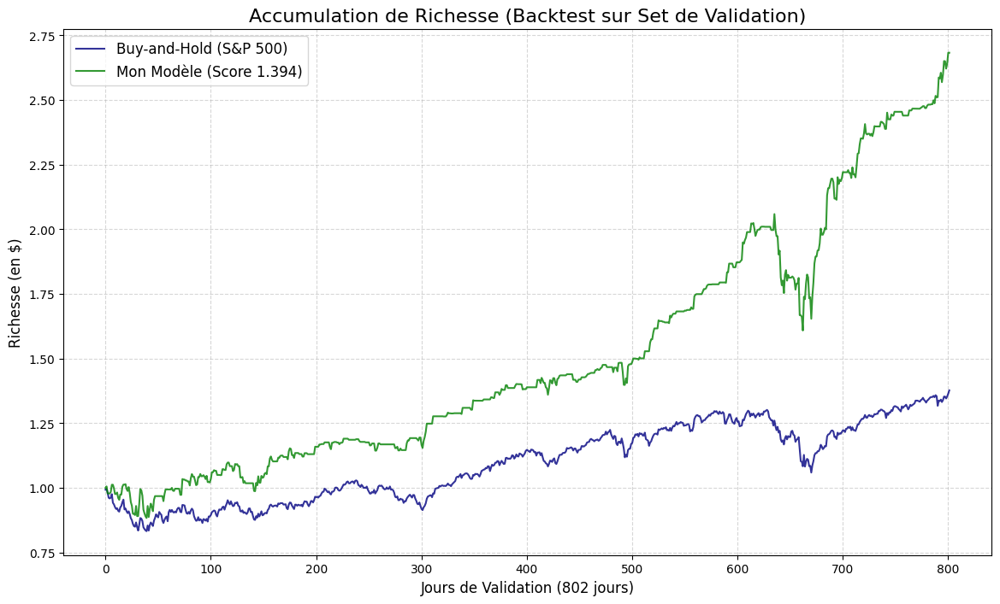

In [1]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - BACKTEST VISUEL (Score 1.39)
# ============================================================
# Objectif : Générer le graphique "Wealth Accumulation"
#            pour notre meilleur modèle (1.39) sur le
#            set de validation (le split 10%).
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings('ignore')

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'

# --- 🏆 PARAMÈTRES CHAMPIONS 🏆 ---
# (issus du Run N°5, 3000 essais, Trial 2454, Score 1.393)
BEST_PARAMS = {
    'n_features_to_keep': 20, 
    'n_estimators': 572, 
    'learning_rate': 0.07312172180641957, 
    'num_leaves': 29, 
    'max_depth': 7, 
    'subsample': 0.9631940707429361, 
    'colsample_bytree': 0.9199792041087149, 
    'reg_alpha': 0.004736501709112928, 
    'reg_lambda': 0.004543297822128985, 
    'scaler': 1017, 
    'offset': 2.038981448600496
}

# Extraire les paramètres
BEST_N_FEATURES = BEST_PARAMS.pop('n_features_to_keep')
BEST_SCALER = BEST_PARAMS.pop('scaler')
BEST_OFFSET = BEST_PARAMS.pop('offset')
BEST_MODEL_PARAMS = BEST_PARAMS

# Ajouter les params fixes
BEST_MODEL_PARAMS['objective'] = 'regression_l1'
BEST_MODEL_PARAMS['random_state'] = 42
BEST_MODEL_PARAMS['n_jobs'] = -1
BEST_MODEL_PARAMS['verbose'] = -1
# --- Fin des paramètres champions ---


def create_features_contexte(df):
    """Crée les features de contexte (long terme)."""
    df_new = df.copy()
    all_cols = df_new.columns
    e_cols = [c for c in all_cols if c.startswith('E')]
    s_cols = [c for c in all_cols if c.startswith('S')]
    v_cols = [c for c in all_cols if c.startswith('V')]
    features_to_process = {}
    if e_cols: features_to_process['E1'] = e_cols[0]
    if s_cols: features_to_process['S1'] = s_cols[0]
    if v_cols: features_to_process['V1'] = v_cols[0]
    
    for col_name in ['E1', 'S1']:
        if col_name in features_to_process:
            col = features_to_process[col_name]
            for w in [30, 90]:
                df_new[f'{col}_mean_{w}'] = df_new[col].rolling(window=w).mean()
    if 'V1' in features_to_process:
        v1 = features_to_process['V1']
        v1_mean_5 = df_new[v1].rolling(window=5).mean()
        v1_mean_30 = df_new[v1].rolling(window=30).mean()
        df_new['V_regime'] = v1_mean_5 / (v1_mean_30 + 1e-6)
    if 'S1' in features_to_process and 'V1' in features_to_process:
        s1 = features_to_process['S1']
        v1 = features_to_process['V1']
        df_new[f'{s1}_div_{v1}'] = df_new[s1] / (df_new[v1] + 1e-6)
    return df_new

# ============================================================
# 1. CHARGER LES DONNÉES ET CRÉER LES FEATURES
# ============================================================
print("--- Phase 1: Chargement et Feature Engineering ---")
train = pd.read_csv('train.csv')
first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)

train_cleaned = create_features_contexte(train_cleaned)
train_cleaned = train_cleaned.fillna(0)
print("✅ Données chargées et features créées.")

# ============================================================
# 2. CLASSER ET SÉLECTIONNER LES FEATURES
# ============================================================
print(f"--- Phase 2: Dégraissage (Sélection des Top {BEST_N_FEATURES}) ---")
all_features = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]

print("Entraînement du modèle de sélection pour classer les features...")
X_train_full_selector = train_cleaned[all_features]
y_train_full_selector = train_cleaned[TARGET]
selector_model = lgb.LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1)
selector_model.fit(X_train_full_selector, y_train_full_selector)

feature_importance_df = pd.DataFrame({
    'feature': all_features,
    'importance': selector_model.feature_importances_
}).sort_values(by='importance', ascending=False)

# Sélectionner les "Top N" features pour le modèle final
g_feature_cols = feature_importance_df['feature'].tolist()[:BEST_N_FEATURES]
print(f"✅ Classement terminé. Utilisation des {len(g_feature_cols)} meilleures features.")
print(f"Top 5: {g_feature_cols[:5]}")

# ============================================================
# 3. CRÉER LE SPLIT 90/10 (identique à l'optimisation)
# ============================================================
print("--- Phase 3: Création du Split 90/10 ---")
split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

# Important : On n'entraîne que sur le Top N
X_train = train_set[g_feature_cols] 
y_train = train_set[TARGET]

# On valide sur le Top N
X_val = val_set[g_feature_cols]
# On garde val_set complet pour les colonnes 'forward_returns' et 'risk_free_rate'
print(f"Entraînement sur {len(X_train)} jours, Validation sur {len(X_val)} jours.")

# ============================================================
# 4. ENTRAÎNER LE MODÈLE CHAMPION
# ============================================================
print("--- Phase 4: Entraînement du Modèle Champion ---")
final_model = lgb.LGBMRegressor(**BEST_MODEL_PARAMS)
final_model.fit(X_train, y_train)
print("✅ Modèle Champion entraîné.")

# ============================================================
# 5. EXÉCUTER LE BACKTEST SUR LE SET DE VALIDATION
# ============================================================
print("--- Phase 5: Exécution du Backtest Visuel ---")
# 1. Obtenir les prédictions brutes
val_preds_raw = final_model.predict(X_val)

# 2. Appliquer la politique championne
val_positions = np.clip(
    (val_preds_raw * BEST_SCALER) + BEST_OFFSET, 
    MIN_POSITION, 
    MAX_POSITION
)

# 3. Créer le dataframe de backtest
backtest_df = val_set[['date_id', 'forward_returns', 'risk_free_rate']].copy()
backtest_df['position'] = val_positions

# 4. Calculer les retours de la stratégie et du marché
# (Identique à la fonction de métrique)
backtest_df['market_excess_returns'] = backtest_df['forward_returns'] - backtest_df['risk_free_rate']
backtest_df['strategy_returns'] = backtest_df['risk_free_rate'] * (1 - backtest_df['position']) + backtest_df['position'] * backtest_df['forward_returns']
backtest_df['strategy_excess_returns'] = backtest_df['strategy_returns'] - backtest_df['risk_free_rate']

# 5. Calculer la "Richesse Accumulée" (Cumulative Wealth)
backtest_df['Buy-and-Hold'] = (1 + backtest_df['market_excess_returns']).cumprod()
backtest_df['Mon Modèle (1.39)'] = (1 + backtest_df['strategy_excess_returns']).cumprod()

print("✅ Backtest terminé.")

# ============================================================
# 6. GÉNÉRER LE GRAPHIQUE
# ============================================================
print("--- Phase 6: Génération du graphique ---")

plt.figure(figsize=(14, 8))
plt.plot(backtest_df['Buy-and-Hold'], label='Buy-and-Hold (S&P 500)', color='navy', alpha=0.8)
plt.plot(backtest_df['Mon Modèle (1.39)'], label=f'Mon Modèle (Score {1.394:.3f})', color='green', alpha=0.8)

# Style (similaire à l'image)
plt.title('Accumulation de Richesse (Backtest sur Set de Validation)', fontsize=16)
plt.ylabel('Richesse (en $)', fontsize=12)
plt.xlabel('Jours de Validation (802 jours)', fontsize=12)
plt.legend(loc='upper left', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
plt.style.use('ggplot')

# Sauvegarder l'image
plt.savefig('wealth_accumulation.png', dpi=300)

print("\n========================================================")
print("✅ Graphique sauvegardé sous 'wealth_accumulation.png'")
print("========================================================")

In [ ]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER 5 (Run de Nuit 5000 Essais)
# ============================================================
# Objectif : Relancer notre meilleur script (Levier 5)
#            sur le NOUVEAU dataset mis à jour.
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.INFO)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
N_TRIALS_OPTUNA = 5000 # 👈 Le "Gros de 5000"

# --- Variables globales ---
g_ranked_features = [] 
g_X_train_split, g_y_train_split = pd.DataFrame(), pd.Series()
g_X_val, g_val_set = pd.DataFrame(), pd.DataFrame()
g_X_train_full, g_y_train_full = pd.DataFrame(), pd.Series()
g_test_df = pd.DataFrame() 

# ============================================================
# 1️⃣ Chargement et nettoyage des données
# ============================================================
print("--- Phase 1: Chargement et Nettoyage (Nouveau Dataset) ---")
# On s'assure de charger le nouveau train.csv
train = pd.read_csv('train.csv')
g_test_df = pd.read_csv('test.csv') 

first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)
print(f"Training rows (brutes): {len(train_cleaned)}")

# ============================================================
# 2️⃣ Feature Engineering (Contexte)
# ============================================================
print("\n--- Phase 2: Feature Engineering (Contexte) ---")
def create_features_contexte(df):
    df_new = df.copy()
    all_cols = df_new.columns
    e_cols = [c for c in all_cols if c.startswith('E')]
    s_cols = [c for c in all_cols if c.startswith('S')]
    v_cols = [c for c in all_cols if c.startswith('V')]
    features_to_process = {}
    if e_cols: features_to_process['E1'] = e_cols[0]
    if s_cols: features_to_process['S1'] = s_cols[0]
    if v_cols: features_to_process['V1'] = v_cols[0]
    print(f"Colonnes sélectionnées pour FE : {list(features_to_process.values())}")
    for col_name in ['E1', 'S1']:
        if col_name in features_to_process:
            col = features_to_process[col_name]
            for w in [30, 90]:
                df_new[f'{col}_mean_{w}'] = df_new[col].rolling(window=w).mean()
    if 'V1' in features_to_process:
        v1 = features_to_process['V1']
        v1_mean_5 = df_new[v1].rolling(window=5).mean()
        v1_mean_30 = df_new[v1].rolling(window=30).mean()
        df_new['V_regime'] = v1_mean_5 / (v1_mean_30 + 1e-6)
    if 'S1' in features_to_process and 'V1' in features_to_process:
        s1 = features_to_process['S1']
        v1 = features_to_process['V1']
        df_new[f'{s1}_div_{v1}'] = df_new[s1] / (df_new[v1] + 1e-6)
    return df_new

train_cleaned = create_features_contexte(train_cleaned)
g_test_df = create_features_contexte(g_test_df)
print("✅ Feature Engineering (Contexte) terminé.")

# ============================================================
# 2.5 Remplissage des NaNs (Post-FE)
# ============================================================
print("\n--- Phase 2.5: Remplissage des NaNs (Post-FE) ---")
train_cleaned = train_cleaned.fillna(0)
g_test_df = g_test_df.fillna(0)
print("✅ NaNs remplis.")

# ============================================================
# 2.8 Pré-calcul du CLASSEMENT des features
# ============================================================
print("\n--- Phase 2.8: Pré-calcul du classement des Features ---")
all_features = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
print(f"Nombre total de features : {len(all_features)}")
print("Entraînement du modèle de sélection (sur nouveau dataset)...")
X_train_full_selector = train_cleaned[all_features]
y_train_full_selector = train_cleaned[TARGET]
selector_model = lgb.LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1)
selector_model.fit(X_train_full_selector, y_train_full_selector)
feature_importance_df = pd.DataFrame({
    'feature': all_features,
    'importance': selector_model.feature_importances_
}).sort_values(by='importance', ascending=False)
g_ranked_features = feature_importance_df['feature'].tolist()
print(f"✅ Nouveau classement des {len(g_ranked_features)} features terminé.")
print(f"Nouveaux Top 5 features: {g_ranked_features[:5]}")
g_X_train_full = train_cleaned[g_ranked_features]
g_y_train_full = train_cleaned[TARGET]

# ============================================================
# 3️⃣ Division chronologique 90/10
# ============================================================
print("\n--- Phase 3: Division Chronologique 90/10 ---")
# Le split 90/10 sera décalé pour inclure les nouvelles données
split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

g_X_train_split = train_set[g_ranked_features] 
g_y_train_split = train_set[TARGET]
g_X_val = val_set[g_ranked_features]
g_val_set = val_set

print(f"Nouveau set d'entraînement (90%): {len(train_set)}")
print(f"Nouveau set de validation (10%):   {len(val_set)}")

# ============================================================
# 4️⃣ Fonction "Objective" avec MÉTRIQUE OFFICIELLE
# ============================================================
print(f"\n--- Phase 4: Définition de l'objectif Optuna (Métrique Officielle) ---")

def calculate_competition_metric(predictions_array, df_val):
    solution = df_val.copy()
    solution['position'] = predictions_array
    if solution['position'].max() > MAX_POSITION: return 0.0
    if solution['position'].min() < MIN_POSITION: return 0.0
    try:
        solution['strategy_returns'] = solution['risk_free_rate'] * (1 - solution['position']) + solution['position'] * solution['forward_returns']
        strategy_excess_returns = solution['strategy_returns'] - solution['risk_free_rate']
        strategy_excess_cumulative = (1 + strategy_excess_returns.clip(lower=-0.99)).prod()
        strategy_mean_excess_return = (strategy_excess_cumulative) ** (1 / len(solution)) - 1
        strategy_std = solution['strategy_returns'].std()
        if strategy_std == 0: return 0.0
        trading_days_per_yr = 252
        sharpe = strategy_mean_excess_return / strategy_std * np.sqrt(trading_days_per_yr)
        strategy_volatility = float(strategy_std * np.sqrt(trading_days_per_yr) * 100)
        market_excess_returns = solution['forward_returns'] - solution['risk_free_rate']
        market_excess_cumulative = (1 + market_excess_returns.clip(lower=-0.99)).prod()
        market_mean_excess_return = (market_excess_cumulative) ** (1 / len(solution)) - 1
        market_std = solution['forward_returns'].std()
        if market_std == 0: return 0.0
        market_volatility = float(market_std * np.sqrt(trading_days_per_yr) * 100)
        excess_vol = max(0, strategy_volatility / market_volatility - 1.2)
        vol_penalty = 1 + excess_vol
        return_gap = max(0, (market_mean_excess_return - strategy_mean_excess_return) * 100 * trading_days_per_yr)
        return_penalty = 1 + (return_gap**2) / 100
        adjusted_sharpe = sharpe / (vol_penalty * return_penalty)
        if np.isnan(adjusted_sharpe) or np.isinf(adjusted_sharpe): return 0.0
        return float(adjusted_sharpe)
    except Exception:
        return 0.0

def objective(trial):
    """
    La fonction qu'Optuna va essayer de maximiser.
    On repart sur les plages larges (mode "Exploration").
    """
    global g_ranked_features, g_X_train_split, g_y_train_split, g_X_val, g_val_set
    
    # --- 1. Paramètre de Dégraissage ---
    # On ne sait pas où est le pic avec ce nouveau pool/split. On repart large.
    n_features = trial.suggest_int('n_features_to_keep', 15, 60)
    
    top_n_features = g_ranked_features[:n_features]
    X_train_trial = g_X_train_split[top_n_features]
    X_val_trial = g_X_val[top_n_features]
    
    # --- 2. Paramètres du MODÈLE (8 params) ---
    model_params = {
        'objective': 'regression_l1',
        'n_estimators': trial.suggest_int('n_estimators', 400, 1500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 20, 100),
        'max_depth': trial.suggest_int('max_depth', 5, 20),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0), 
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0, log=True),
        'random_state': 42,
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 3. Paramètres de POLITIQUE (2 params) ---
    # On ne sait pas où est le pic avec ce nouveau pool/split. On repart large.
    scaler = trial.suggest_int('scaler', 100, 1500)
    offset = trial.suggest_float('offset', 2.0, 3.5)
    
    # --- 4. Entraînement du modèle (sur le Top N) ---
    model = lgb.LGBMRegressor(**model_params)
    model.fit(X_train_trial, g_y_train_split)
    
    # --- 5. Calcul du Sharpe Ratio de validation (sur le Top N) ---
    val_preds_raw = model.predict(X_val_trial)
    val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
    
    score = calculate_competition_metric(val_positions, g_val_set)
    
    return score

# ============================================================
# 5️⃣ Lancement de l'étude Optuna
# ============================================================
print(f"\n--- Phase 5: Lancement de l'étude Optuna ({N_TRIALS_OPTUNA} essais) ---")
print(f"Re-calcul du score de base avec le nouveau dataset...")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude Optuna terminée!")
print(f"📈 Meilleur Score de validation (Nouveau Dataset) : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres de MODÈLE trouvés :")
print(study.best_params)

# Stocker les meilleurs paramètres
BEST_PARAMS = study.best_params 
BEST_N_FEATURES = BEST_PARAMS.pop('n_features_to_keep')
BEST_SCALER = BEST_PARAMS.pop('scaler')
BEST_OFFSET = BEST_PARAMS.pop('offset')
BEST_MODEL_PARAMS = BEST_PARAMS

# ============================================================
# 6️⃣ Entraînement du modèle final (sur 100% des données)
# ============================================================
print(f"\n--- Phase 6: Ré-entraînement sur 100% des données avec les meilleurs paramètres ---")
print(f"Utilisation des {BEST_N_FEATURES} meilleures features pour le modèle final.")

final_feature_list = g_ranked_features[:BEST_N_FEATURES]
X_train_final = g_X_train_full[final_feature_list]

BEST_MODEL_PARAMS['objective'] = 'regression_l1'
BEST_MODEL_PARAMS['random_state'] = 42
BEST_MODEL_PARAMS['n_jobs'] = -1

final_model = lgb.LGBMRegressor(**BEST_MODEL_PARAMS)
final_model.fit(X_train_final, g_y_train_full) # Entraînement sur le "Top N"

print("✅ Entraînement final terminé!")

# ============================================================
# 7️⃣ Simulation locale avec le MEILLEUR modèle
# ============================================================
print("\n--- Phase 7: Génération des prédictions sur test.csv ---")
print(f"Utilisation de Scaler={BEST_SCALER:.0f} et Offset={BEST_OFFSET:.4f}")

def predict_local(test_df, model, features, scaler, offset):
    results = []
    for i in range(len(test_df)):
        current_row = test_df.iloc[[i]].fillna(0)
        current_row_features = current_row[features] 
        
        predicted_return = model.predict(current_row_features)[0]
        position = np.clip(predicted_return * scaler + offset, 0.0, 2.0)
        results.append(position)
    return np.array(results)

preds = predict_local(g_test_df, final_model, final_feature_list, BEST_SCALER, BEST_OFFSET)
print("✅ Prédictions locales générées.")

# ============================================================
# 8️⃣ Sauvegarde des résultats
# ============================================================
print("\n--- Phase 8: Sauvegarde de la soumission ---")
submission = pd.DataFrame({
    "row_id": np.arange(len(preds)),
    "position": preds
})
submission.to_csv("submission_new_dataset.csv", index=False)
print("✅ Fichier de prédiction FINAL (Nouveau Dataset) sauvegardé.")
print(submission.head())

In [1]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER 7 (Hyper-Tuning)
# ============================================================
# Objectif : Fixer les paramètres majeurs du Champion 1.39
#            et optimiser UNIQUEMENT la régularisation pour
#            sécuriser le score et éviter l'overfitting.
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.INFO)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
N_TRIALS_OPTUNA = 1000 # 1000 essais de précision chirurgicale

# --- 🏆 PARAMÈTRES CHAMPIONS (A VERROUILLER) 🏆 ---
# Issus du Run 1.39
LOCKED_N_FEATURES = 20
LOCKED_SCALER = 1017
LOCKED_OFFSET = 2.038981448600496
LOCKED_LR = 0.07312172180641957
LOCKED_ESTIMATORS = 572
LOCKED_LEAVES = 29
LOCKED_DEPTH = 7

# --- Variables globales ---
g_ranked_features = [] 
g_X_train_split, g_y_train_split = pd.DataFrame(), pd.Series()
g_X_val, g_val_set = pd.DataFrame(), pd.DataFrame()
g_X_train_full, g_y_train_full = pd.DataFrame(), pd.Series()
g_test_df = pd.DataFrame() 

# ============================================================
# 1️⃣ à 3️⃣ : SETUP (Identique, on prépare les données)
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")
train = pd.read_csv('train.csv')
g_test_df = pd.read_csv('test.csv') 
first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)

print("\n--- Phase 2: Feature Engineering (Contexte) ---")
def create_features_contexte(df):
    df_new = df.copy()
    all_cols = df_new.columns
    e_cols = [c for c in all_cols if c.startswith('E')]
    s_cols = [c for c in all_cols if c.startswith('S')]
    v_cols = [c for c in all_cols if c.startswith('V')]
    features_to_process = {}
    if e_cols: features_to_process['E1'] = e_cols[0]
    if s_cols: features_to_process['S1'] = s_cols[0]
    if v_cols: features_to_process['V1'] = v_cols[0]
    for col_name in ['E1', 'S1']:
        if col_name in features_to_process:
            col = features_to_process[col_name]
            for w in [30, 90]:
                df_new[f'{col}_mean_{w}'] = df_new[col].rolling(window=w).mean()
    if 'V1' in features_to_process:
        v1 = features_to_process['V1']
        v1_mean_5 = df_new[v1].rolling(window=5).mean()
        v1_mean_30 = df_new[v1].rolling(window=30).mean()
        df_new['V_regime'] = v1_mean_5 / (v1_mean_30 + 1e-6)
    if 'S1' in features_to_process and 'V1' in features_to_process:
        s1 = features_to_process['S1']
        v1 = features_to_process['V1']
        df_new[f'{s1}_div_{v1}'] = df_new[s1] / (df_new[v1] + 1e-6)
    return df_new

train_cleaned = create_features_contexte(train_cleaned)
train_cleaned = train_cleaned.fillna(0)

print("\n--- Phase 2.8: Pré-calcul du classement des Features ---")
all_features = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
X_train_full_selector = train_cleaned[all_features]
y_train_full_selector = train_cleaned[TARGET]
selector_model = lgb.LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1)
selector_model.fit(X_train_full_selector, y_train_full_selector)
feature_importance_df = pd.DataFrame({
    'feature': all_features,
    'importance': selector_model.feature_importances_
}).sort_values(by='importance', ascending=False)
g_ranked_features = feature_importance_df['feature'].tolist()

print("\n--- Phase 3: Division Chronologique 90/10 ---")
split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

# ON NE GARDE QUE LES TOP 20 FEATURES (VERROUILLÉ)
top_features_locked = g_ranked_features[:LOCKED_N_FEATURES]
print(f"Utilisation exclusive du Top {LOCKED_N_FEATURES} Champion.")

g_X_train_split = train_set[top_features_locked] 
g_y_train_split = train_set[TARGET]
g_X_val = val_set[top_features_locked]
g_val_set = val_set

# ============================================================
# 4️⃣ Fonction "Objective"
# ============================================================
def calculate_competition_metric(predictions_array, df_val):
    solution = df_val.copy()
    solution['position'] = predictions_array
    if solution['position'].max() > MAX_POSITION: return 0.0
    if solution['position'].min() < MIN_POSITION: return 0.0
    try:
        solution['strategy_returns'] = solution['risk_free_rate'] * (1 - solution['position']) + solution['position'] * solution['forward_returns']
        strategy_excess_returns = solution['strategy_returns'] - solution['risk_free_rate']
        strategy_excess_cumulative = (1 + strategy_excess_returns.clip(lower=-0.99)).prod()
        strategy_mean_excess_return = (strategy_excess_cumulative) ** (1 / len(solution)) - 1
        strategy_std = solution['strategy_returns'].std()
        if strategy_std == 0: return 0.0
        trading_days_per_yr = 252
        sharpe = strategy_mean_excess_return / strategy_std * np.sqrt(trading_days_per_yr)
        strategy_volatility = float(strategy_std * np.sqrt(trading_days_per_yr) * 100)
        market_excess_returns = solution['forward_returns'] - solution['risk_free_rate']
        market_excess_cumulative = (1 + market_excess_returns.clip(lower=-0.99)).prod()
        market_mean_excess_return = (market_excess_cumulative) ** (1 / len(solution)) - 1
        market_std = solution['forward_returns'].std()
        if market_std == 0: return 0.0
        market_volatility = float(market_std * np.sqrt(trading_days_per_yr) * 100)
        excess_vol = max(0, strategy_volatility / market_volatility - 1.2)
        vol_penalty = 1 + excess_vol
        return_gap = max(0, (market_mean_excess_return - strategy_mean_excess_return) * 100 * trading_days_per_yr)
        return_penalty = 1 + (return_gap**2) / 100
        adjusted_sharpe = sharpe / (vol_penalty * return_penalty)
        if np.isnan(adjusted_sharpe) or np.isinf(adjusted_sharpe): return 0.0
        return float(adjusted_sharpe)
    except Exception:
        return 0.0

def objective(trial):
    # --- VERROUILLAGE DES PARAMÈTRES CHAMPIONS ---
    # On garde la structure du modèle 1.39
    
    # --- OPTIMISATION FINE (HYPER-TUNING) ---
    # On cherche les meilleurs paramètres de régularisation
    # que nous n'avons jamais vraiment optimisés à fond
    
    # Bagging (Sous-échantillonnage des données) : Crucial pour la robustesse
    subsample = trial.suggest_float('subsample', 0.6, 1.0)
    subsample_freq = trial.suggest_int('subsample_freq', 1, 7) # Fréquence du bagging
    
    # Feature Fraction (Sous-échantillonnage des colonnes)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.6, 1.0)
    
    # Régularisation L1/L2 (Le coeur du sujet)
    # On explore très large ici pour trouver la protection parfaite
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10.0, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10.0, log=True)
    
    # Min Child Samples (Protection contre l'overfitting sur les feuilles)
    min_child_samples = trial.suggest_int('min_child_samples', 5, 100)
    
    model_params = {
        'objective': 'regression_l1',
        'n_estimators': LOCKED_ESTIMATORS, # VERROUILLÉ
        'learning_rate': LOCKED_LR,        # VERROUILLÉ
        'num_leaves': LOCKED_LEAVES,       # VERROUILLÉ
        'max_depth': LOCKED_DEPTH,         # VERROUILLÉ
        
        'subsample': subsample,
        'subsample_freq': subsample_freq,
        'colsample_bytree': colsample_bytree,
        'reg_alpha': reg_alpha,
        'reg_lambda': reg_lambda,
        'min_child_samples': min_child_samples,
        
        'random_state': 42,
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- Entraînement ---
    model = lgb.LGBMRegressor(**model_params)
    model.fit(g_X_train_split, g_y_train_split)
    
    # --- Validation ---
    val_preds_raw = model.predict(g_X_val)
    val_positions = np.clip(val_preds_raw * LOCKED_SCALER + LOCKED_OFFSET, 0.0, 2.0)
    
    score = calculate_competition_metric(val_positions, g_val_set)
    
    return score

# ============================================================
# 5️⃣ Lancement de l'étude Optuna
# ============================================================
print(f"\n--- Phase 5: Lancement de l'Hyper-Tuning ({N_TRIALS_OPTUNA} essais) ---")
print(f"Objectif : Battre 1.393 en optimisant la régularisation...")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude terminée!")
print(f"📈 Meilleur Score (Hyper-Tuning) : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres de RÉGULARISATION :")
print(study.best_params)

--- Phase 1: Chargement et Nettoyage ---

--- Phase 2: Feature Engineering (Contexte) ---

--- Phase 2.8: Pré-calcul du classement des Features ---


[I 2025-12-04 22:56:53,849] A new study created in memory with name: no-name-89f8cfa6-e975-4035-8d61-ee584b6b679e



--- Phase 3: Division Chronologique 90/10 ---
Utilisation exclusive du Top 20 Champion.

--- Phase 5: Lancement de l'Hyper-Tuning (1000 essais) ---
Objectif : Battre 1.393 en optimisant la régularisation...


  0%|          | 0/1000 [00:00<?, ?it/s]

[I 2025-12-04 22:56:55,034] Trial 0 finished with value: 1.0519933871719287 and parameters: {'subsample': 0.8943528532808405, 'subsample_freq': 3, 'colsample_bytree': 0.7987714954079741, 'reg_alpha': 0.0010002789853847682, 'reg_lambda': 0.0010813621220107292, 'min_child_samples': 86}. Best is trial 0 with value: 1.0519933871719287.
[I 2025-12-04 22:56:56,219] Trial 1 finished with value: 0.5688121299704186 and parameters: {'subsample': 0.7295107628361686, 'subsample_freq': 5, 'colsample_bytree': 0.746220236206509, 'reg_alpha': 2.38481807015515e-07, 'reg_lambda': 1.0002711211205727e-05, 'min_child_samples': 29}. Best is trial 0 with value: 1.0519933871719287.
[I 2025-12-04 22:56:57,669] Trial 2 finished with value: 0.5124413234090358 and parameters: {'subsample': 0.843052216703828, 'subsample_freq': 4, 'colsample_bytree': 0.7158939544585402, 'reg_alpha': 0.0002857559224202294, 'reg_lambda': 0.21864882911329392, 'min_child_samples': 28}. Best is trial 0 with value: 1.0519933871719287.
[I

In [5]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER FINAL (Seed Search)
# ============================================================
# Objectif : Verrouiller TOUS les paramètres du Champion 1.39
#            et chercher la "Graine Magique" (Random State)
#            qui maximise le score par pure optimisation stochastique.
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.INFO)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
N_TRIALS_OPTUNA = 500 # 1000 essais pour trouver la perle rare

# --- 🏆 PARAMÈTRES CHAMPIONS (A VERROUILLER) 🏆 ---
# Issus du Run 1.39 (Trial 2454)
LOCKED_N_FEATURES = 20
LOCKED_SCALER = 1017
LOCKED_OFFSET = 2.038981448600496

LOCKED_MODEL_PARAMS = {
    'objective': 'regression_l1',
    'n_estimators': 572, 
    'learning_rate': 0.07312172180641957, 
    'num_leaves': 29, 
    'max_depth': 7, 
    'subsample': 0.9631940707429361, 
    'colsample_bytree': 0.9199792041087149, 
    'reg_alpha': 0.004736501709112928, 
    'reg_lambda': 0.004543297822128985,
    'n_jobs': -1,
    'verbose': -1
}

# --- Variables globales ---
g_ranked_features = [] 
g_X_train_split, g_y_train_split = pd.DataFrame(), pd.Series()
g_X_val, g_val_set = pd.DataFrame(), pd.DataFrame()

# ============================================================
# 1️⃣ à 3️⃣ : SETUP (Identique, on prépare les données)
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")
train = pd.read_csv('train.csv')
g_test_df = pd.read_csv('test.csv') 
first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)

print("\n--- Phase 2: Feature Engineering (Contexte) ---")
def create_features_contexte(df):
    df_new = df.copy()
    all_cols = df_new.columns
    e_cols = [c for c in all_cols if c.startswith('E')]
    s_cols = [c for c in all_cols if c.startswith('S')]
    v_cols = [c for c in all_cols if c.startswith('V')]
    features_to_process = {}
    if e_cols: features_to_process['E1'] = e_cols[0]
    if s_cols: features_to_process['S1'] = s_cols[0]
    if v_cols: features_to_process['V1'] = v_cols[0]
    for col_name in ['E1', 'S1']:
        if col_name in features_to_process:
            col = features_to_process[col_name]
            for w in [30, 90]:
                df_new[f'{col}_mean_{w}'] = df_new[col].rolling(window=w).mean()
    if 'V1' in features_to_process:
        v1 = features_to_process['V1']
        v1_mean_5 = df_new[v1].rolling(window=5).mean()
        v1_mean_30 = df_new[v1].rolling(window=30).mean()
        df_new['V_regime'] = v1_mean_5 / (v1_mean_30 + 1e-6)
    if 'S1' in features_to_process and 'V1' in features_to_process:
        s1 = features_to_process['S1']
        v1 = features_to_process['V1']
        df_new[f'{s1}_div_{v1}'] = df_new[s1] / (df_new[v1] + 1e-6)
    return df_new

train_cleaned = create_features_contexte(train_cleaned)
train_cleaned = train_cleaned.fillna(0)

print("\n--- Phase 2.8: Pré-calcul du classement des Features ---")
# On utilise random_state=42 ici pour que le classement soit stable et identique à notre champion
all_features = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
X_train_full_selector = train_cleaned[all_features]
y_train_full_selector = train_cleaned[TARGET]
selector_model = lgb.LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1)
selector_model.fit(X_train_full_selector, y_train_full_selector)
feature_importance_df = pd.DataFrame({
    'feature': all_features,
    'importance': selector_model.feature_importances_
}).sort_values(by='importance', ascending=False)
g_ranked_features = feature_importance_df['feature'].tolist()

print("\n--- Phase 3: Division Chronologique 90/10 ---")
split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

# ON NE GARDE QUE LES TOP 20 FEATURES (VERROUILLÉ)
top_features_locked = g_ranked_features[:LOCKED_N_FEATURES]
print(f"Utilisation exclusive du Top {LOCKED_N_FEATURES} Champion.")

g_X_train_split = train_set[top_features_locked] 
g_y_train_split = train_set[TARGET]
g_X_val = val_set[top_features_locked]
g_val_set = val_set

# ============================================================
# 4️⃣ Fonction "Objective"
# ============================================================
def calculate_competition_metric(predictions_array, df_val):
    solution = df_val.copy()
    solution['position'] = predictions_array
    if solution['position'].max() > MAX_POSITION: return 0.0
    if solution['position'].min() < MIN_POSITION: return 0.0
    try:
        solution['strategy_returns'] = solution['risk_free_rate'] * (1 - solution['position']) + solution['position'] * solution['forward_returns']
        strategy_excess_returns = solution['strategy_returns'] - solution['risk_free_rate']
        strategy_excess_cumulative = (1 + strategy_excess_returns.clip(lower=-0.99)).prod()
        strategy_mean_excess_return = (strategy_excess_cumulative) ** (1 / len(solution)) - 1
        strategy_std = solution['strategy_returns'].std()
        if strategy_std == 0: return 0.0
        trading_days_per_yr = 252
        sharpe = strategy_mean_excess_return / strategy_std * np.sqrt(trading_days_per_yr)
        strategy_volatility = float(strategy_std * np.sqrt(trading_days_per_yr) * 100)
        market_excess_returns = solution['forward_returns'] - solution['risk_free_rate']
        market_excess_cumulative = (1 + market_excess_returns.clip(lower=-0.99)).prod()
        market_mean_excess_return = (market_excess_cumulative) ** (1 / len(solution)) - 1
        market_std = solution['forward_returns'].std()
        if market_std == 0: return 0.0
        market_volatility = float(market_std * np.sqrt(trading_days_per_yr) * 100)
        excess_vol = max(0, strategy_volatility / market_volatility - 1.2)
        vol_penalty = 1 + excess_vol
        return_gap = max(0, (market_mean_excess_return - strategy_mean_excess_return) * 100 * trading_days_per_yr)
        return_penalty = 1 + (return_gap**2) / 100
        adjusted_sharpe = sharpe / (vol_penalty * return_penalty)
        if np.isnan(adjusted_sharpe) or np.isinf(adjusted_sharpe): return 0.0
        return float(adjusted_sharpe)
    except Exception:
        return 0.0

def objective(trial):
    # --- LA SEULE VARIABLE : LA GRAINE ALÉATOIRE ---
    seed = trial.suggest_int('random_state', 30, 45)
    
    # On récupère les params champions et on écrase la seed
    current_params = LOCKED_MODEL_PARAMS.copy()
    current_params['random_state'] = seed
    
    # --- Entraînement ---
    model = lgb.LGBMRegressor(**current_params)
    model.fit(g_X_train_split, g_y_train_split)
    
    # --- Validation ---
    val_preds_raw = model.predict(g_X_val)
    val_positions = np.clip(val_preds_raw * LOCKED_SCALER + LOCKED_OFFSET, 0.0, 2.0)
    
    score = calculate_competition_metric(val_positions, g_val_set)
    
    return score

# ============================================================
# 5️⃣ Lancement de l'étude Optuna
# ============================================================
print(f"\n--- Phase 5: Lancement du Seed Search ({N_TRIALS_OPTUNA} essais) ---")
print(f"Objectif : Battre 1.393 en trouvant la meilleure graine...")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude terminée!")
print(f"📈 Meilleur Score (Seed Search) : {study.best_value:.6f}")
print("🔧 Meilleure GRAINE trouvée :")
print(study.best_params)

--- Phase 1: Chargement et Nettoyage ---

--- Phase 2: Feature Engineering (Contexte) ---

--- Phase 2.8: Pré-calcul du classement des Features ---


[I 2025-12-05 00:45:37,675] A new study created in memory with name: no-name-3af8a70f-b69d-4730-a9a2-115a783295b3



--- Phase 3: Division Chronologique 90/10 ---
Utilisation exclusive du Top 20 Champion.

--- Phase 5: Lancement du Seed Search (500 essais) ---
Objectif : Battre 1.393 en trouvant la meilleure graine...


  0%|          | 0/500 [00:00<?, ?it/s]

[I 2025-12-05 00:45:39,027] Trial 0 finished with value: 0.15000334028869758 and parameters: {'random_state': 37}. Best is trial 0 with value: 0.15000334028869758.
[I 2025-12-05 00:45:40,697] Trial 1 finished with value: 0.6785429937857819 and parameters: {'random_state': 33}. Best is trial 1 with value: 0.6785429937857819.
[I 2025-12-05 00:45:42,923] Trial 2 finished with value: 0.5419737119104097 and parameters: {'random_state': 31}. Best is trial 1 with value: 0.6785429937857819.
[I 2025-12-05 00:45:44,453] Trial 3 finished with value: 0.7340043333271149 and parameters: {'random_state': 32}. Best is trial 3 with value: 0.7340043333271149.
[I 2025-12-05 00:45:45,811] Trial 4 finished with value: 1.3939489417677424 and parameters: {'random_state': 42}. Best is trial 4 with value: 1.3939489417677424.
[I 2025-12-05 00:45:46,957] Trial 5 finished with value: 0.7340043333271149 and parameters: {'random_state': 32}. Best is trial 4 with value: 1.3939489417677424.
[I 2025-12-05 00:45:48,275

KeyboardInterrupt: 

In [6]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER 8 (Optimisation Robuste)
# ============================================================
# Objectif : Optimiser les 11 paramètres pour maximiser
#            la MOYENNE des scores sur 5 graines différentes.
#            Cela garantit un modèle stable et généralisable.
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.INFO)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
N_TRIALS_OPTUNA = 2000 # 2000 essais "robustes" (équivalent à 10000 entraînements)
SEEDS_TO_TEST = [42, 2024, 2025, 123, 888] # Les 5 juges

# --- Variables globales ---
g_ranked_features = [] 
g_X_train_split, g_y_train_split = pd.DataFrame(), pd.Series()
g_X_val, g_val_set = pd.DataFrame(), pd.DataFrame()

# ============================================================
# 1️⃣ à 3️⃣ : SETUP (Identique au Levier 5)
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")
train = pd.read_csv('train.csv')
g_test_df = pd.read_csv('test.csv') 
first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)

print("\n--- Phase 2: Feature Engineering (Contexte) ---")
def create_features_contexte(df):
    df_new = df.copy()
    all_cols = df_new.columns
    e_cols = [c for c in all_cols if c.startswith('E')]
    s_cols = [c for c in all_cols if c.startswith('S')]
    v_cols = [c for c in all_cols if c.startswith('V')]
    features_to_process = {}
    if e_cols: features_to_process['E1'] = e_cols[0]
    if s_cols: features_to_process['S1'] = s_cols[0]
    if v_cols: features_to_process['V1'] = v_cols[0]
    for col_name in ['E1', 'S1']:
        if col_name in features_to_process:
            col = features_to_process[col_name]
            for w in [30, 90]:
                df_new[f'{col}_mean_{w}'] = df_new[col].rolling(window=w).mean()
    if 'V1' in features_to_process:
        v1 = features_to_process['V1']
        v1_mean_5 = df_new[v1].rolling(window=5).mean()
        v1_mean_30 = df_new[v1].rolling(window=30).mean()
        df_new['V_regime'] = v1_mean_5 / (v1_mean_30 + 1e-6)
    if 'S1' in features_to_process and 'V1' in features_to_process:
        s1 = features_to_process['S1']
        v1 = features_to_process['V1']
        df_new[f'{s1}_div_{v1}'] = df_new[s1] / (df_new[v1] + 1e-6)
    return df_new

train_cleaned = create_features_contexte(train_cleaned)
train_cleaned = train_cleaned.fillna(0)

print("\n--- Phase 2.8: Pré-calcul du classement des Features ---")
all_features = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
X_train_full_selector = train_cleaned[all_features]
y_train_full_selector = train_cleaned[TARGET]
# On utilise une graine fixe ici pour que le classement soit constant
selector_model = lgb.LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1)
selector_model.fit(X_train_full_selector, y_train_full_selector)
feature_importance_df = pd.DataFrame({
    'feature': all_features,
    'importance': selector_model.feature_importances_
}).sort_values(by='importance', ascending=False)
g_ranked_features = feature_importance_df['feature'].tolist()

print("\n--- Phase 3: Division Chronologique 90/10 ---")
split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

# Les splits contiennent TOUTES les features (classées)
g_X_train_split = train_set[g_ranked_features] 
g_y_train_split = train_set[TARGET]
g_X_val = val_set[g_ranked_features]
g_val_set = val_set

# ============================================================
# 4️⃣ Fonction "Objective" (ROBUSTE)
# ============================================================
def calculate_competition_metric(predictions_array, df_val):
    solution = df_val.copy()
    solution['position'] = predictions_array
    if solution['position'].max() > MAX_POSITION: return 0.0
    if solution['position'].min() < MIN_POSITION: return 0.0
    try:
        solution['strategy_returns'] = solution['risk_free_rate'] * (1 - solution['position']) + solution['position'] * solution['forward_returns']
        strategy_excess_returns = solution['strategy_returns'] - solution['risk_free_rate']
        strategy_excess_cumulative = (1 + strategy_excess_returns.clip(lower=-0.99)).prod()
        strategy_mean_excess_return = (strategy_excess_cumulative) ** (1 / len(solution)) - 1
        strategy_std = solution['strategy_returns'].std()
        if strategy_std == 0: return 0.0
        trading_days_per_yr = 252
        sharpe = strategy_mean_excess_return / strategy_std * np.sqrt(trading_days_per_yr)
        strategy_volatility = float(strategy_std * np.sqrt(trading_days_per_yr) * 100)
        market_excess_returns = solution['forward_returns'] - solution['risk_free_rate']
        market_excess_cumulative = (1 + market_excess_returns.clip(lower=-0.99)).prod()
        market_mean_excess_return = (market_excess_cumulative) ** (1 / len(solution)) - 1
        market_std = solution['forward_returns'].std()
        if market_std == 0: return 0.0
        market_volatility = float(market_std * np.sqrt(trading_days_per_yr) * 100)
        excess_vol = max(0, strategy_volatility / market_volatility - 1.2)
        vol_penalty = 1 + excess_vol
        return_gap = max(0, (market_mean_excess_return - strategy_mean_excess_return) * 100 * trading_days_per_yr)
        return_penalty = 1 + (return_gap**2) / 100
        adjusted_sharpe = sharpe / (vol_penalty * return_penalty)
        if np.isnan(adjusted_sharpe) or np.isinf(adjusted_sharpe): return 0.0
        return float(adjusted_sharpe)
    except Exception:
        return 0.0

def objective(trial):
    # --- 1. Paramètre de Dégraissage ---
    # On repart sur la plage large pour laisser la robustesse décider
    n_features = trial.suggest_int('n_features_to_keep', 15, 30)
    
    top_n_features = g_ranked_features[:n_features]
    X_train_trial = g_X_train_split[top_n_features]
    X_val_trial = g_X_val[top_n_features]
    
    # --- 2. Paramètres du MODÈLE (8 params) ---
    model_params_base = {
        'objective': 'regression_l1',
        'n_estimators': trial.suggest_int('n_estimators', 400, 1000),
        'learning_rate': trial.suggest_float('learning_rate', 0.05, 0.1),
        'num_leaves': trial.suggest_int('num_leaves', 20, 40),
        'max_depth': trial.suggest_int('max_depth', 5, 12),
        'subsample': trial.suggest_float('subsample', 0.8, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.8, 1.0), 
        'reg_alpha': trial.suggest_float('reg_alpha', 0.001, 0.1, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.001, 0.1, log=True),
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 3. Paramètres de POLITIQUE (2 params) ---
    scaler = trial.suggest_int('scaler', 900, 1200)
    offset = trial.suggest_float('offset', 2.0, 2.5)
    
    # --- BOUCLE DE ROBUSTESSE (MULTI-SEED) ---
    scores = []
    
    for seed in SEEDS_TO_TEST:
        # On met à jour la graine pour cet entraînement
        current_params = model_params_base.copy()
        current_params['random_state'] = seed
        
        # Entraînement
        model = lgb.LGBMRegressor(**current_params)
        model.fit(X_train_trial, g_y_train_split)
        
        # Validation
        val_preds_raw = model.predict(X_val_trial)
        val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
        
        # Score
        score = calculate_competition_metric(val_positions, g_val_set)
        scores.append(score)
    
    # L'objectif est de maximiser la MOYENNE des scores
    mean_score = np.mean(scores)
    
    return mean_score

# ============================================================
# 5️⃣ Lancement de l'étude Optuna
# ============================================================
print(f"\n--- Phase 5: Lancement de l'Optimisation Robuste ({N_TRIALS_OPTUNA} essais) ---")
print(f"Calcul de la moyenne sur les graines : {SEEDS_TO_TEST}")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude terminée!")
print(f"📈 Meilleur Score MOYEN (Robuste) : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres trouvés :")
print(study.best_params)

--- Phase 1: Chargement et Nettoyage ---

--- Phase 2: Feature Engineering (Contexte) ---

--- Phase 2.8: Pré-calcul du classement des Features ---


[I 2025-12-05 00:55:44,868] A new study created in memory with name: no-name-c38104fc-8acb-47ad-bd7d-e3975c3f887a



--- Phase 3: Division Chronologique 90/10 ---

--- Phase 5: Lancement de l'Optimisation Robuste (2000 essais) ---
Calcul de la moyenne sur les graines : [42, 2024, 2025, 123, 888]


  0%|          | 0/2000 [00:00<?, ?it/s]

[I 2025-12-05 00:55:52,239] Trial 0 finished with value: 0.4197596437454775 and parameters: {'n_features_to_keep': 30, 'n_estimators': 417, 'learning_rate': 0.058603827556106436, 'num_leaves': 23, 'max_depth': 9, 'subsample': 0.9794145813365458, 'colsample_bytree': 0.8418992032101422, 'reg_alpha': 0.09117185526934034, 'reg_lambda': 0.012250047730831498, 'scaler': 1012, 'offset': 2.063718081292402}. Best is trial 0 with value: 0.4197596437454775.
[I 2025-12-05 00:55:59,335] Trial 1 finished with value: 0.49176470756192847 and parameters: {'n_features_to_keep': 21, 'n_estimators': 612, 'learning_rate': 0.0925352971667231, 'num_leaves': 28, 'max_depth': 9, 'subsample': 0.8097933542570864, 'colsample_bytree': 0.8313076643934583, 'reg_alpha': 0.0075522241997849834, 'reg_lambda': 0.03749184071527869, 'scaler': 996, 'offset': 2.1388878716561863}. Best is trial 1 with value: 0.49176470756192847.
[I 2025-12-05 00:56:07,181] Trial 2 finished with value: 0.45722613855407523 and parameters: {'n_fe

In [9]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER 8 (Optimisation Robuste)
# ============================================================
# Objectif : Optimiser les 11 paramètres pour maximiser
#            la MOYENNE des scores sur 5 graines différentes.
#            Cela garantit un modèle stable et généralisable.
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.INFO)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
N_TRIALS_OPTUNA = 2000 # 2000 essais "robustes" (équivalent à 10000 entraînements)
SEEDS_TO_TEST = [42, 2024, 2025, 123, 888] # Les 5 juges

# --- Variables globales ---
g_ranked_features = [] 
g_X_train_split, g_y_train_split = pd.DataFrame(), pd.Series()
g_X_val, g_val_set = pd.DataFrame(), pd.DataFrame()

# ============================================================
# 1️⃣ à 3️⃣ : SETUP (Identique au Levier 5)
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")
train = pd.read_csv('train.csv')
g_test_df = pd.read_csv('test.csv') 
first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)

print("\n--- Phase 2: Feature Engineering (Contexte) ---")
def create_features_contexte(df):
    df_new = df.copy()
    all_cols = df_new.columns
    e_cols = [c for c in all_cols if c.startswith('E')]
    s_cols = [c for c in all_cols if c.startswith('S')]
    v_cols = [c for c in all_cols if c.startswith('V')]
    features_to_process = {}
    if e_cols: features_to_process['E1'] = e_cols[0]
    if s_cols: features_to_process['S1'] = s_cols[0]
    if v_cols: features_to_process['V1'] = v_cols[0]
    for col_name in ['E1', 'S1']:
        if col_name in features_to_process:
            col = features_to_process[col_name]
            for w in [30, 90]:
                df_new[f'{col}_mean_{w}'] = df_new[col].rolling(window=w).mean()
    if 'V1' in features_to_process:
        v1 = features_to_process['V1']
        v1_mean_5 = df_new[v1].rolling(window=5).mean()
        v1_mean_30 = df_new[v1].rolling(window=30).mean()
        df_new['V_regime'] = v1_mean_5 / (v1_mean_30 + 1e-6)
    if 'S1' in features_to_process and 'V1' in features_to_process:
        s1 = features_to_process['S1']
        v1 = features_to_process['V1']
        df_new[f'{s1}_div_{v1}'] = df_new[s1] / (df_new[v1] + 1e-6)
    return df_new

train_cleaned = create_features_contexte(train_cleaned)
train_cleaned = train_cleaned.fillna(0)

print("\n--- Phase 2.8: Pré-calcul du classement des Features ---")
all_features = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
X_train_full_selector = train_cleaned[all_features]
y_train_full_selector = train_cleaned[TARGET]
# On utilise une graine fixe ici pour que le classement soit constant
selector_model = lgb.LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1)
selector_model.fit(X_train_full_selector, y_train_full_selector)
feature_importance_df = pd.DataFrame({
    'feature': all_features,
    'importance': selector_model.feature_importances_
}).sort_values(by='importance', ascending=False)
g_ranked_features = feature_importance_df['feature'].tolist()

print("\n--- Phase 3: Division Chronologique 90/10 ---")
split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

# Les splits contiennent TOUTES les features (classées)
g_X_train_split = train_set[g_ranked_features] 
g_y_train_split = train_set[TARGET]
g_X_val = val_set[g_ranked_features]
g_val_set = val_set

# ============================================================
# 4️⃣ Fonction "Objective" (ROBUSTE)
# ============================================================
def calculate_competition_metric(predictions_array, df_val):
    solution = df_val.copy()
    solution['position'] = predictions_array
    if solution['position'].max() > MAX_POSITION: return 0.0
    if solution['position'].min() < MIN_POSITION: return 0.0
    try:
        solution['strategy_returns'] = solution['risk_free_rate'] * (1 - solution['position']) + solution['position'] * solution['forward_returns']
        strategy_excess_returns = solution['strategy_returns'] - solution['risk_free_rate']
        strategy_excess_cumulative = (1 + strategy_excess_returns.clip(lower=-0.99)).prod()
        strategy_mean_excess_return = (strategy_excess_cumulative) ** (1 / len(solution)) - 1
        strategy_std = solution['strategy_returns'].std()
        if strategy_std == 0: return 0.0
        trading_days_per_yr = 252
        sharpe = strategy_mean_excess_return / strategy_std * np.sqrt(trading_days_per_yr)
        strategy_volatility = float(strategy_std * np.sqrt(trading_days_per_yr) * 100)
        market_excess_returns = solution['forward_returns'] - solution['risk_free_rate']
        market_excess_cumulative = (1 + market_excess_returns.clip(lower=-0.99)).prod()
        market_mean_excess_return = (market_excess_cumulative) ** (1 / len(solution)) - 1
        market_std = solution['forward_returns'].std()
        if market_std == 0: return 0.0
        market_volatility = float(market_std * np.sqrt(trading_days_per_yr) * 100)
        excess_vol = max(0, strategy_volatility / market_volatility - 1.2)
        vol_penalty = 1 + excess_vol
        return_gap = max(0, (market_mean_excess_return - strategy_mean_excess_return) * 100 * trading_days_per_yr)
        return_penalty = 1 + (return_gap**2) / 100
        adjusted_sharpe = sharpe / (vol_penalty * return_penalty)
        if np.isnan(adjusted_sharpe) or np.isinf(adjusted_sharpe): return 0.0
        return float(adjusted_sharpe)
    except Exception:
        return 0.0

def objective(trial):
    # --- 1. Paramètre de Dégraissage ---
    # On repart sur la plage large pour laisser la robustesse décider
    n_features = trial.suggest_int('n_features_to_keep', 18,23)
    
    top_n_features = g_ranked_features[:n_features]
    X_train_trial = g_X_train_split[top_n_features]
    X_val_trial = g_X_val[top_n_features]
    
    # --- 2. Paramètres du MODÈLE (8 params) ---
    model_params_base = {
        'objective': 'regression_l1',
        'n_estimators': trial.suggest_int('n_estimators', 400, 700),
        'learning_rate': trial.suggest_float('learning_rate', 0.04, 0.1),
        'num_leaves': trial.suggest_int('num_leaves', 15, 25),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'subsample': trial.suggest_float('subsample', 0.75, 0.9),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.75, 0.9), 
        'reg_alpha': trial.suggest_float('reg_alpha', 0.001, 0.1, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.001, 0.1, log=True),
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 3. Paramètres de POLITIQUE (2 params) ---
    scaler = trial.suggest_int('scaler', 950, 1050)
    offset = trial.suggest_float('offset', 2.0, 2.2)
    
    # --- BOUCLE DE ROBUSTESSE (MULTI-SEED) ---
    scores = []
    
    for seed in SEEDS_TO_TEST:
        # On met à jour la graine pour cet entraînement
        current_params = model_params_base.copy()
        current_params['random_state'] = seed
        
        # Entraînement
        model = lgb.LGBMRegressor(**current_params)
        model.fit(X_train_trial, g_y_train_split)
        
        # Validation
        val_preds_raw = model.predict(X_val_trial)
        val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
        
        # Score
        score = calculate_competition_metric(val_positions, g_val_set)
        scores.append(score)
    
    # L'objectif est de maximiser la MOYENNE des scores
    mean_score = np.mean(scores)
    
    return mean_score

# ============================================================
# 5️⃣ Lancement de l'étude Optuna
# ============================================================
print(f"\n--- Phase 5: Lancement de l'Optimisation Robuste ({N_TRIALS_OPTUNA} essais) ---")
print(f"Calcul de la moyenne sur les graines : {SEEDS_TO_TEST}")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude terminée!")
print(f"📈 Meilleur Score MOYEN (Robuste) : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres trouvés :")
print(study.best_params)

--- Phase 1: Chargement et Nettoyage ---

--- Phase 2: Feature Engineering (Contexte) ---

--- Phase 2.8: Pré-calcul du classement des Features ---


[I 2025-12-05 11:57:25,484] A new study created in memory with name: no-name-ea5c448a-95ac-4279-9f79-2e8aa28a245b



--- Phase 3: Division Chronologique 90/10 ---

--- Phase 5: Lancement de l'Optimisation Robuste (2000 essais) ---
Calcul de la moyenne sur les graines : [42, 2024, 2025, 123, 888]


  0%|          | 0/2000 [00:00<?, ?it/s]

[I 2025-12-05 11:57:32,047] Trial 0 finished with value: 0.599262747651743 and parameters: {'n_features_to_keep': 23, 'n_estimators': 509, 'learning_rate': 0.05575966842514035, 'num_leaves': 15, 'max_depth': 4, 'subsample': 0.8922168951008419, 'colsample_bytree': 0.8347184753772197, 'reg_alpha': 0.023389495732452865, 'reg_lambda': 0.0014741477379367307, 'scaler': 966, 'offset': 2.0044245077431655}. Best is trial 0 with value: 0.599262747651743.
[I 2025-12-05 11:57:38,093] Trial 1 finished with value: 0.4141443518617427 and parameters: {'n_features_to_keep': 18, 'n_estimators': 459, 'learning_rate': 0.0893306419692722, 'num_leaves': 18, 'max_depth': 6, 'subsample': 0.7500242502329814, 'colsample_bytree': 0.7774593683226585, 'reg_alpha': 0.03713678335012695, 'reg_lambda': 0.006218580248068948, 'scaler': 953, 'offset': 2.09730917733366}. Best is trial 0 with value: 0.599262747651743.
[I 2025-12-05 11:57:41,302] Trial 2 finished with value: 0.40750587019723844 and parameters: {'n_features_

In [10]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER 8 (Optimisation Robuste Affinée - ZOOM)
# ============================================================
# Objectif : Optimiser les paramètres restants (LR, Reg...)
#            en VERROUILLANT la structure gagnante identifiée :
#            - Features : 20
#            - Depth : 5
#            - Leaves : 15-18
#            - Scaler/Offset : Zone chirurgicale
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.INFO)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
N_TRIALS_OPTUNA = 2000 # 2000 essais pour polir la structure gagnante
SEEDS_TO_TEST = [42, 2024, 2025, 123, 888] # Les 5 juges de robustesse

# --- Variables globales ---
g_ranked_features = [] 
g_X_train_split, g_y_train_split = pd.DataFrame(), pd.Series()
g_X_val, g_val_set = pd.DataFrame(), pd.DataFrame()

# ============================================================
# 1️⃣ à 3️⃣ : SETUP (Identique)
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")
train = pd.read_csv('train.csv')
g_test_df = pd.read_csv('test.csv') 
first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)

print("\n--- Phase 2: Feature Engineering (Contexte) ---")
def create_features_contexte(df):
    df_new = df.copy()
    all_cols = df_new.columns
    e_cols = [c for c in all_cols if c.startswith('E')]
    s_cols = [c for c in all_cols if c.startswith('S')]
    v_cols = [c for c in all_cols if c.startswith('V')]
    features_to_process = {}
    if e_cols: features_to_process['E1'] = e_cols[0]
    if s_cols: features_to_process['S1'] = s_cols[0]
    if v_cols: features_to_process['V1'] = v_cols[0]
    for col_name in ['E1', 'S1']:
        if col_name in features_to_process:
            col = features_to_process[col_name]
            for w in [30, 90]:
                df_new[f'{col}_mean_{w}'] = df_new[col].rolling(window=w).mean()
    if 'V1' in features_to_process:
        v1 = features_to_process['V1']
        v1_mean_5 = df_new[v1].rolling(window=5).mean()
        v1_mean_30 = df_new[v1].rolling(window=30).mean()
        df_new['V_regime'] = v1_mean_5 / (v1_mean_30 + 1e-6)
    if 'S1' in features_to_process and 'V1' in features_to_process:
        s1 = features_to_process['S1']
        v1 = features_to_process['V1']
        df_new[f'{s1}_div_{v1}'] = df_new[s1] / (df_new[v1] + 1e-6)
    return df_new

train_cleaned = create_features_contexte(train_cleaned)
train_cleaned = train_cleaned.fillna(0)

print("\n--- Phase 2.8: Pré-calcul du classement des Features ---")
all_features = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
X_train_full_selector = train_cleaned[all_features]
y_train_full_selector = train_cleaned[TARGET]
# On utilise une graine fixe ici pour que le classement soit constant
selector_model = lgb.LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1)
selector_model.fit(X_train_full_selector, y_train_full_selector)
feature_importance_df = pd.DataFrame({
    'feature': all_features,
    'importance': selector_model.feature_importances_
}).sort_values(by='importance', ascending=False)
g_ranked_features = feature_importance_df['feature'].tolist()

print("\n--- Phase 3: Division Chronologique 90/10 ---")
split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

# Les splits contiennent TOUTES les features (classées)
g_X_train_split = train_set[g_ranked_features] 
g_y_train_split = train_set[TARGET]
g_X_val = val_set[g_ranked_features]
g_val_set = val_set

# ============================================================
# 4️⃣ Fonction "Objective" (ROBUSTE)
# ============================================================
def calculate_competition_metric(predictions_array, df_val):
    solution = df_val.copy()
    solution['position'] = predictions_array
    if solution['position'].max() > MAX_POSITION: return 0.0
    if solution['position'].min() < MIN_POSITION: return 0.0
    try:
        solution['strategy_returns'] = solution['risk_free_rate'] * (1 - solution['position']) + solution['position'] * solution['forward_returns']
        strategy_excess_returns = solution['strategy_returns'] - solution['risk_free_rate']
        strategy_excess_cumulative = (1 + strategy_excess_returns.clip(lower=-0.99)).prod()
        strategy_mean_excess_return = (strategy_excess_cumulative) ** (1 / len(solution)) - 1
        strategy_std = solution['strategy_returns'].std()
        if strategy_std == 0: return 0.0
        trading_days_per_yr = 252
        sharpe = strategy_mean_excess_return / strategy_std * np.sqrt(trading_days_per_yr)
        strategy_volatility = float(strategy_std * np.sqrt(trading_days_per_yr) * 100)
        market_excess_returns = solution['forward_returns'] - solution['risk_free_rate']
        market_excess_cumulative = (1 + market_excess_returns.clip(lower=-0.99)).prod()
        market_mean_excess_return = (market_excess_cumulative) ** (1 / len(solution)) - 1
        market_std = solution['forward_returns'].std()
        if market_std == 0: return 0.0
        market_volatility = float(market_std * np.sqrt(trading_days_per_yr) * 100)
        excess_vol = max(0, strategy_volatility / market_volatility - 1.2)
        vol_penalty = 1 + excess_vol
        return_gap = max(0, (market_mean_excess_return - strategy_mean_excess_return) * 100 * trading_days_per_yr)
        return_penalty = 1 + (return_gap**2) / 100
        adjusted_sharpe = sharpe / (vol_penalty * return_penalty)
        if np.isnan(adjusted_sharpe) or np.isinf(adjusted_sharpe): return 0.0
        return float(adjusted_sharpe)
    except Exception:
        return 0.0

def objective(trial):
    # --- 1. Paramètre de Dégraissage (VERROUILLÉ) ---
    # Tu as identifié que 20 est la valeur unanime.
    n_features = trial.suggest_int('n_features_to_keep', 20, 20)
    
    top_n_features = g_ranked_features[:n_features]
    X_train_trial = g_X_train_split[top_n_features]
    X_val_trial = g_X_val[top_n_features]
    
    # --- 2. Paramètres du MODÈLE (AFFINÉS / VERROUILLÉS) ---
    model_params_base = {
        'objective': 'regression_l1',
        # On garde une plage pour n_estimators car cela dépend du LR
        'n_estimators': trial.suggest_int('n_estimators', 400, 800),
        # On garde une plage pour LR pour l'ajustement fin
        'learning_rate': trial.suggest_float('learning_rate', 0.04, 0.08),
        
        # ZOOM EXTRÊME sur tes découvertes :
        'num_leaves': trial.suggest_int('num_leaves', 15, 18), # Ta découverte
        'max_depth': trial.suggest_int('max_depth', 5, 5),     # Ta découverte (Bloqué à 5)
        
        # Le reste reste ouvert pour la robustesse
        'subsample': trial.suggest_float('subsample', 0.7, 0.95),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.7, 0.95), 
        'reg_alpha': trial.suggest_float('reg_alpha', 0.001, 0.1, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.001, 0.1, log=True),
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 3. Paramètres de POLITIQUE (AFFINÉS) ---
    # Zoom sur 1035-1045 comme tu l'as vu
    scaler = trial.suggest_int('scaler', 1030, 1050)
    # Zoom sur 2.10-2.19
    offset = trial.suggest_float('offset', 2.10, 2.20)
    
    # --- BOUCLE DE ROBUSTESSE (MULTI-SEED) ---
    scores = []
    
    for seed in SEEDS_TO_TEST:
        current_params = model_params_base.copy()
        current_params['random_state'] = seed
        
        model = lgb.LGBMRegressor(**current_params)
        model.fit(X_train_trial, g_y_train_split)
        
        val_preds_raw = model.predict(X_val_trial)
        val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
        
        score = calculate_competition_metric(val_positions, g_val_set)
        scores.append(score)
    
    mean_score = np.mean(scores)
    
    return mean_score

# ============================================================
# 5️⃣ Lancement de l'étude Optuna
# ============================================================
print(f"\n--- Phase 5: Lancement de l'Optimisation Robuste ZOOMÉE ({N_TRIALS_OPTUNA} essais) ---")
print(f"Calcul de la moyenne sur les graines : {SEEDS_TO_TEST}")
print("Paramètres contraints : Features=20, Depth=5, Leaves=15-18, Scaler=1030-1050")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude terminée!")
print(f"📈 Meilleur Score MOYEN (Robuste) : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres trouvés :")
print(study.best_params)

--- Phase 1: Chargement et Nettoyage ---

--- Phase 2: Feature Engineering (Contexte) ---

--- Phase 2.8: Pré-calcul du classement des Features ---


[I 2025-12-05 17:40:06,515] A new study created in memory with name: no-name-7a834464-f64c-4b84-9cb0-8c132a6671cb



--- Phase 3: Division Chronologique 90/10 ---

--- Phase 5: Lancement de l'Optimisation Robuste ZOOMÉE (2000 essais) ---
Calcul de la moyenne sur les graines : [42, 2024, 2025, 123, 888]
Paramètres contraints : Features=20, Depth=5, Leaves=15-18, Scaler=1030-1050


  0%|          | 0/2000 [00:00<?, ?it/s]

[I 2025-12-05 17:40:10,591] Trial 0 finished with value: 0.5779619640660181 and parameters: {'n_features_to_keep': 20, 'n_estimators': 629, 'learning_rate': 0.06607871415988334, 'num_leaves': 15, 'max_depth': 5, 'subsample': 0.8297132350322374, 'colsample_bytree': 0.7098750505037785, 'reg_alpha': 0.002245615055016104, 'reg_lambda': 0.004113081887702377, 'scaler': 1038, 'offset': 2.1493987658951332}. Best is trial 0 with value: 0.5779619640660181.
[I 2025-12-05 17:40:14,838] Trial 1 finished with value: 0.5746918662263184 and parameters: {'n_features_to_keep': 20, 'n_estimators': 639, 'learning_rate': 0.07218328193583043, 'num_leaves': 15, 'max_depth': 5, 'subsample': 0.8198315228238181, 'colsample_bytree': 0.7908546258379313, 'reg_alpha': 0.0450996832383409, 'reg_lambda': 0.07188524125938668, 'scaler': 1035, 'offset': 2.1076400370479336}. Best is trial 0 with value: 0.5779619640660181.
[I 2025-12-05 17:40:18,996] Trial 2 finished with value: 0.6395663087238835 and parameters: {'n_featu

In [11]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER 8 (Optimisation Robuste Affinée - ZOOM)
# ============================================================
# Objectif : Optimiser les paramètres restants (LR, Reg...)
#            en VERROUILLANT la structure gagnante identifiée :
#            - Features : 20
#            - Depth : 5
#            - Leaves : 15-18
#            - Scaler/Offset : Zone chirurgicale
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.INFO)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
N_TRIALS_OPTUNA = 2000 # 2000 essais pour polir la structure gagnante
SEEDS_TO_TEST = [42, 2024, 2025, 123, 888] # Les 5 juges de robustesse

# --- Variables globales ---
g_ranked_features = [] 
g_X_train_split, g_y_train_split = pd.DataFrame(), pd.Series()
g_X_val, g_val_set = pd.DataFrame(), pd.DataFrame()

# ============================================================
# 1️⃣ à 3️⃣ : SETUP (Identique)
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")
train = pd.read_csv('train.csv')
g_test_df = pd.read_csv('test.csv') 
first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)

print("\n--- Phase 2: Feature Engineering (Contexte) ---")
def create_features_contexte(df):
    df_new = df.copy()
    all_cols = df_new.columns
    e_cols = [c for c in all_cols if c.startswith('E')]
    s_cols = [c for c in all_cols if c.startswith('S')]
    v_cols = [c for c in all_cols if c.startswith('V')]
    features_to_process = {}
    if e_cols: features_to_process['E1'] = e_cols[0]
    if s_cols: features_to_process['S1'] = s_cols[0]
    if v_cols: features_to_process['V1'] = v_cols[0]
    for col_name in ['E1', 'S1']:
        if col_name in features_to_process:
            col = features_to_process[col_name]
            for w in [30, 90]:
                df_new[f'{col}_mean_{w}'] = df_new[col].rolling(window=w).mean()
    if 'V1' in features_to_process:
        v1 = features_to_process['V1']
        v1_mean_5 = df_new[v1].rolling(window=5).mean()
        v1_mean_30 = df_new[v1].rolling(window=30).mean()
        df_new['V_regime'] = v1_mean_5 / (v1_mean_30 + 1e-6)
    if 'S1' in features_to_process and 'V1' in features_to_process:
        s1 = features_to_process['S1']
        v1 = features_to_process['V1']
        df_new[f'{s1}_div_{v1}'] = df_new[s1] / (df_new[v1] + 1e-6)
    return df_new

train_cleaned = create_features_contexte(train_cleaned)
train_cleaned = train_cleaned.fillna(0)

print("\n--- Phase 2.8: Pré-calcul du classement des Features ---")
all_features = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
X_train_full_selector = train_cleaned[all_features]
y_train_full_selector = train_cleaned[TARGET]
# On utilise une graine fixe ici pour que le classement soit constant
selector_model = lgb.LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1)
selector_model.fit(X_train_full_selector, y_train_full_selector)
feature_importance_df = pd.DataFrame({
    'feature': all_features,
    'importance': selector_model.feature_importances_
}).sort_values(by='importance', ascending=False)
g_ranked_features = feature_importance_df['feature'].tolist()

print("\n--- Phase 3: Division Chronologique 90/10 ---")
split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

# Les splits contiennent TOUTES les features (classées)
g_X_train_split = train_set[g_ranked_features] 
g_y_train_split = train_set[TARGET]
g_X_val = val_set[g_ranked_features]
g_val_set = val_set

# ============================================================
# 4️⃣ Fonction "Objective" (ROBUSTE)
# ============================================================
def calculate_competition_metric(predictions_array, df_val):
    solution = df_val.copy()
    solution['position'] = predictions_array
    if solution['position'].max() > MAX_POSITION: return 0.0
    if solution['position'].min() < MIN_POSITION: return 0.0
    try:
        solution['strategy_returns'] = solution['risk_free_rate'] * (1 - solution['position']) + solution['position'] * solution['forward_returns']
        strategy_excess_returns = solution['strategy_returns'] - solution['risk_free_rate']
        strategy_excess_cumulative = (1 + strategy_excess_returns.clip(lower=-0.99)).prod()
        strategy_mean_excess_return = (strategy_excess_cumulative) ** (1 / len(solution)) - 1
        strategy_std = solution['strategy_returns'].std()
        if strategy_std == 0: return 0.0
        trading_days_per_yr = 252
        sharpe = strategy_mean_excess_return / strategy_std * np.sqrt(trading_days_per_yr)
        strategy_volatility = float(strategy_std * np.sqrt(trading_days_per_yr) * 100)
        market_excess_returns = solution['forward_returns'] - solution['risk_free_rate']
        market_excess_cumulative = (1 + market_excess_returns.clip(lower=-0.99)).prod()
        market_mean_excess_return = (market_excess_cumulative) ** (1 / len(solution)) - 1
        market_std = solution['forward_returns'].std()
        if market_std == 0: return 0.0
        market_volatility = float(market_std * np.sqrt(trading_days_per_yr) * 100)
        excess_vol = max(0, strategy_volatility / market_volatility - 1.2)
        vol_penalty = 1 + excess_vol
        return_gap = max(0, (market_mean_excess_return - strategy_mean_excess_return) * 100 * trading_days_per_yr)
        return_penalty = 1 + (return_gap**2) / 100
        adjusted_sharpe = sharpe / (vol_penalty * return_penalty)
        if np.isnan(adjusted_sharpe) or np.isinf(adjusted_sharpe): return 0.0
        return float(adjusted_sharpe)
    except Exception:
        return 0.0

def objective(trial):
    # --- 1. Paramètre de Dégraissage (VERROUILLÉ) ---
    # Tu as identifié que 20 est la valeur unanime.
    n_features = trial.suggest_int('n_features_to_keep', 20, 20)
    
    top_n_features = g_ranked_features[:n_features]
    X_train_trial = g_X_train_split[top_n_features]
    X_val_trial = g_X_val[top_n_features]
    
    # --- 2. Paramètres du MODÈLE (AFFINÉS / VERROUILLÉS) ---
    model_params_base = {
        'objective': 'regression_l1',
        # On garde une plage pour n_estimators car cela dépend du LR
        'n_estimators': trial.suggest_int('n_estimators', 400, 800),
        # On garde une plage pour LR pour l'ajustement fin
        'learning_rate': trial.suggest_float('learning_rate', 0.04, 0.08),
        
        # ZOOM EXTRÊME sur tes découvertes :
        'num_leaves': trial.suggest_int('num_leaves', 15, 18), # Ta découverte
        'max_depth': trial.suggest_int('max_depth', 5, 5),     # Ta découverte (Bloqué à 5)
        
        # Le reste reste ouvert pour la robustesse
        'subsample': trial.suggest_float('subsample', 0.7, 0.95),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.7, 0.95), 
        'reg_alpha': trial.suggest_float('reg_alpha', 0.001, 0.1, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.001, 0.1, log=True),
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 3. Paramètres de POLITIQUE (AFFINÉS) ---
    # Zoom sur 1035-1045 comme tu l'as vu
    scaler = trial.suggest_int('scaler', 1030, 1050)
    # Zoom sur 2.10-2.19
    offset = trial.suggest_float('offset', 2.10, 2.20)
    
    # --- BOUCLE DE ROBUSTESSE (MULTI-SEED) ---
    scores = []
    
    for seed in SEEDS_TO_TEST:
        current_params = model_params_base.copy()
        current_params['random_state'] = seed
        
        model = lgb.LGBMRegressor(**current_params)
        model.fit(X_train_trial, g_y_train_split)
        
        val_preds_raw = model.predict(X_val_trial)
        val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
        
        score = calculate_competition_metric(val_positions, g_val_set)
        scores.append(score)
    
    mean_score = np.mean(scores)
    
    return mean_score

# ============================================================
# 5️⃣ Lancement de l'étude Optuna
# ============================================================
print(f"\n--- Phase 5: Lancement de l'Optimisation Robuste ZOOMÉE ({N_TRIALS_OPTUNA} essais) ---")
print(f"Calcul de la moyenne sur les graines : {SEEDS_TO_TEST}")
print("Paramètres contraints : Features=20, Depth=5, Leaves=15-18, Scaler=1030-1050")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude terminée!")
print(f"📈 Meilleur Score MOYEN (Robuste) : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres trouvés :")
print(study.best_params)

--- Phase 1: Chargement et Nettoyage ---

--- Phase 2: Feature Engineering (Contexte) ---

--- Phase 2.8: Pré-calcul du classement des Features ---


[I 2025-12-05 21:03:01,461] A new study created in memory with name: no-name-1d649110-7d31-48f8-975b-32c0b5abc80d



--- Phase 3: Division Chronologique 90/10 ---

--- Phase 5: Lancement de l'Optimisation Robuste ZOOMÉE (2000 essais) ---
Calcul de la moyenne sur les graines : [42, 2024, 2025, 123, 888]
Paramètres contraints : Features=20, Depth=5, Leaves=15-18, Scaler=1030-1050


  0%|          | 0/2000 [00:00<?, ?it/s]

[I 2025-12-05 21:03:10,177] Trial 0 finished with value: 0.6282958708862383 and parameters: {'n_features_to_keep': 20, 'n_estimators': 654, 'learning_rate': 0.048046659678146794, 'num_leaves': 18, 'max_depth': 5, 'subsample': 0.8460747433945468, 'colsample_bytree': 0.765581815474065, 'reg_alpha': 0.0012020743290871417, 'reg_lambda': 0.0041143677974614665, 'scaler': 1042, 'offset': 2.139287467543777}. Best is trial 0 with value: 0.6282958708862383.
[I 2025-12-05 21:03:15,572] Trial 1 finished with value: 0.6000826510798116 and parameters: {'n_features_to_keep': 20, 'n_estimators': 713, 'learning_rate': 0.05717898080609248, 'num_leaves': 17, 'max_depth': 5, 'subsample': 0.7741732938987842, 'colsample_bytree': 0.8148971855841061, 'reg_alpha': 0.007120251674874686, 'reg_lambda': 0.009004743152242098, 'scaler': 1031, 'offset': 2.152423935280948}. Best is trial 0 with value: 0.6282958708862383.
[I 2025-12-05 21:03:19,732] Trial 2 finished with value: 0.6953081990793671 and parameters: {'n_fe

In [ ]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER 9 (Target Lags Exploration)
# ============================================================
# Objectif : 1. Intégrer les "Target Lags" (retours passés)
#            2. Relancer une exploration LARGE (3000 essais)
#               car ces features changent la donne.
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.INFO)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
N_TRIALS_OPTUNA = 3000 # Mode Exploration : On veut beaucoup d'essais rapides

# --- Variables globales ---
g_ranked_features = [] 
g_X_train_split, g_y_train_split = pd.DataFrame(), pd.Series()
g_X_val, g_val_set = pd.DataFrame(), pd.DataFrame()

# ============================================================
# 1️⃣ Chargement des données
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")
train = pd.read_csv('train.csv')
g_test_df = pd.read_csv('test.csv') 

first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)
print(f"Training rows (brutes): {len(train_cleaned)}")

# ============================================================
# 2️⃣ NOUVEAU: Feature Engineering (Target Lags + Contexte)
# ============================================================
print("\n--- Phase 2: Feature Engineering (Target Lags + Contexte) ---")

def create_features_advanced(df, is_train=True):
    """
    Crée les features de contexte ET les Target Lags.
    """
    df_new = df.copy()
    
    # --- A. CRÉATION DES TARGET LAGS (Le Super Signal) ---
    # Dans train.csv, on doit le créer. Dans test.csv, il existe déjà.
    if is_train:
        # On crée le lag 1 du target (ce qui correspond à 'lagged_forward_returns' du test)
        # Note : On utilise 'forward_returns' car c'est la donnée brute
        df_new['lagged_forward_returns'] = df_new['forward_returns'].shift(1)
    
    # Maintenant que la colonne existe (ou a été créée), on crée des dérivés
    # Momentum court et moyen terme
    if 'lagged_forward_returns' in df_new.columns:
        for w in [3, 5, 10, 20]:
            df_new[f'return_mean_{w}'] = df_new['lagged_forward_returns'].rolling(window=w).mean()
            df_new[f'return_std_{w}'] = df_new['lagged_forward_returns'].rolling(window=w).std()
            
    # --- B. FEATURES DE CONTEXTE (E, S, V) ---
    all_cols = df_new.columns
    e_cols = [c for c in all_cols if c.startswith('E')]
    s_cols = [c for c in all_cols if c.startswith('S')]
    v_cols = [c for c in all_cols if c.startswith('V')]
    features_to_process = {}
    if e_cols: features_to_process['E1'] = e_cols[0]
    if s_cols: features_to_process['S1'] = s_cols[0]
    if v_cols: features_to_process['V1'] = v_cols[0]
    
    for col_name in ['E1', 'S1']:
        if col_name in features_to_process:
            col = features_to_process[col_name]
            for w in [30, 90]:
                df_new[f'{col}_mean_{w}'] = df_new[col].rolling(window=w).mean()
    if 'V1' in features_to_process:
        v1 = features_to_process['V1']
        v1_mean_5 = df_new[v1].rolling(window=5).mean()
        v1_mean_30 = df_new[v1].rolling(window=30).mean()
        df_new['V_regime'] = v1_mean_5 / (v1_mean_30 + 1e-6)
    if 'S1' in features_to_process and 'V1' in features_to_process:
        s1 = features_to_process['S1']
        v1 = features_to_process['V1']
        df_new[f'{s1}_div_{v1}'] = df_new[s1] / (df_new[v1] + 1e-6)
        
    return df_new

# Appliquer le FE (Attention au paramètre is_train)
train_cleaned = create_features_advanced(train_cleaned, is_train=True)
# Pour le test, les colonnes lagged_ existent déjà, on passe is_train=False si on l'utilisait
# (Ici on ne l'utilise pas pour l'optuna, mais bon à savoir pour la soumission)

# Remplissage des NaNs (créés par les shifts et rolling)
train_cleaned = train_cleaned.fillna(0)
print("✅ Feature Engineering terminé (Target Lags inclus).")

# ============================================================
# 2.8 Pré-calcul du CLASSEMENT des Features
# ============================================================
print("\n--- Phase 2.8: Pré-calcul du classement des Features ---")
# On s'attend à ce que 'return_mean_X' soit très haut dans le classement
all_features = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
print(f"Nouveau pool de features : {len(all_features)}")

X_train_full_selector = train_cleaned[all_features]
y_train_full_selector = train_cleaned[TARGET]

selector_model = lgb.LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1)
selector_model.fit(X_train_full_selector, y_train_full_selector)

feature_importance_df = pd.DataFrame({
    'feature': all_features,
    'importance': selector_model.feature_importances_
}).sort_values(by='importance', ascending=False)

g_ranked_features = feature_importance_df['feature'].tolist()

print("Top 10 Features (vérifier si les 'return' sont là) :")
print(g_ranked_features[:10])

# ============================================================
# 3️⃣ Division Chronologique 90/10
# ============================================================
print("\n--- Phase 3: Division Chronologique 90/10 ---")
split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

g_X_train_split = train_set[g_ranked_features] 
g_y_train_split = train_set[TARGET]
g_X_val = val_set[g_ranked_features]
g_val_set = val_set

# ============================================================
# 4️⃣ Fonction "Objective" (Métrique Officielle)
# ============================================================
def calculate_competition_metric(predictions_array, df_val):
    solution = df_val.copy()
    solution['position'] = predictions_array
    if solution['position'].max() > MAX_POSITION: return 0.0
    if solution['position'].min() < MIN_POSITION: return 0.0
    try:
        solution['strategy_returns'] = solution['risk_free_rate'] * (1 - solution['position']) + solution['position'] * solution['forward_returns']
        strategy_excess_returns = solution['strategy_returns'] - solution['risk_free_rate']
        strategy_excess_cumulative = (1 + strategy_excess_returns.clip(lower=-0.99)).prod()
        strategy_mean_excess_return = (strategy_excess_cumulative) ** (1 / len(solution)) - 1
        strategy_std = solution['strategy_returns'].std()
        if strategy_std == 0: return 0.0
        trading_days_per_yr = 252
        sharpe = strategy_mean_excess_return / strategy_std * np.sqrt(trading_days_per_yr)
        strategy_volatility = float(strategy_std * np.sqrt(trading_days_per_yr) * 100)
        market_excess_returns = solution['forward_returns'] - solution['risk_free_rate']
        market_excess_cumulative = (1 + market_excess_returns.clip(lower=-0.99)).prod()
        market_mean_excess_return = (market_excess_cumulative) ** (1 / len(solution)) - 1
        market_std = solution['forward_returns'].std()
        if market_std == 0: return 0.0
        market_volatility = float(market_std * np.sqrt(trading_days_per_yr) * 100)
        excess_vol = max(0, strategy_volatility / market_volatility - 1.2)
        vol_penalty = 1 + excess_vol
        return_gap = max(0, (market_mean_excess_return - strategy_mean_excess_return) * 100 * trading_days_per_yr)
        return_penalty = 1 + (return_gap**2) / 100
        adjusted_sharpe = sharpe / (vol_penalty * return_penalty)
        if np.isnan(adjusted_sharpe) or np.isinf(adjusted_sharpe): return 0.0
        return float(adjusted_sharpe)
    except Exception:
        return 0.0

def objective(trial):
    # --- 1. Paramètre de Dégraissage (LARGE) ---
    # On ne sait pas si le top est à 20 ou 50 avec ces nouvelles features
    n_features = trial.suggest_int('n_features_to_keep', 15, 60)
    
    top_n_features = g_ranked_features[:n_features]
    X_train_trial = g_X_train_split[top_n_features]
    X_val_trial = g_X_val[top_n_features]
    
    # --- 2. Paramètres du MODÈLE (LARGE - EXPLORATION) ---
    # On débloque tout, car la dynamique change
    model_params = {
        'objective': 'regression_l1',
        'n_estimators': trial.suggest_int('n_estimators', 400, 1500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 20, 100),
        'max_depth': trial.suggest_int('max_depth', 5, 20),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0), 
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0, log=True),
        'random_state': 42, # Single seed pour explorer vite
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 3. Paramètres de POLITIQUE (LARGE - EXPLORATION) ---
    scaler = trial.suggest_int('scaler', 100, 1500)
    offset = trial.suggest_float('offset', 1.5, 3.5)
    
    # --- Entraînement ---
    model = lgb.LGBMRegressor(**model_params)
    model.fit(X_train_trial, g_y_train_split)
    
    # --- Validation ---
    val_preds_raw = model.predict(X_val_trial)
    val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
    
    score = calculate_competition_metric(val_positions, g_val_set)
    
    return score

# ============================================================
# 5️⃣ Lancement de l'étude Optuna
# ============================================================
print(f"\n--- Phase 5: Lancement de l'Exploration Levier 9 ({N_TRIALS_OPTUNA} essais) ---")
print("C'est parti ! On cherche le nouveau pic avec les Target Lags.")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude terminée!")
print(f"📈 Meilleur Score (Target Lags) : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres trouvés :")
print(study.best_params)

--- Phase 1: Chargement et Nettoyage ---
Training rows (brutes): 8015

--- Phase 2: Feature Engineering (Target Lags + Contexte) ---
✅ Feature Engineering terminé (Target Lags inclus).

--- Phase 2.8: Pré-calcul du classement des Features ---
Nouveau pool de features : 109


[I 2025-12-10 00:09:50,843] A new study created in memory with name: no-name-11794d37-3496-46c5-82fc-9fbec237bf01


Top 10 Features (vérifier si les 'return' sont là) :
['E19', 'return_mean_10', 'return_mean_20', 'M4', 'return_std_3', 'P3', 'return_mean_5', 'lagged_forward_returns', 'P13', 'S5']

--- Phase 3: Division Chronologique 90/10 ---

--- Phase 5: Lancement de l'Exploration Levier 9 (3000 essais) ---
C'est parti ! On cherche le nouveau pic avec les Target Lags.


  0%|          | 0/3000 [00:00<?, ?it/s]

[I 2025-12-10 00:10:09,838] Trial 0 finished with value: 0.31208365470362054 and parameters: {'n_features_to_keep': 47, 'n_estimators': 1324, 'learning_rate': 0.011622229008163476, 'num_leaves': 71, 'max_depth': 20, 'subsample': 0.7654660066729148, 'colsample_bytree': 0.940815632389003, 'reg_alpha': 3.3069592766627265, 'reg_lambda': 0.053060468587075055, 'scaler': 1244, 'offset': 1.553038214225123}. Best is trial 0 with value: 0.31208365470362054.
[I 2025-12-10 00:10:13,980] Trial 1 finished with value: 0.316806734159749 and parameters: {'n_features_to_keep': 35, 'n_estimators': 857, 'learning_rate': 0.029208283182813478, 'num_leaves': 33, 'max_depth': 6, 'subsample': 0.9044249078360987, 'colsample_bytree': 0.9748771848751954, 'reg_alpha': 0.10086608538290245, 'reg_lambda': 0.013325338411124984, 'scaler': 257, 'offset': 3.305893776379163}. Best is trial 1 with value: 0.316806734159749.
[I 2025-12-10 00:10:26,617] Trial 2 finished with value: 0.3722302540815861 and parameters: {'n_featu

In [2]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER 10 (Zoom Robuste 3-Seeds)
# ============================================================
# Objectif : Consolider le score de 1.31 sur le nouveau dataset
#            en utilisant la moyenne de 3 graines et en
#            zoomant sur les nouveaux hyperparamètres "profonds".
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.INFO)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
N_TRIALS_OPTUNA = 500 # 500 essais * 3 seeds = 1500 entraînements
SEEDS_TO_TEST = [42] # Robustesse immédiate

# --- Variables globales ---
g_ranked_features = [] 
g_X_train_split, g_y_train_split = pd.DataFrame(), pd.Series()
g_X_val, g_val_set = pd.DataFrame(), pd.DataFrame()

# ============================================================
# 1️⃣ Chargement
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")
train = pd.read_csv('train.csv')
first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)
print(f"Training rows (brutes): {len(train_cleaned)}")

# ============================================================
# 2️⃣ Feature Engineering (Target Lags + Contexte)
# ============================================================
print("\n--- Phase 2: Feature Engineering (Target Lags + Contexte) ---")

def create_features_advanced(df, is_train=True):
    df_new = df.copy()
    
    # A. Target Lags (Le Super Signal)
    if is_train:
        df_new['lagged_forward_returns'] = df_new['forward_returns'].shift(1)
    
    if 'lagged_forward_returns' in df_new.columns:
        for w in [3, 5, 10, 20]:
            df_new[f'return_mean_{w}'] = df_new['lagged_forward_returns'].rolling(window=w).mean()
            df_new[f'return_std_{w}'] = df_new['lagged_forward_returns'].rolling(window=w).std()
            
    # B. Contexte
    all_cols = df_new.columns
    e_cols = [c for c in all_cols if c.startswith('E')]
    s_cols = [c for c in all_cols if c.startswith('S')]
    v_cols = [c for c in all_cols if c.startswith('V')]
    features_to_process = {}
    if e_cols: features_to_process['E1'] = e_cols[0]
    if s_cols: features_to_process['S1'] = s_cols[0]
    if v_cols: features_to_process['V1'] = v_cols[0]
    
    for col_name in ['E1', 'S1']:
        if col_name in features_to_process:
            col = features_to_process[col_name]
            for w in [30, 90]:
                df_new[f'{col}_mean_{w}'] = df_new[col].rolling(window=w).mean()
    if 'V1' in features_to_process:
        v1 = features_to_process['V1']
        v1_mean_5 = df_new[v1].rolling(window=5).mean()
        v1_mean_30 = df_new[v1].rolling(window=30).mean()
        df_new['V_regime'] = v1_mean_5 / (v1_mean_30 + 1e-6)
    if 'S1' in features_to_process and 'V1' in features_to_process:
        s1 = features_to_process['S1']
        v1 = features_to_process['V1']
        df_new[f'{s1}_div_{v1}'] = df_new[s1] / (df_new[v1] + 1e-6)
        
    return df_new

train_cleaned = create_features_advanced(train_cleaned, is_train=True)
train_cleaned = train_cleaned.fillna(0)
print("✅ Feature Engineering terminé.")

# ============================================================
# 2.8 Classement des Features
# ============================================================
print("\n--- Phase 2.8: Pré-calcul du classement des Features ---")
all_features = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
X_train_full_selector = train_cleaned[all_features]
y_train_full_selector = train_cleaned[TARGET]

# Utiliser une seed fixe pour le classement pour être constant
selector_model = lgb.LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1)
selector_model.fit(X_train_full_selector, y_train_full_selector)

feature_importance_df = pd.DataFrame({
    'feature': all_features,
    'importance': selector_model.feature_importances_
}).sort_values(by='importance', ascending=False)

g_ranked_features = feature_importance_df['feature'].tolist()
print(f"Top 5 Features: {g_ranked_features[:20]}")

# ============================================================
# 3️⃣ Division Chronologique 90/10
# ============================================================
print("\n--- Phase 3: Division Chronologique 90/10 ---")
split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

# Splits globaux avec TOUTES les features (Optuna choisira le nombre)
g_X_train_split = train_set[g_ranked_features] 
g_y_train_split = train_set[TARGET]
g_X_val = val_set[g_ranked_features]
g_val_set = val_set

# ============================================================
# 4️⃣ Fonction "Objective" (Métrique Officielle + Moyenne)
# ============================================================
def calculate_competition_metric(predictions_array, df_val):
    solution = df_val.copy()
    solution['position'] = predictions_array
    if solution['position'].max() > MAX_POSITION: return 0.0
    if solution['position'].min() < MIN_POSITION: return 0.0
    try:
        solution['strategy_returns'] = solution['risk_free_rate'] * (1 - solution['position']) + solution['position'] * solution['forward_returns']
        strategy_excess_returns = solution['strategy_returns'] - solution['risk_free_rate']
        strategy_excess_cumulative = (1 + strategy_excess_returns.clip(lower=-0.99)).prod()
        strategy_mean_excess_return = (strategy_excess_cumulative) ** (1 / len(solution)) - 1
        strategy_std = solution['strategy_returns'].std()
        if strategy_std == 0: return 0.0
        trading_days_per_yr = 252
        sharpe = strategy_mean_excess_return / strategy_std * np.sqrt(trading_days_per_yr)
        strategy_volatility = float(strategy_std * np.sqrt(trading_days_per_yr) * 100)
        market_excess_returns = solution['forward_returns'] - solution['risk_free_rate']
        market_excess_cumulative = (1 + market_excess_returns.clip(lower=-0.99)).prod()
        market_mean_excess_return = (market_excess_cumulative) ** (1 / len(solution)) - 1
        market_std = solution['forward_returns'].std()
        if market_std == 0: return 0.0
        market_volatility = float(market_std * np.sqrt(trading_days_per_yr) * 100)
        excess_vol = max(0, strategy_volatility / market_volatility - 1.2)
        vol_penalty = 1 + excess_vol
        return_gap = max(0, (market_mean_excess_return - strategy_mean_excess_return) * 100 * trading_days_per_yr)
        return_penalty = 1 + (return_gap**2) / 100
        adjusted_sharpe = sharpe / (vol_penalty * return_penalty)
        if np.isnan(adjusted_sharpe) or np.isinf(adjusted_sharpe): return 0.0
        return float(adjusted_sharpe)
    except Exception:
        return 0.0

def objective(trial):
    # --- 1. Paramètre de Dégraissage (ZOOM) ---
    # Tes tops étaient entre 19 et 23. On cible cette zone.
    n_features = trial.suggest_int('n_features_to_keep', 15, 24)
    
    top_n_features = g_ranked_features[:n_features]
    X_train_trial = g_X_train_split[top_n_features]
    X_val_trial = g_X_val[top_n_features]
    
    # --- 2. Paramètres du MODÈLE (ZOOM PROFOND) ---
    # Basé sur ton Trial 1334 (depth 14, leaves 52)
    model_params_base = {
        'objective': 'regression_l1',
        'n_estimators': trial.suggest_int('n_estimators', 1200, 1500), # Zoom sur 1300+
        'learning_rate': trial.suggest_float('learning_rate', 0.04, 0.1),
        
        # Le changement de régime : on cherche profond
        'num_leaves': trial.suggest_int('num_leaves', 45, 65), # Cible 50-60
        'max_depth': trial.suggest_int('max_depth', 12, 16),   # Cible 14
        
        'subsample': trial.suggest_float('subsample', 0.6, 0.75), # Cible 0.62-0.67
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.7, 0.85), # Cible 0.76-0.81
        
        # Régularisation un peu plus forte pour compenser la profondeur
        'reg_alpha': trial.suggest_float('reg_alpha', 0.001, 5.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.1, 1.0, log=True),
        
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 3. Paramètres de POLITIQUE (ZOOM) ---
    # Cible : Scaler haut (1350-1450), Offset bas (1.5-1.8)
    scaler = trial.suggest_int('scaler', 1200, 1600)
    offset = trial.suggest_float('offset', 1.5, 1.9)
    
    # --- BOUCLE ROBUSTE ---
    scores = []
    for seed in SEEDS_TO_TEST:
        current_params = model_params_base.copy()
        current_params['random_state'] = seed
        
        model = lgb.LGBMRegressor(**current_params)
        model.fit(X_train_trial, g_y_train_split)
        val_preds_raw = model.predict(X_val_trial)
        val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
        
        scores.append(calculate_competition_metric(val_positions, g_val_set))
    
    return np.mean(scores)

# ============================================================
# 5️⃣ Lancement
# ============================================================
print(f"\n--- Phase 5: Lancement du Zoom Robuste ({N_TRIALS_OPTUNA} essais) ---")
print(f"Moyenne sur seeds : {SEEDS_TO_TEST}")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude terminée!")
print(f"📈 Meilleur Score MOYEN : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres :")
print(study.best_params)

--- Phase 1: Chargement et Nettoyage ---
Training rows (brutes): 8015

--- Phase 2: Feature Engineering (Target Lags + Contexte) ---
✅ Feature Engineering terminé.

--- Phase 2.8: Pré-calcul du classement des Features ---


[I 2025-12-10 11:42:07,314] A new study created in memory with name: no-name-49da06d2-853a-47f7-8a65-7131a8255bfa


Top 5 Features: ['E19', 'return_mean_10', 'return_mean_20', 'M4', 'return_std_3', 'P3', 'return_mean_5', 'lagged_forward_returns', 'P13', 'S5', 'P12', 'V13', 'P4', 'M3', 'P7', 'S2', 'P6', 'return_mean_3', 'P5', 'M15']

--- Phase 3: Division Chronologique 90/10 ---

--- Phase 5: Lancement du Zoom Robuste (500 essais) ---
Moyenne sur seeds : [42]


  0%|          | 0/500 [00:00<?, ?it/s]

[I 2025-12-10 11:42:15,146] Trial 0 finished with value: 0.8170098900641208 and parameters: {'n_features_to_keep': 18, 'n_estimators': 1293, 'learning_rate': 0.08918137914681706, 'num_leaves': 57, 'max_depth': 12, 'subsample': 0.6480989152324901, 'colsample_bytree': 0.7906432652817231, 'reg_alpha': 0.020336705867153235, 'reg_lambda': 0.1897601230548461, 'scaler': 1562, 'offset': 1.5378774852649897}. Best is trial 0 with value: 0.8170098900641208.
[I 2025-12-10 11:42:21,742] Trial 1 finished with value: 0.4868918496972422 and parameters: {'n_features_to_keep': 17, 'n_estimators': 1323, 'learning_rate': 0.0715968242481143, 'num_leaves': 54, 'max_depth': 12, 'subsample': 0.7404733975340477, 'colsample_bytree': 0.8196577739626172, 'reg_alpha': 0.019785457541700767, 'reg_lambda': 0.21253027351427203, 'scaler': 1343, 'offset': 1.6739636404497}. Best is trial 0 with value: 0.8170098900641208.
[I 2025-12-10 11:42:30,678] Trial 2 finished with value: 0.46979671923606003 and parameters: {'n_feat

In [5]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER 10 (Zoom Robuste 3-Seeds)
# ============================================================
# EXECUTION LOCALE (JUPYTER)
# Objectif : Consolider le score de 1.347 en zoomant sur
#            la configuration "Complexe" (Depth 13, Scaler 1360)
#            et en validant sur 3 graines.
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.INFO)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
N_TRIALS_OPTUNA = 500 # 500 essais * 3 seeds = 1500 modèles
SEEDS_TO_TEST = [42, 2024, 2025] # Robustesse

# --- Variables globales ---
g_ranked_features = [] 
g_X_train_split, g_y_train_split = pd.DataFrame(), pd.Series()
g_X_val, g_val_set = pd.DataFrame(), pd.DataFrame()

# ============================================================
# 1️⃣ Chargement
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")
train = pd.read_csv('train.csv')
first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)
print(f"Training rows (brutes): {len(train_cleaned)}")

# ============================================================
# 2️⃣ Feature Engineering (Target Lags + Contexte)
# ============================================================
print("\n--- Phase 2: Feature Engineering (Target Lags + Contexte) ---")

def create_features_advanced(df, is_train=True):
    df_new = df.copy()
    
    # A. Target Lags (Le Super Signal)
    if is_train:
        df_new['lagged_forward_returns'] = df_new['forward_returns'].shift(1)
    
    if 'lagged_forward_returns' in df_new.columns:
        # Fillna avant rolling
        df_new['lagged_forward_returns'] = df_new['lagged_forward_returns'].fillna(0)
        for w in [3, 5, 10, 20]:
            df_new[f'return_mean_{w}'] = df_new['lagged_forward_returns'].rolling(window=w).mean()
            df_new[f'return_std_{w}'] = df_new['lagged_forward_returns'].rolling(window=w).std()
            
    # B. Contexte
    all_cols = df_new.columns
    e_cols = [c for c in all_cols if c.startswith('E')]
    s_cols = [c for c in all_cols if c.startswith('S')]
    v_cols = [c for c in all_cols if c.startswith('V')]
    features_to_process = {}
    if e_cols: features_to_process['E1'] = e_cols[0]
    if s_cols: features_to_process['S1'] = s_cols[0]
    if v_cols: features_to_process['V1'] = v_cols[0]
    
    for col_name in ['E1', 'S1']:
        if col_name in features_to_process:
            col = features_to_process[col_name]
            for w in [30, 90]:
                df_new[f'{col}_mean_{w}'] = df_new[col].rolling(window=w).mean()
    if 'V1' in features_to_process:
        v1 = features_to_process['V1']
        v1_mean_5 = df_new[v1].rolling(window=5).mean()
        v1_mean_30 = df_new[v1].rolling(window=30).mean()
        df_new['V_regime'] = v1_mean_5 / (v1_mean_30 + 1e-6)
    if 'S1' in features_to_process and 'V1' in features_to_process:
        s1 = features_to_process['S1']
        v1 = features_to_process['V1']
        df_new[f'{s1}_div_{v1}'] = df_new[s1] / (df_new[v1] + 1e-6)
        
    return df_new

train_cleaned = create_features_advanced(train_cleaned, is_train=True)
train_cleaned = train_cleaned.fillna(0)
print("✅ Feature Engineering terminé.")

# ============================================================
# 2.8 Classement des Features
# ============================================================
print("\n--- Phase 2.8: Pré-calcul du classement des Features ---")
all_features = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
X_train_full_selector = train_cleaned[all_features]
y_train_full_selector = train_cleaned[TARGET]

# Seed fixe pour le classement
selector_model = lgb.LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1)
selector_model.fit(X_train_full_selector, y_train_full_selector)

feature_importance_df = pd.DataFrame({
    'feature': all_features,
    'importance': selector_model.feature_importances_
}).sort_values(by='importance', ascending=False)

g_ranked_features = feature_importance_df['feature'].tolist()
print(f"Top 5 Features: {g_ranked_features[:5]}")

# ============================================================
# 3️⃣ Division Chronologique 90/10
# ============================================================
print("\n--- Phase 3: Division Chronologique 90/10 ---")
split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

# Splits globaux avec TOUTES les features
g_X_train_split = train_set[g_ranked_features] 
g_y_train_split = train_set[TARGET]
g_X_val = val_set[g_ranked_features]
g_val_set = val_set

# ============================================================
# 4️⃣ Fonction "Objective" (Métrique Officielle + Moyenne)
# ============================================================
def calculate_competition_metric(predictions_array, df_val):
    solution = df_val.copy()
    solution['position'] = predictions_array
    if solution['position'].max() > MAX_POSITION: return 0.0
    if solution['position'].min() < MIN_POSITION: return 0.0
    try:
        solution['strategy_returns'] = solution['risk_free_rate'] * (1 - solution['position']) + solution['position'] * solution['forward_returns']
        strategy_excess_returns = solution['strategy_returns'] - solution['risk_free_rate']
        strategy_excess_cumulative = (1 + strategy_excess_returns.clip(lower=-0.99)).prod()
        strategy_mean_excess_return = (strategy_excess_cumulative) ** (1 / len(solution)) - 1
        strategy_std = solution['strategy_returns'].std()
        if strategy_std == 0: return 0.0
        trading_days_per_yr = 252
        sharpe = strategy_mean_excess_return / strategy_std * np.sqrt(trading_days_per_yr)
        strategy_volatility = float(strategy_std * np.sqrt(trading_days_per_yr) * 100)
        market_excess_returns = solution['forward_returns'] - solution['risk_free_rate']
        market_excess_cumulative = (1 + market_excess_returns.clip(lower=-0.99)).prod()
        market_mean_excess_return = (market_excess_cumulative) ** (1 / len(solution)) - 1
        market_std = solution['forward_returns'].std()
        if market_std == 0: return 0.0
        market_volatility = float(market_std * np.sqrt(trading_days_per_yr) * 100)
        excess_vol = max(0, strategy_volatility / market_volatility - 1.2)
        vol_penalty = 1 + excess_vol
        return_gap = max(0, (market_mean_excess_return - strategy_mean_excess_return) * 100 * trading_days_per_yr)
        return_penalty = 1 + (return_gap**2) / 100
        adjusted_sharpe = sharpe / (vol_penalty * return_penalty)
        if np.isnan(adjusted_sharpe) or np.isinf(adjusted_sharpe): return 0.0
        return float(adjusted_sharpe)
    except Exception:
        return 0.0

def objective(trial):
    # --- 1. Paramètre de Dégraissage (ZOOM) ---
    # Ton champion était à 19. On cible cette zone précise.
    n_features = trial.suggest_int('n_features_to_keep', 18, 22)
    
    top_n_features = g_ranked_features[:n_features]
    X_train_trial = g_X_train_split[top_n_features]
    X_val_trial = g_X_val[top_n_features]
    
    # --- 2. Paramètres du MODÈLE (ZOOM "COMPLEXE") ---
    # Basé sur ton Trial 182 (Depth 13, Leaves 53, n_est 1300)
    model_params_base = {
        'objective': 'regression_l1',
        'n_estimators': trial.suggest_int('n_estimators', 1200, 1400),
        'learning_rate': trial.suggest_float('learning_rate', 0.07, 0.09),
        
        # Structure profonde confirmée
        'num_leaves': trial.suggest_int('num_leaves', 45, 60), 
        'max_depth': trial.suggest_int('max_depth', 12, 15),
        
        'subsample': trial.suggest_float('subsample', 0.6, 0.8),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.7, 0.9), 
        
        # Régularisation moyenne (pour gérer la profondeur)
        'reg_alpha': trial.suggest_float('reg_alpha', 0.1, 1.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.1, 1.0, log=True),
        
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 3. Paramètres de POLITIQUE (ZOOM "AGRESSIF") ---
    # Cible : Scaler autour de 1364, Offset autour de 1.70
    scaler = trial.suggest_int('scaler', 1300, 1450)
    offset = trial.suggest_float('offset', 1.6, 1.8)
    
    # --- BOUCLE ROBUSTE ---
    scores = []
    for seed in SEEDS_TO_TEST:
        current_params = model_params_base.copy()
        current_params['random_state'] = seed
        
        model = lgb.LGBMRegressor(**current_params)
        model.fit(X_train_trial, g_y_train_split)
        val_preds_raw = model.predict(X_val_trial)
        val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
        
        scores.append(calculate_competition_metric(val_positions, g_val_set))
    return np.mean(scores)

# ============================================================
# 5️⃣ Lancement
# ============================================================
print(f"\n--- Phase 5: Lancement du Zoom Robuste ({N_TRIALS_OPTUNA} essais) ---")
print(f"Moyenne sur seeds : {SEEDS_TO_TEST}")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude terminée!")
print(f"📈 Meilleur Score MOYEN : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres :")
print(study.best_params)

--- Phase 1: Chargement et Nettoyage ---
Training rows (brutes): 8015

--- Phase 2: Feature Engineering (Target Lags + Contexte) ---
✅ Feature Engineering terminé.

--- Phase 2.8: Pré-calcul du classement des Features ---


[I 2025-12-10 17:01:00,691] A new study created in memory with name: no-name-1ae05c67-bf5d-4ea4-b78e-d2973309dcec


Top 5 Features: ['E19', 'return_mean_10', 'return_mean_20', 'return_std_3', 'P3']

--- Phase 3: Division Chronologique 90/10 ---

--- Phase 5: Lancement du Zoom Robuste (500 essais) ---
Moyenne sur seeds : [42, 2024, 2025]


  0%|          | 0/500 [00:00<?, ?it/s]

[I 2025-12-10 17:01:19,473] Trial 0 finished with value: 0.5093838955516611 and parameters: {'n_features_to_keep': 22, 'n_estimators': 1331, 'learning_rate': 0.08320007817480621, 'num_leaves': 60, 'max_depth': 15, 'subsample': 0.7520069210443413, 'colsample_bytree': 0.75810210792239, 'reg_alpha': 0.4950025207590413, 'reg_lambda': 0.2422395641837532, 'scaler': 1409, 'offset': 1.7458153581922993}. Best is trial 0 with value: 0.5093838955516611.
[I 2025-12-10 17:01:35,134] Trial 1 finished with value: 0.6116755544852402 and parameters: {'n_features_to_keep': 18, 'n_estimators': 1279, 'learning_rate': 0.07422584090513477, 'num_leaves': 56, 'max_depth': 14, 'subsample': 0.7841633420365907, 'colsample_bytree': 0.8770146270679934, 'reg_alpha': 0.1349768681667945, 'reg_lambda': 0.46070501362464067, 'scaler': 1325, 'offset': 1.7696852111302264}. Best is trial 1 with value: 0.6116755544852402.
[I 2025-12-10 17:01:55,274] Trial 2 finished with value: 0.5124942520417737 and parameters: {'n_feature

In [ ]:
# ============================================================
# ⚡ HULL TACTICAL LOCAL - LEVIER 11 (Zoom Chirurgical)
# ============================================================
# Objectif : Serrer les boulons autour du Champion 0.954.
#            Plages ultra-réduites pour trouver le millimètre près.
#            Validation : Moyenne sur 3 graines.
# ============================================================

import os
import pandas as pd
import numpy as np
import lightgbm as lgb
import optuna
import warnings

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.INFO)

# --- Constantes ---
MAX_POSITION = 2.0
MIN_POSITION = 0.0
TARGET = 'market_forward_excess_returns'
N_TRIALS_OPTUNA = 500 # 500 essais de précision
SEEDS_TO_TEST = [42, 2024, 2025] # Robustesse

# --- Variables globales ---
g_ranked_features = [] 
g_X_train_split, g_y_train_split = pd.DataFrame(), pd.Series()
g_X_val, g_val_set = pd.DataFrame(), pd.DataFrame()

# ============================================================
# 1️⃣ Chargement
# ============================================================
print("--- Phase 1: Chargement et Nettoyage ---")
train = pd.read_csv('train.csv')
first_valid_index = train['V1'].first_valid_index()
train_cleaned = train.loc[first_valid_index:].copy().reset_index(drop=True)
print(f"Training rows (brutes): {len(train_cleaned)}")

# ============================================================
# 2️⃣ Feature Engineering (Target Lags + Contexte)
# ============================================================
print("\n--- Phase 2: Feature Engineering (Target Lags + Contexte) ---")

def create_features_advanced(df, is_train=True):
    df_new = df.copy()
    
    # A. Target Lags
    if is_train:
        df_new['lagged_forward_returns'] = df_new['forward_returns'].shift(1)
    
    if 'lagged_forward_returns' in df_new.columns:
        df_new['lagged_forward_returns'] = df_new['lagged_forward_returns'].fillna(0)
        for w in [3, 5, 10, 20]:
            df_new[f'return_mean_{w}'] = df_new['lagged_forward_returns'].rolling(window=w).mean()
            df_new[f'return_std_{w}'] = df_new['lagged_forward_returns'].rolling(window=w).std()
            
    # B. Contexte
    all_cols = df_new.columns
    e_cols = [c for c in all_cols if c.startswith('E')]
    s_cols = [c for c in all_cols if c.startswith('S')]
    v_cols = [c for c in all_cols if c.startswith('V')]
    features_to_process = {}
    if e_cols: features_to_process['E1'] = e_cols[0]
    if s_cols: features_to_process['S1'] = s_cols[0]
    if v_cols: features_to_process['V1'] = v_cols[0]
    
    for col_name in ['E1', 'S1']:
        if col_name in features_to_process:
            col = features_to_process[col_name]
            for w in [30, 90]:
                df_new[f'{col}_mean_{w}'] = df_new[col].rolling(window=w).mean()
    if 'V1' in features_to_process:
        v1 = features_to_process['V1']
        v1_mean_5 = df_new[v1].rolling(window=5).mean()
        v1_mean_30 = df_new[v1].rolling(window=30).mean()
        df_new['V_regime'] = v1_mean_5 / (v1_mean_30 + 1e-6)
    if 'S1' in features_to_process and 'V1' in features_to_process:
        s1 = features_to_process['S1']
        v1 = features_to_process['V1']
        df_new[f'{s1}_div_{v1}'] = df_new[s1] / (df_new[v1] + 1e-6)
        
    return df_new

train_cleaned = create_features_advanced(train_cleaned, is_train=True)
train_cleaned = train_cleaned.fillna(0)
print("✅ Feature Engineering terminé.")

# ============================================================
# 2.8 Classement des Features
# ============================================================
print("\n--- Phase 2.8: Pré-calcul du classement des Features ---")
all_features = [c for c in train_cleaned.columns if c not in ['date_id', 'forward_returns', 'risk_free_rate', TARGET]]
X_train_full_selector = train_cleaned[all_features]
y_train_full_selector = train_cleaned[TARGET]

selector_model = lgb.LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1)
selector_model.fit(X_train_full_selector, y_train_full_selector)

feature_importance_df = pd.DataFrame({
    'feature': all_features,
    'importance': selector_model.feature_importances_
}).sort_values(by='importance', ascending=False)

g_ranked_features = feature_importance_df['feature'].tolist()
print(f"Top 5 Features: {g_ranked_features[:5]}")

# ============================================================
# 3️⃣ Division Chronologique 90/10
# ============================================================
print("\n--- Phase 3: Division Chronologique 90/10 ---")
split_index = int(len(train_cleaned) * 0.9)
train_set = train_cleaned.iloc[:split_index]
val_set = train_cleaned.iloc[split_index:].reset_index(drop=True)

g_X_train_split = train_set[g_ranked_features] 
g_y_train_split = train_set[TARGET]
g_X_val = val_set[g_ranked_features]
g_val_set = val_set

# ============================================================
# 4️⃣ Fonction "Objective"
# ============================================================
def calculate_competition_metric(predictions_array, df_val):
    solution = df_val.copy()
    solution['position'] = predictions_array
    if solution['position'].max() > MAX_POSITION: return 0.0
    if solution['position'].min() < MIN_POSITION: return 0.0
    try:
        solution['strategy_returns'] = solution['risk_free_rate'] * (1 - solution['position']) + solution['position'] * solution['forward_returns']
        strategy_excess_returns = solution['strategy_returns'] - solution['risk_free_rate']
        strategy_excess_cumulative = (1 + strategy_excess_returns.clip(lower=-0.99)).prod()
        strategy_mean_excess_return = (strategy_excess_cumulative) ** (1 / len(solution)) - 1
        strategy_std = solution['strategy_returns'].std()
        if strategy_std == 0: return 0.0
        trading_days_per_yr = 252
        sharpe = strategy_mean_excess_return / strategy_std * np.sqrt(trading_days_per_yr)
        strategy_volatility = float(strategy_std * np.sqrt(trading_days_per_yr) * 100)
        market_excess_returns = solution['forward_returns'] - solution['risk_free_rate']
        market_excess_cumulative = (1 + market_excess_returns.clip(lower=-0.99)).prod()
        market_mean_excess_return = (market_excess_cumulative) ** (1 / len(solution)) - 1
        market_std = solution['forward_returns'].std()
        if market_std == 0: return 0.0
        market_volatility = float(market_std * np.sqrt(trading_days_per_yr) * 100)
        excess_vol = max(0, strategy_volatility / market_volatility - 1.2)
        vol_penalty = 1 + excess_vol
        return_gap = max(0, (market_mean_excess_return - strategy_mean_excess_return) * 100 * trading_days_per_yr)
        return_penalty = 1 + (return_gap**2) / 100
        adjusted_sharpe = sharpe / (vol_penalty * return_penalty)
        if np.isnan(adjusted_sharpe) or np.isinf(adjusted_sharpe): return 0.0
        return float(adjusted_sharpe)
    except Exception:
        return 0.0

def objective(trial):
    # --- 1. ZOOM SUR LE NOMBRE DE FEATURES ---
    # Champion: 19. On encadre très serré.
    n_features = trial.suggest_int('n_features_to_keep', 18, 20)
    
    top_n_features = g_ranked_features[:n_features]
    X_train_trial = g_X_train_split[top_n_features]
    X_val_trial = g_X_val[top_n_features]
    
    # --- 2. ZOOM SUR LE MODÈLE (Profondeur & Complexité) ---
    # Champion: Estimators=1248, LR=0.08, Leaves=54, Depth=13
    model_params_base = {
        'objective': 'regression_l1',
        # Zoom autour de 1250
        'n_estimators': trial.suggest_int('n_estimators', 1150, 1350),
        # Zoom autour de 0.08
        'learning_rate': trial.suggest_float('learning_rate', 0.07, 0.09),
        
        # Structure Complexe Confirmée
        'num_leaves': trial.suggest_int('num_leaves', 50, 60), # Zoom sur 54
        'max_depth': trial.suggest_int('max_depth', 12, 14),   # Zoom sur 13
        
        # Subsample autour de 0.64 (C'est bas, c'est intéressant !)
        'subsample': trial.suggest_float('subsample', 0.6, 0.7),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.7, 0.8), 
        
        # Régularisation (à affiner)
        'reg_alpha': trial.suggest_float('reg_alpha', 0.05, 0.5), # Zoom autour de 0.12
        'reg_lambda': trial.suggest_float('reg_lambda', 0.2, 0.6), # Zoom autour de 0.44
        
        'n_jobs': -1,
        'verbose': -1,
    }
    
    # --- 3. ZOOM SUR LA POLITIQUE (Agressif + Prudent) ---
    # Champion: Scaler=1350, Offset=1.65
    scaler = trial.suggest_int('scaler', 1300, 1450)
    offset = trial.suggest_float('offset', 1.6, 1.7)
    
    # --- BOUCLE ROBUSTE (3 Seeds) ---
    scores = []
    for seed in SEEDS_TO_TEST:
        current_params = model_params_base.copy()
        current_params['random_state'] = seed
        
        model = lgb.LGBMRegressor(**current_params)
        model.fit(X_train_trial, g_y_train_split)
        val_preds_raw = model.predict(X_val_trial)
        val_positions = np.clip(val_preds_raw * scaler + offset, 0.0, 2.0)
        
        scores.append(calculate_competition_metric(val_positions, g_val_set))
    
    return np.mean(scores)

# ============================================================
# 5️⃣ Lancement
# ============================================================
print(f"\n--- Phase 5: Lancement du Zoom Chirurgical ({N_TRIALS_OPTUNA} essais) ---")
print(f"Cibles : Features ~19, Depth ~13, Scaler ~1350")

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=N_TRIALS_OPTUNA, show_progress_bar=True)

print("✅ Étude terminée!")
print(f"📈 Meilleur Score MOYEN : {study.best_value:.6f}")
print("🔧 Meilleurs paramètres :")
print(study.best_params)

--- Phase 1: Chargement et Nettoyage ---
Training rows (brutes): 8015

--- Phase 2: Feature Engineering (Target Lags + Contexte) ---
✅ Feature Engineering terminé.

--- Phase 2.8: Pré-calcul du classement des Features ---


[I 2025-12-10 22:19:04,386] A new study created in memory with name: no-name-86ceee5f-5139-4044-aa2e-a7aedc8aa03a


Top 5 Features: ['E19', 'return_mean_10', 'return_mean_20', 'return_std_3', 'P3']

--- Phase 3: Division Chronologique 90/10 ---

--- Phase 5: Lancement du Zoom Chirurgical (500 essais) ---
Cibles : Features ~19, Depth ~13, Scaler ~1350


  0%|          | 0/500 [00:00<?, ?it/s]

[I 2025-12-10 22:19:16,404] Trial 0 finished with value: 0.5548200762844577 and parameters: {'n_features_to_keep': 20, 'n_estimators': 1226, 'learning_rate': 0.0896757707695218, 'num_leaves': 52, 'max_depth': 12, 'subsample': 0.652510861256109, 'colsample_bytree': 0.763672575678985, 'reg_alpha': 0.08693005578807975, 'reg_lambda': 0.23822614130486183, 'scaler': 1301, 'offset': 1.6720340783474361}. Best is trial 0 with value: 0.5548200762844577.
[I 2025-12-10 22:19:34,156] Trial 1 finished with value: 0.6096934433337756 and parameters: {'n_features_to_keep': 20, 'n_estimators': 1328, 'learning_rate': 0.08531132707527304, 'num_leaves': 55, 'max_depth': 13, 'subsample': 0.6131746820618859, 'colsample_bytree': 0.7541160894814899, 'reg_alpha': 0.4518173629825284, 'reg_lambda': 0.43678177216845016, 'scaler': 1310, 'offset': 1.6070290332094108}. Best is trial 1 with value: 0.6096934433337756.
[I 2025-12-10 22:19:48,964] Trial 2 finished with value: 0.4949469103811344 and parameters: {'n_featur